In [164]:
import warnings
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer

# Ignore warnings
warnings.filterwarnings("ignore")

In [165]:
df = pd.read_csv('temizlenmis_veri.csv')
df.head()

,Country,Year,CO2 emission (Tons)
0,Afghanistan,1750,0
1,Afghanistan,1751,0
2,Afghanistan,1752,0
3,Afghanistan,1753,0
4,Afghanistan,1754,0


In [166]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119241 entries, 0 to 119240
Data columns (total 3 columns):
 #   Column               Non-Null Count   Dtype 
---  ------               --------------   ----- 
 0   Country              119241 non-null  object
 1   Year                 119241 non-null  object
 2   CO2 emission (Tons)  119241 non-null  object
dtypes: object(3)
memory usage: 2.7+ MB


In [167]:
df['Year'] = pd.to_numeric(df['Year'], errors='coerce')
df['CO2 emission (Tons)'] = pd.to_numeric(df['CO2 emission (Tons)'], errors='coerce')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119241 entries, 0 to 119240
Data columns (total 3 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   Country              119241 non-null  object 
 1   Year                 119240 non-null  float64
 2   CO2 emission (Tons)  119056 non-null  float64
dtypes: float64(2), object(1)
memory usage: 2.7+ MB


In [168]:
# Assuming your DataFrame is named df
# Create a copy of the DataFrame
new_df = df.copy()

# Convert zero values to np.nan in 'CO2 emission (Tons)' column
new_df['CO2 emission (Tons)'] = new_df['CO2 emission (Tons)'].replace(0, np.nan)

# Replace NaN values with mean values, grouped by 'Country'
new_df['CO2 emission (Tons)'] = new_df.groupby('Country')['CO2 emission (Tons)'].transform(lambda x: x.fillna(x.mean()))

# Format the values in 'CO2 emission (Tons)' column as float with one decimal place
new_df['CO2 emission (Tons)'] = new_df['CO2 emission (Tons)'].apply(lambda x: f'{x:.1f}' if not pd.isna(x) else x)

In [169]:
df.tail()

,Country,Year,CO2 emission (Tons)
119236,Zimbabwe,2016.0,736467042.0
119237,Zimbabwe,2017.0,746048675.0
119238,Zimbabwe,2018.0,757903042.0
119239,Zimbabwe,2019.0,768852126.0
119240,Zimbabwe,2020.0,779383468.0


In [170]:
new_df.head()

,Country,Year,CO2 emission (Tons)
0,Afghanistan,1750.0,52140361.4
1,Afghanistan,1751.0,52140361.4
2,Afghanistan,1752.0,52140361.4
3,Afghanistan,1753.0,52140361.4
4,Afghanistan,1754.0,52140361.4


In [171]:
# Assuming your DataFrame is named df
country_dfs = {}  # Dictionary to store individual country DataFrames

for country, group in df.groupby('Country'):
    print(f"Country: {country}")
   
    # Replace zeros with NaN in the 'CO2 emission (Tons)' column
    group['CO2 emission (Tons)'].replace(0, np.nan, inplace=True)
    
    # Print the first 3 rows of the modified group
    print(group.head(3))
    print("\n")
    
    # Reset the index and store the group as a new DataFrame in the dictionary
    country_dfs[country] = group.reset_index(drop=True).copy()

# Access individual country DataFrames using country names
for country_name, country_df in country_dfs.items():
    print(f"DataFrame for {country_name}:")
    print(country_df)
    print("\n")

Country: Afghanistan
       Country    Year  CO2 emission (Tons)
0  Afghanistan  1750.0                  NaN
1  Afghanistan  1751.0                  NaN
2  Afghanistan  1752.0                  NaN


Country: Albania
     Country    Year  CO2 emission (Tons)
271  Albania  1750.0                  NaN
272  Albania  1751.0                  NaN
273  Albania  1752.0                  NaN


Country: Algeria
     Country    Year  CO2 emission (Tons)
542  Algeria  1750.0                  NaN
543  Algeria  1751.0                  NaN
544  Algeria  1752.0                  NaN


Country: Andorra
     Country    Year  CO2 emission (Tons)
813  Andorra  1750.0                  NaN
814  Andorra  1751.0                  NaN
815  Andorra  1752.0                  NaN


Country: Angola
     Country    Year  CO2 emission (Tons)
1084  Angola  1750.0                  NaN
1085  Angola  1751.0                  NaN
1086  Angola  1752.0                  NaN


Country: Anguilla
       Country    Year  CO2 emission

In [172]:
country_dfs.keys()

dict_keys(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Anguilla', 'Antarctica', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde', 'Central African Republic', 'Chad', 'Chile', 'China', 'Christmas Island', 'Colombia', 'Comoros', 'Congo', 'Cook Islands', 'Costa Rica', "Cote d'Ivoire", 'Country', 'Croatia', 'Cuba', 'Curacao', 'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Faeroe Islands', 'Fiji', 'Finland', 'France', 'French Guiana', 'French Polynesia', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Gree

In [173]:
for c_name, c_df in country_dfs.items():
    print(f"DataFrame for {c_name}:")
    print(c_df[:3]) 
    # Print count of NaN values in each column
    nan_count = c_df.isnull().sum()
    print(f"NaN values count in each column:\n{nan_count}\n")
    print("\n")
    print(c_df.info())
    print("\n")

DataFrame for Afghanistan:
       Country    Year  CO2 emission (Tons)
0  Afghanistan  1750.0                  NaN
1  Afghanistan  1751.0                  NaN
2  Afghanistan  1752.0                  NaN
NaN values count in each column:
Country                  0
Year                     0
CO2 emission (Tons)    398
dtype: int64



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 542 entries, 0 to 541
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Country              542 non-null    object 
 1   Year                 542 non-null    float64
 2   CO2 emission (Tons)  144 non-null    float64
dtypes: float64(2), object(1)
memory usage: 12.8+ KB
None


DataFrame for Albania:
   Country    Year  CO2 emission (Tons)
0  Albania  1750.0                  NaN
1  Albania  1751.0                  NaN
2  Albania  1752.0                  NaN
NaN values count in each column:
Country                  0
Year      

Afghanistan Metrics:
Afghanistan Predictions (2020-2030):
2020: 161912521.80130005
2021: 166796224.6480713
2022: 171753551.98718262
2023: 176784503.81866455
2024: 181889080.1425171
2025: 187067280.95864868
2026: 192319106.2672119
2027: 197644556.06811523
2028: 203043630.36138916
2029: 208516329.14700317
2030: 214062652.42492676


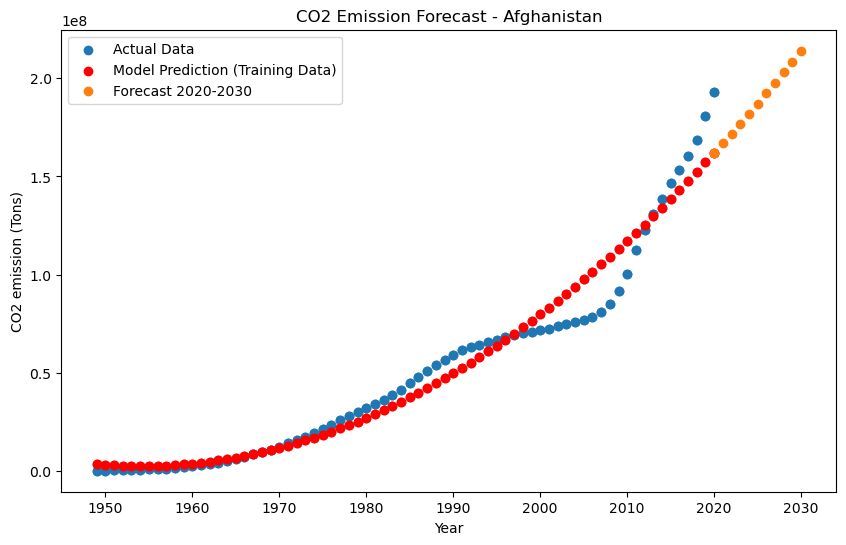

Albania Metrics:
Albania Predictions (2020-2030):
2020: 304614955.4290161
2021: 311098192.82736206
2022: 317645376.21466064
2023: 324256505.5908661
2024: 330931580.9560394
2025: 337670602.31015015
2026: 344473569.653183
2027: 351340482.98516846
2028: 358271342.30610657
2029: 365266147.6159973
2030: 372324898.91477966


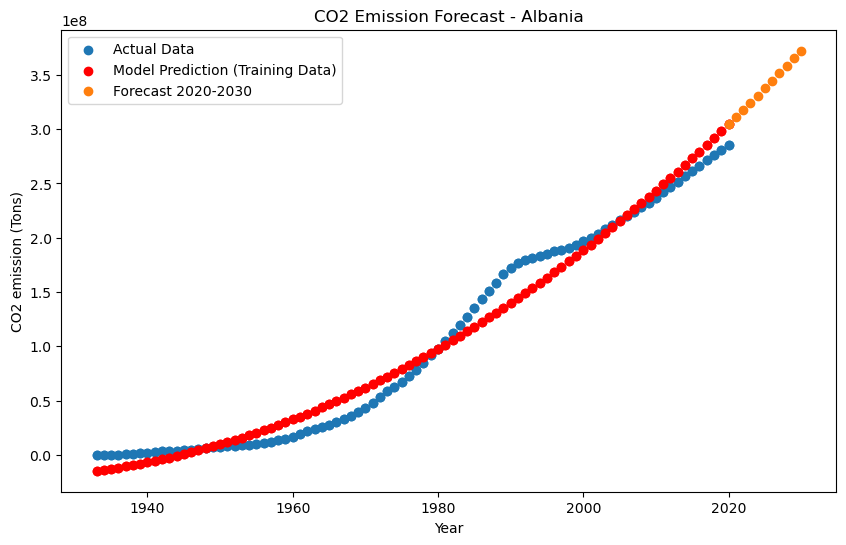

Algeria Metrics:
Algeria Predictions (2020-2030):
2020: 4218988622.328125
2021: 4338428776.812988
2022: 4459449740.343262
2023: 4582051512.917969
2024: 4706234094.538086
2025: 4831997485.202148
2026: 4959341684.912109
2027: 5088266693.666992
2028: 5218772511.466797
2029: 5350859138.312012
2030: 5484526574.200684


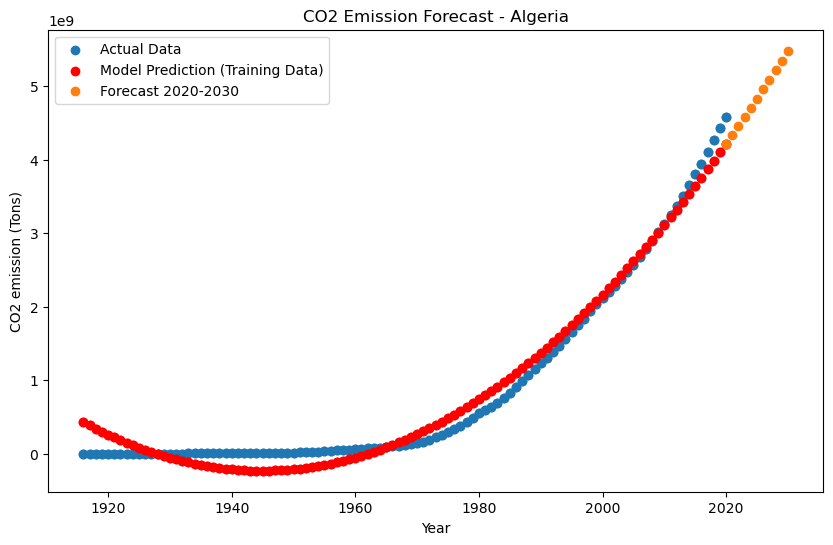

Andorra Metrics:
Andorra Predictions (2020-2030):
2020: 15234384.453077674
2021: 15751885.915459514
2022: 16270283.447994947
2023: 16789577.050684094
2024: 17309766.723526835
2025: 17830852.466522813
2026: 18352834.27967286
2027: 18875712.162976503
2028: 19399486.11643386
2029: 19924156.140044928
2030: 20449722.233809114


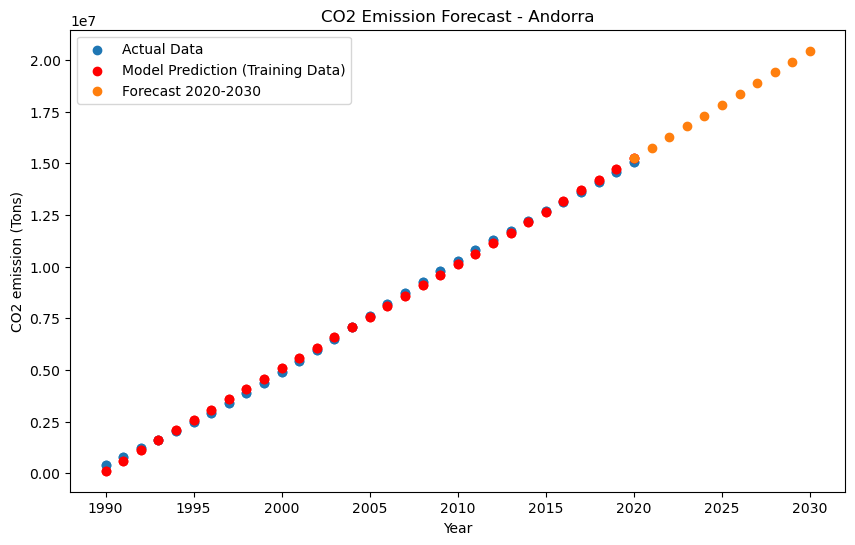

Angola Metrics:
Angola Predictions (2020-2030):
2020: 621412035.9351807
2021: 644981732.541748
2022: 668985399.9610596
2023: 693423038.1937256
2024: 718294647.239502
2025: 743600227.0982666
2026: 769339777.7698975
2027: 795513299.2548828
2028: 822120791.5528564
2029: 849162254.6640625
2030: 876637688.5880127


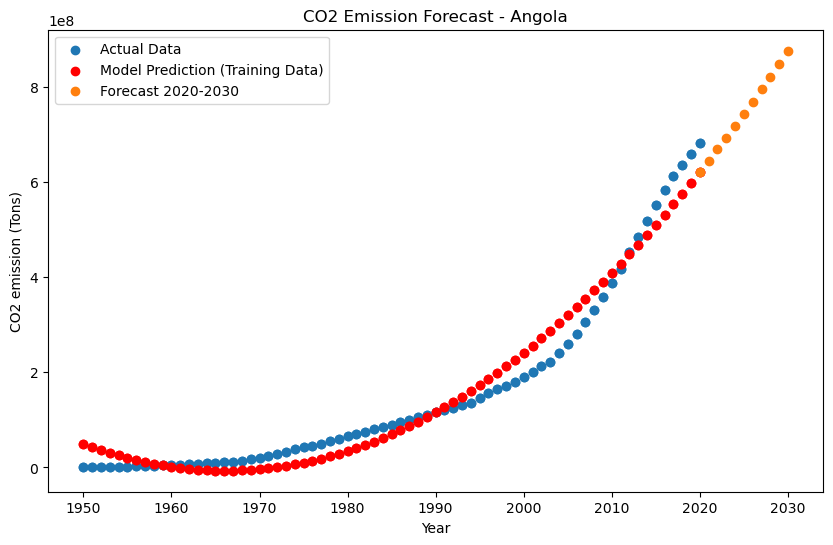

Anguilla Metrics:
Anguilla Predictions (2020-2030):
2020: 3523832.6646461487
2021: 3702724.2532310486
2022: 3885610.746673584
2023: 4072492.1449718475
2024: 4263368.448125839
2025: 4458239.656136513
2026: 4657105.769003868
2027: 4859966.786727905
2028: 5066822.709307671
2029: 5277673.536744118
2030: 5492519.269039154


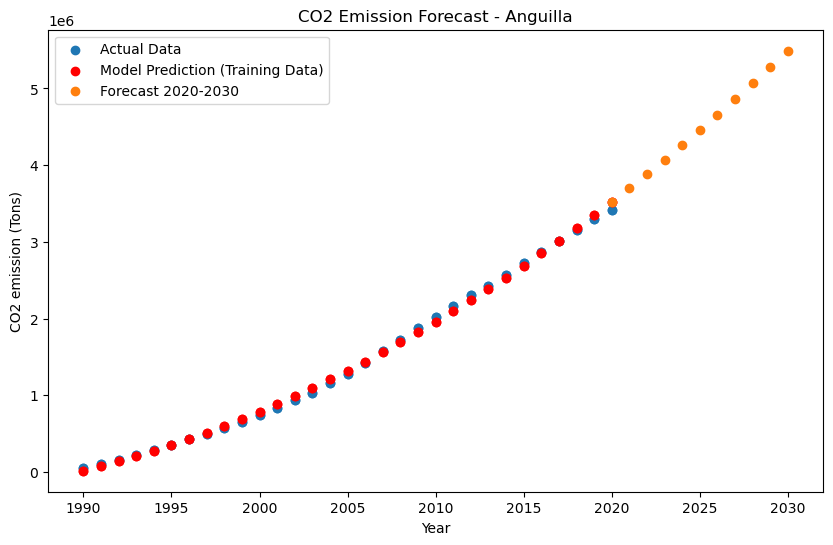

Antarctica Metrics:
Antarctica Predictions (2020-2030):
2020: 149740.5983170271
2021: 147227.40641486645
2022: 144308.17249560356
2023: 140982.89655947685
2024: 137251.57860660553
2025: 133114.2186369896
2026: 128570.81665050983
2027: 123621.37264716625
2028: 118265.88662695885
2029: 112504.35859000683
2030: 106336.7885363102


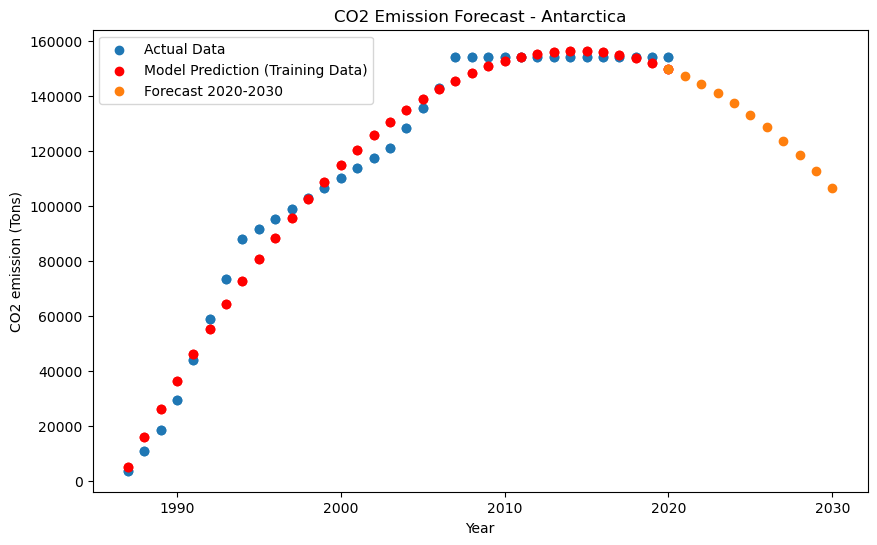

Antigua and Barbuda Metrics:
Antigua and Barbuda Predictions (2020-2030):
2020: 20378663.30446577
2021: 20701197.56855631
2022: 21023356.628364325
2023: 21345140.483889103
2024: 21666549.13513112
2025: 21987582.5820899
2026: 22308240.82476616
2027: 22628523.86315918
2028: 22948431.69726944
2029: 23267964.327096462
2030: 23587121.752640963


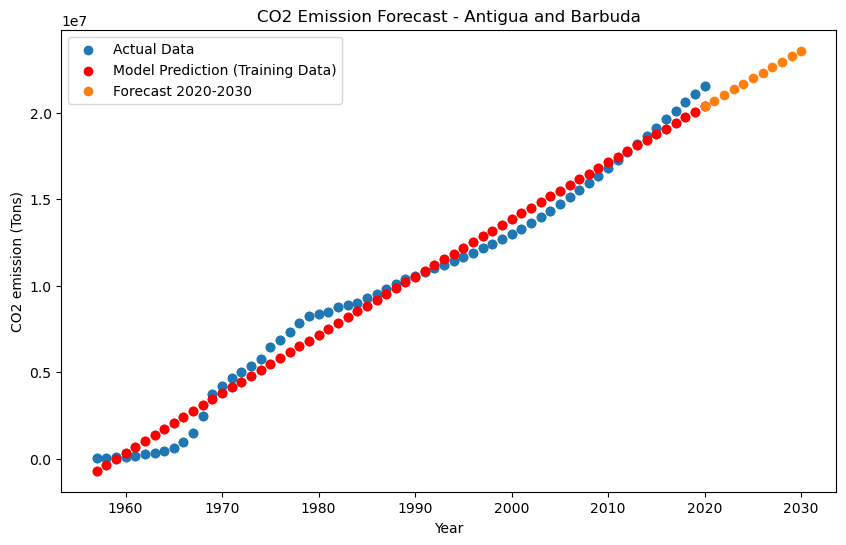

Argentina Metrics:
Argentina Predictions (2020-2030):
2020: 7973668986.169922
2021: 8135873889.702148
2022: 8299675209.946777
2023: 8465072946.903809
2024: 8632067100.574219
2025: 8800657670.957031
2026: 8970844658.05371
2027: 9142628061.862305
2028: 9316007882.3833
2029: 9490984119.617188
2030: 9667556773.563965


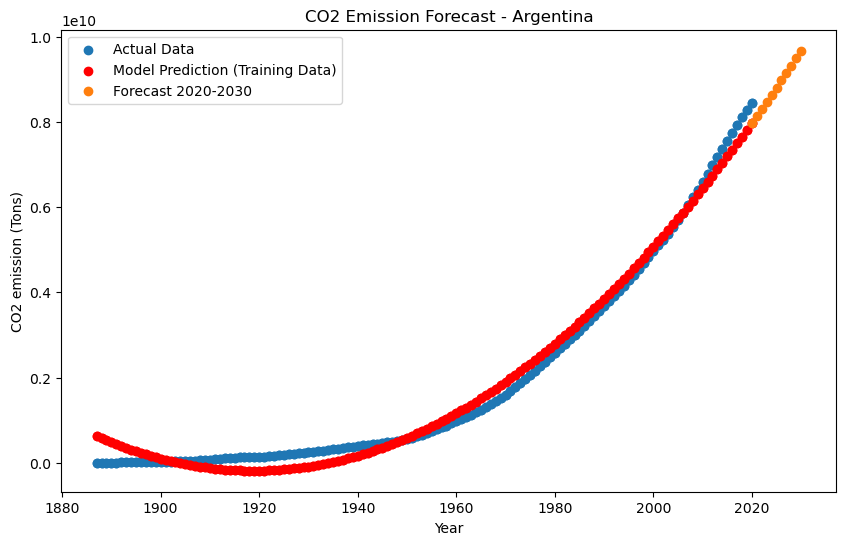

Armenia Metrics:
Armenia Predictions (2020-2030):
2020: 375923345.8917694
2021: 382024741.78504944
2022: 388171960.9431
2023: 394365003.36590576
2024: 400603869.0534668
2025: 406888558.0057831
2026: 413219070.2228699
2027: 419595405.7047119
2028: 426017564.45132446
2029: 432485546.46269226
2030: 438999351.7388153


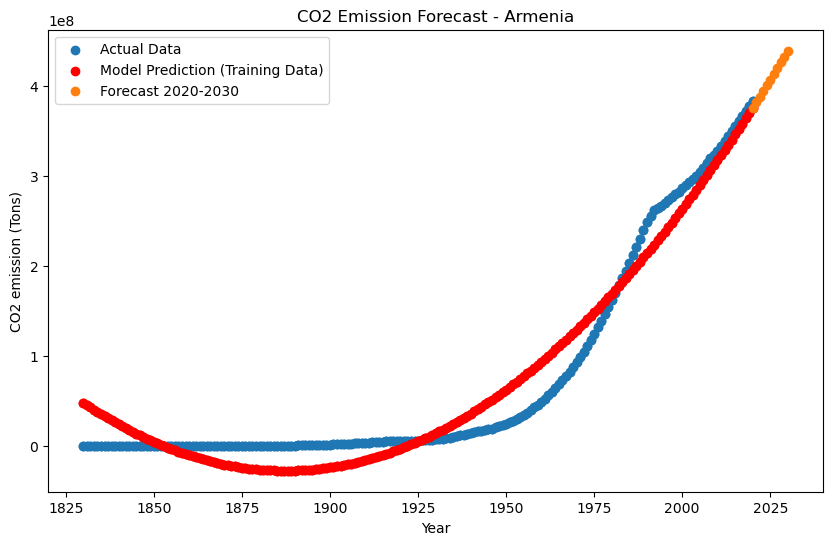

Aruba Metrics:
Aruba Predictions (2020-2030):
2020: 76375135.23751831
2021: 78100364.17573547
2022: 79845225.50814056
2023: 81609719.23475647
2024: 83393845.35558319
2025: 85197603.87059021
2026: 87020994.77981567
2027: 88864018.08324432
2028: 90726673.7808609
2029: 92608961.8726883
2030: 94510882.35871887


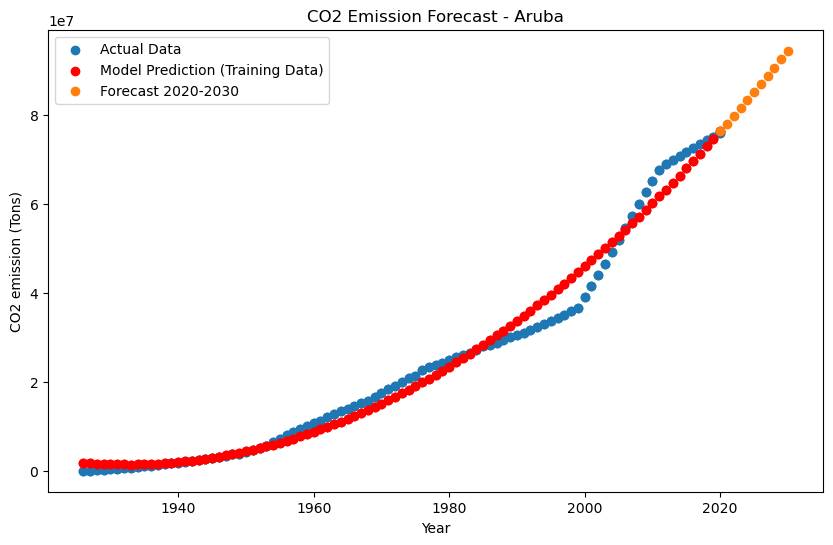

Australia Metrics:
Australia Predictions (2020-2030):
2020: 16369314322.282227
2021: 16672658211.155273
2022: 16978648961.06836
2023: 17287286572.02246
2024: 17598571044.015625
2025: 17912502377.051758
2026: 18229080571.125
2027: 18548305626.23828
2028: 18870177542.39453
2029: 19194696319.58789
2030: 19521861957.822266


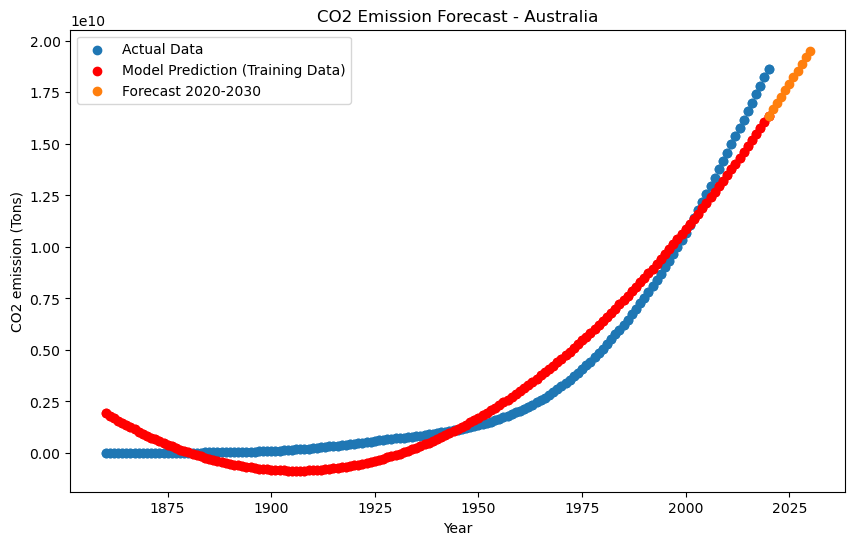

Austria Metrics:
Austria Predictions (2020-2030):
2020: 5159717810.314331
2021: 5218213858.025391
2022: 5277038328.742432
2023: 5336191222.465576
2024: 5395672539.194824
2025: 5455482278.930176
2026: 5515620441.671509
2027: 5576087027.418945
2028: 5636882036.172485
2029: 5698005467.932251
2030: 5759457322.697876


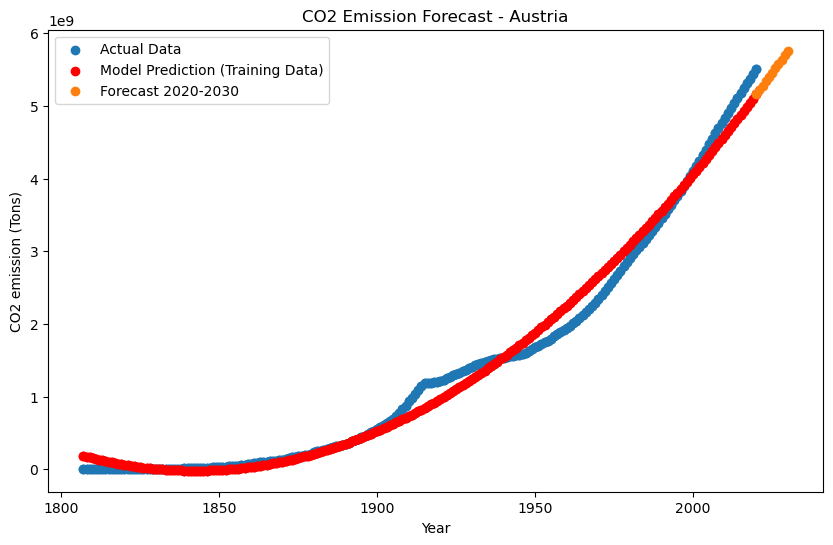

Azerbaijan Metrics:
Azerbaijan Predictions (2020-2030):
2020: 2382325929.7888794
2021: 2421591901.7738037
2022: 2461155813.6500244
2023: 2501017665.4176636
2024: 2541177457.076721
2025: 2581635188.627075
2026: 2622390860.069031
2027: 2663444471.4021606
2028: 2704796022.626587
2029: 2746445513.7424316
2030: 2788392944.749634


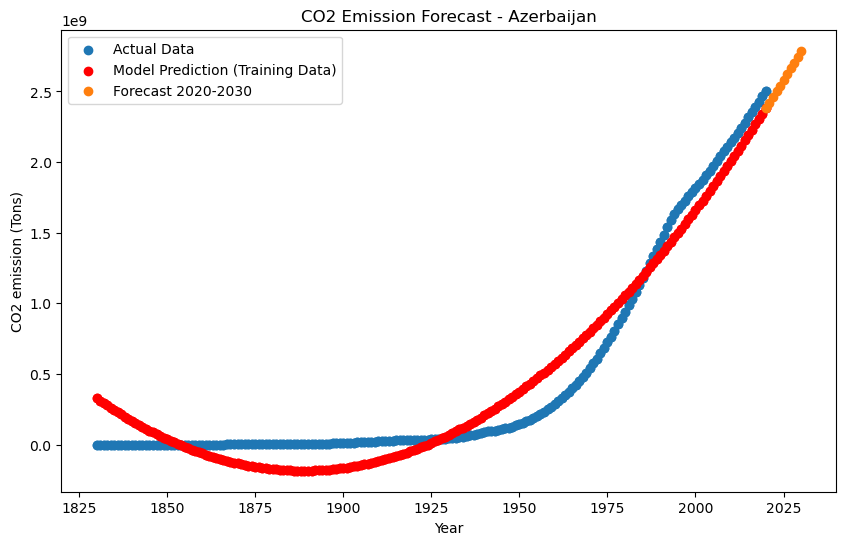

Bahamas Metrics:
Bahamas Predictions (2020-2030):
2020: 171609531.52108765
2021: 173690983.2392273
2022: 175751668.57498932
2023: 177791587.52835083
2024: 179810740.09934235
2025: 181809126.28795624
2026: 183786746.094162
2027: 185743599.51800537
2028: 187679686.55945587
2029: 189595007.2185135
2030: 191489561.4952011


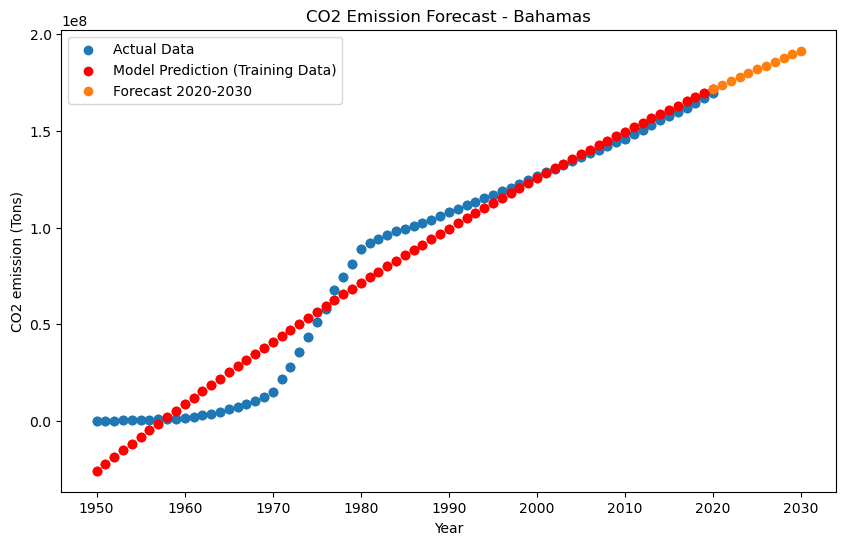

Bahrain Metrics:
Bahrain Predictions (2020-2030):
2020: 844492634.4240723
2021: 869491333.3566895
2022: 894857672.8856201
2023: 920591653.010498
2024: 946693273.7319336
2025: 973162535.0496826
2026: 999999436.9633789
2027: 1027203979.4737549
2028: 1054776162.5803223
2029: 1082715986.282959
2030: 1111023450.5820312


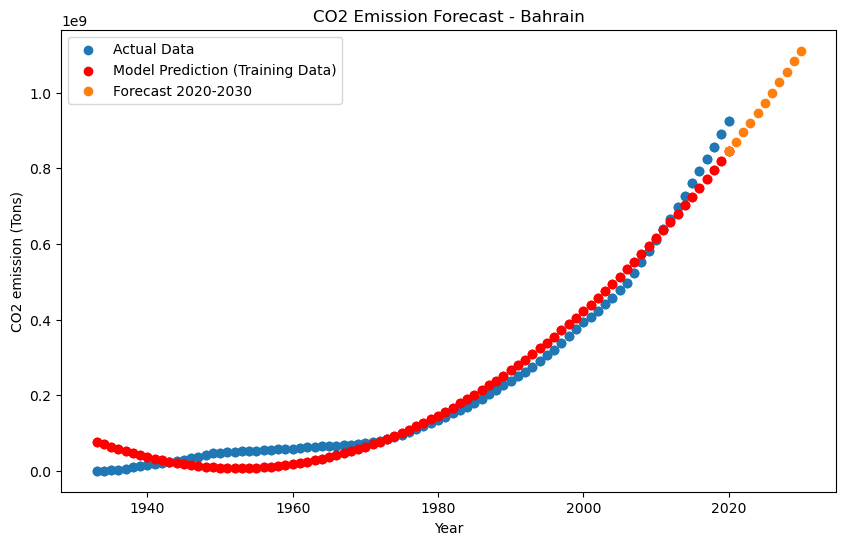

Bangladesh Metrics:
Bangladesh Predictions (2020-2030):
2020: 1325738420.0029297
2021: 1376020959.3181152
2022: 1427213942.6516113
2023: 1479317370.003418
2024: 1532331241.3735352
2025: 1586255556.761963
2026: 1641090316.1694336
2027: 1696835519.5947266
2028: 1753491167.0385742
2029: 1811057258.5004883
2030: 1869533793.980957


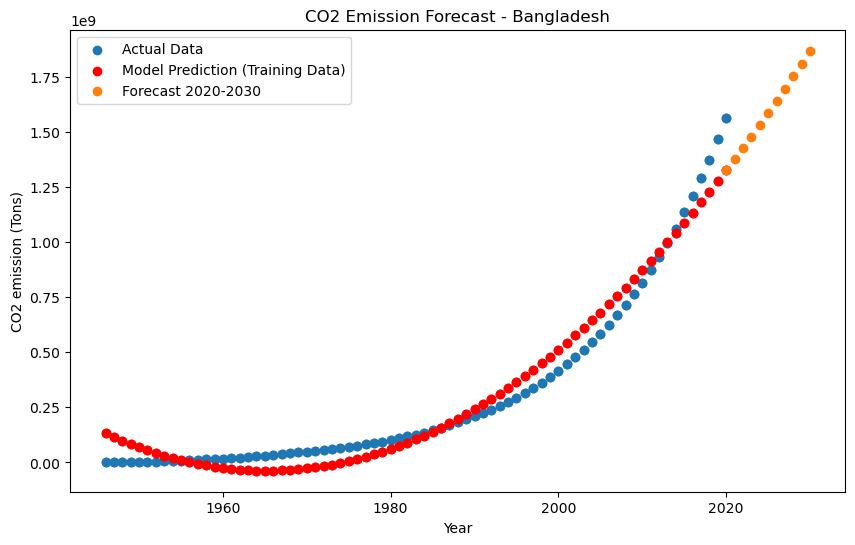

Barbados Metrics:
Barbados Predictions (2020-2030):
2020: 55467703.39933014
2021: 57016917.66316986
2022: 58587069.02233124
2023: 60178157.47680664
2024: 61790183.02659607
2025: 63423145.671699524
2026: 65077045.412124634
2027: 66751882.24786377
2028: 68447656.17891693
2029: 70164367.20529175
2030: 71902015.32698059


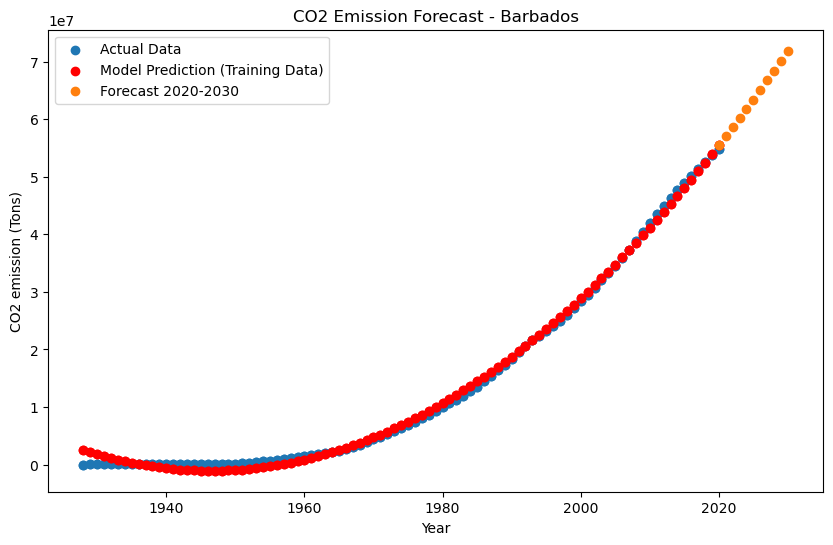

Belarus Metrics:
Belarus Predictions (2020-2030):
2020: 4817349965.504395
2021: 4896204202.518677
2022: 4975654017.947266
2023: 5055699411.789795
2024: 5136340384.047119
2025: 5217576934.71875
2026: 5299409063.80481
2027: 5381836771.3046875
2028: 5464860057.21936
2029: 5548478921.548462
2030: 5632693364.291382


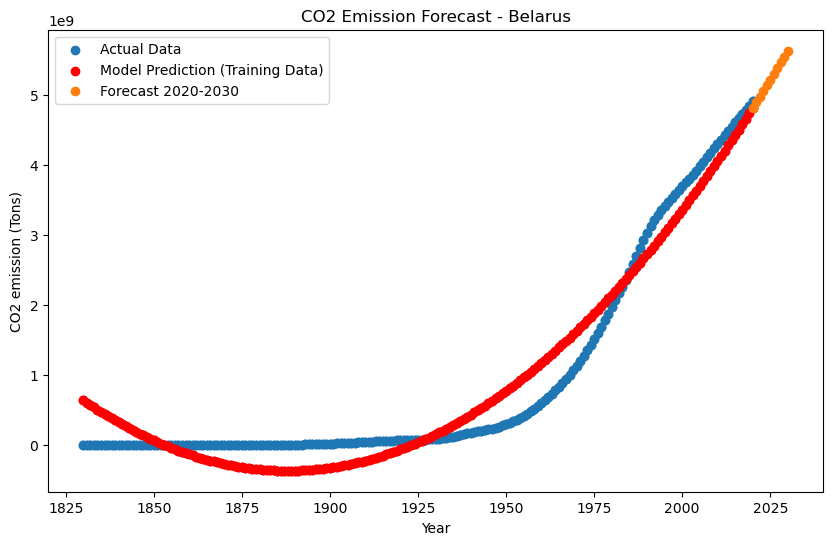

Belgium Metrics:
Belgium Predictions (2020-2030):
2020: 12808549671.558594
2021: 12948168294.537354
2022: 13088539869.408691
2023: 13229664396.173584
2024: 13371541874.831055
2025: 13514172305.38208
2026: 13657555687.82544
2027: 13801692022.162354
2028: 13946581308.39209
2029: 14092223546.515137
2030: 14238618736.530518


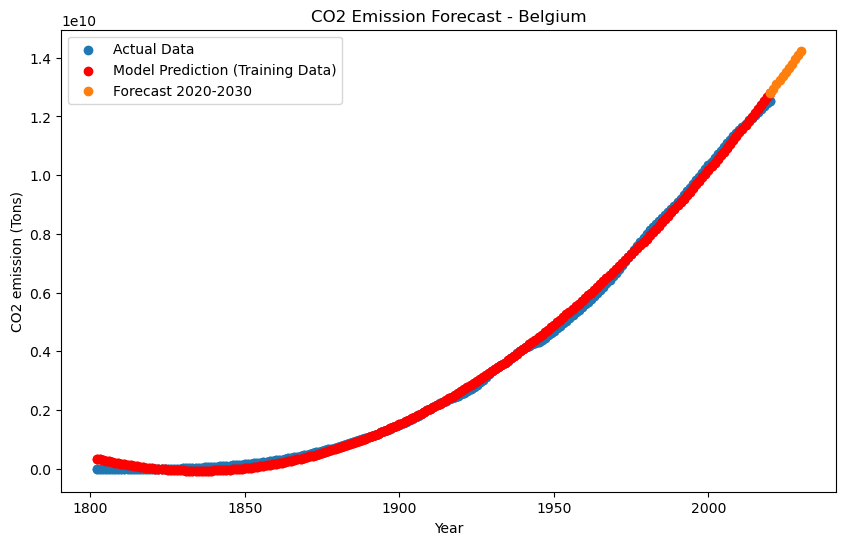

Belize Metrics:
Belize Predictions (2020-2030):
2020: 18776567.060863495
2021: 19361059.319984436
2022: 19954606.454208374
2023: 20557208.463550568
2024: 21168865.348007202
2025: 21789577.10756302
2026: 22419343.74223709
2027: 23058165.25202179
2028: 23706041.636909485
2029: 24362972.896915436
2030: 25028959.032032013


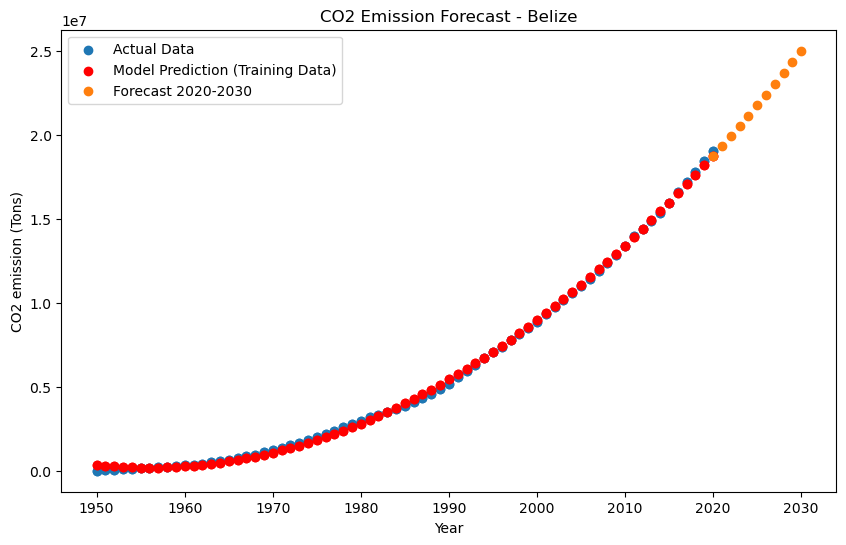

Benin Metrics:
Benin Predictions (2020-2030):
2020: 95602168.29785156
2021: 99907460.55993652
2022: 104305652.90597534
2023: 108796745.33605957
2024: 113380737.8500061
2025: 118057630.44793701
2026: 122827423.12988281
2027: 127690115.89572144
2028: 132645708.74551392
2029: 137694201.6793518
2030: 142835594.697052


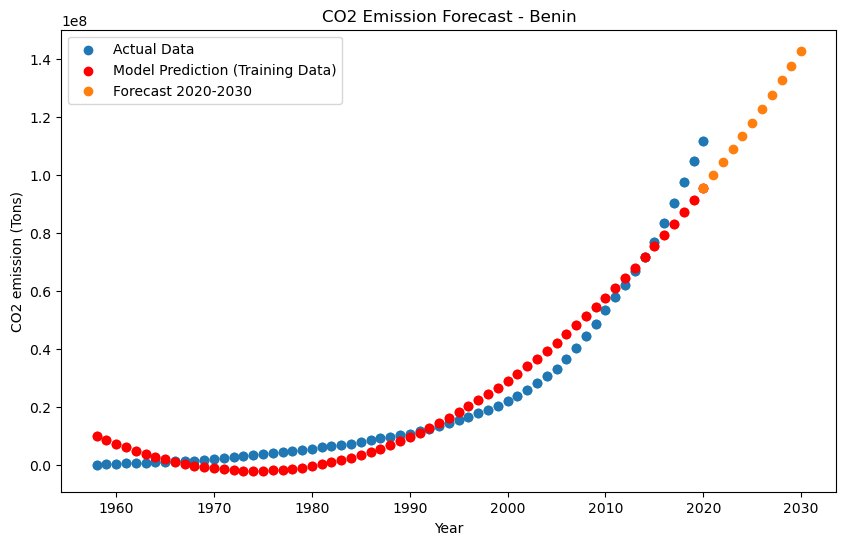

Bermuda Metrics:
Bermuda Predictions (2020-2030):
2020: 29963801.763736725
2021: 30702037.71583557
2022: 31448747.052768707
2023: 32203929.774539948
2024: 32967585.881149292
2025: 33739715.37259483
2026: 34520318.2488842
2027: 35309394.51000595
2028: 36106944.15596771
2029: 36912967.18676567
2030: 37727463.60240555


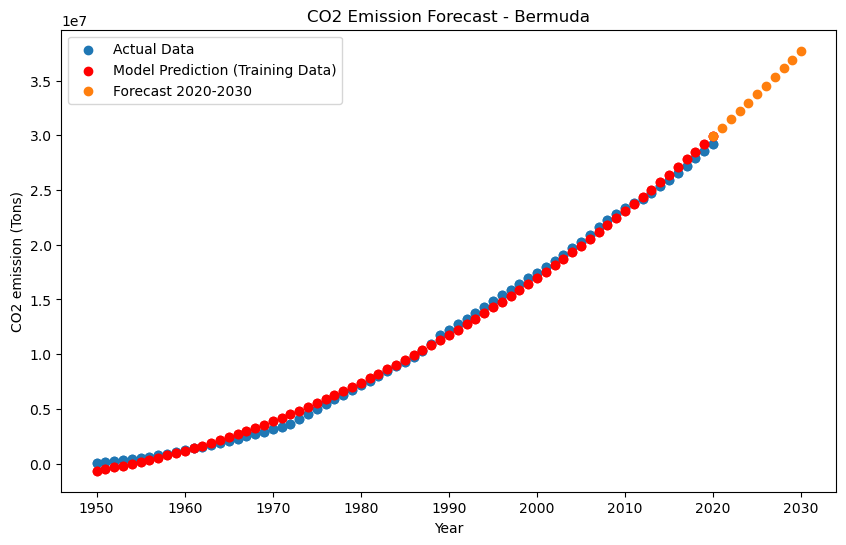

Bhutan Metrics:
Bhutan Predictions (2020-2030):
2020: 16124902.354400635
2021: 16996969.411834717
2022: 17891486.19291687
2023: 18808452.69760132
2024: 19747868.925933838
2025: 20709734.87789154
2026: 21694050.553466797
2027: 22700815.952682495
2028: 23730031.075508118
2029: 24781695.921974182
2030: 25855810.49207306


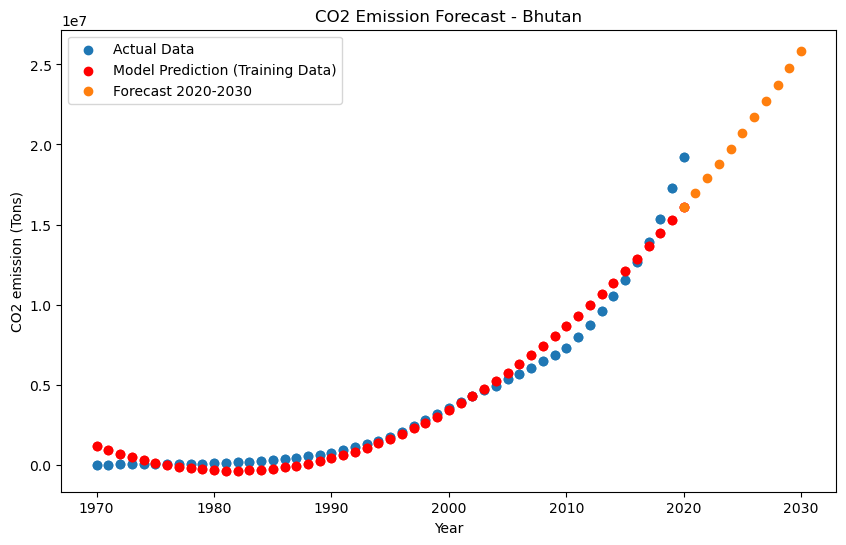

Bolivia Metrics:
Bolivia Predictions (2020-2030):
2020: 461362433.62091064
2021: 475330467.6680298
2022: 489500224.24346924
2023: 503871703.34729004
2024: 518444904.9795532
2025: 533219829.14001465
2026: 548196475.8287964
2027: 563374845.0459595
2028: 578754936.7914429
2029: 594336751.0652466
2030: 610120287.8673706


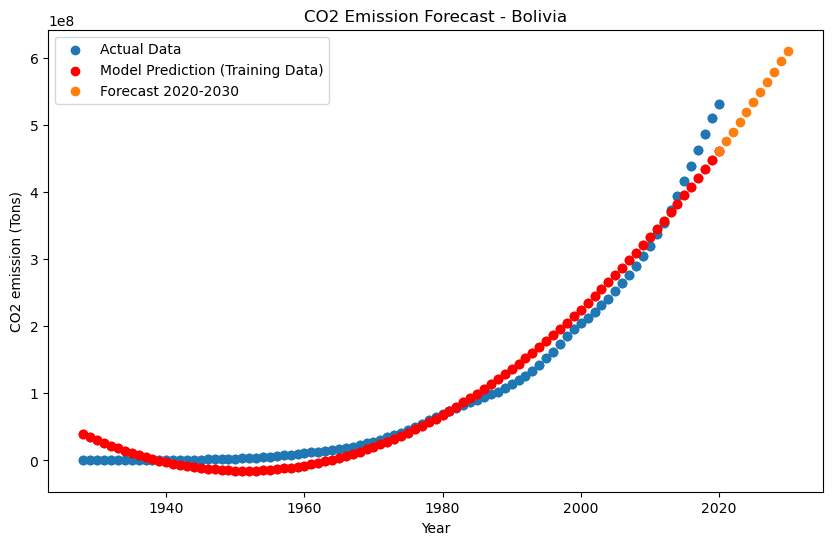

Bosnia and Herzegovina Metrics:
Bosnia and Herzegovina Predictions (2020-2030):
2020: 914928209.8972168
2021: 933902084.4753418
2022: 953063493.123169
2023: 972412435.8405762
2024: 991948912.6276855
2025: 1011672923.484436
2026: 1031584468.4108276
2027: 1051683547.4069214
2028: 1071970160.4726562
2029: 1092444307.6080322
2030: 1113105988.8130493


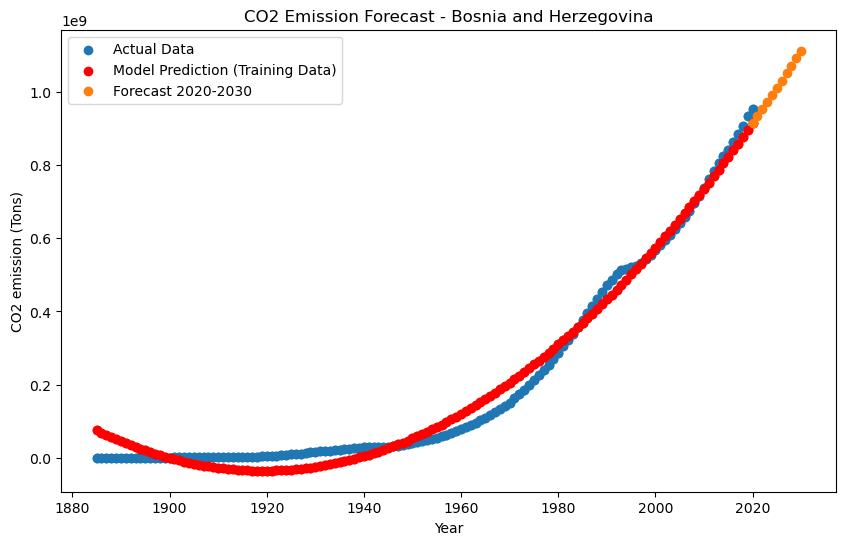

Botswana Metrics:
Botswana Predictions (2020-2030):
2020: 147478375.80984497
2021: 153935951.75186157
2022: 160532840.56103516
2023: 167269042.23742676
2024: 174144556.78100586
2025: 181159384.19192505
2026: 188313524.46990967
2027: 195606977.6151123
2028: 203039743.62750244
2029: 210611822.50708008
2030: 218323214.2539978


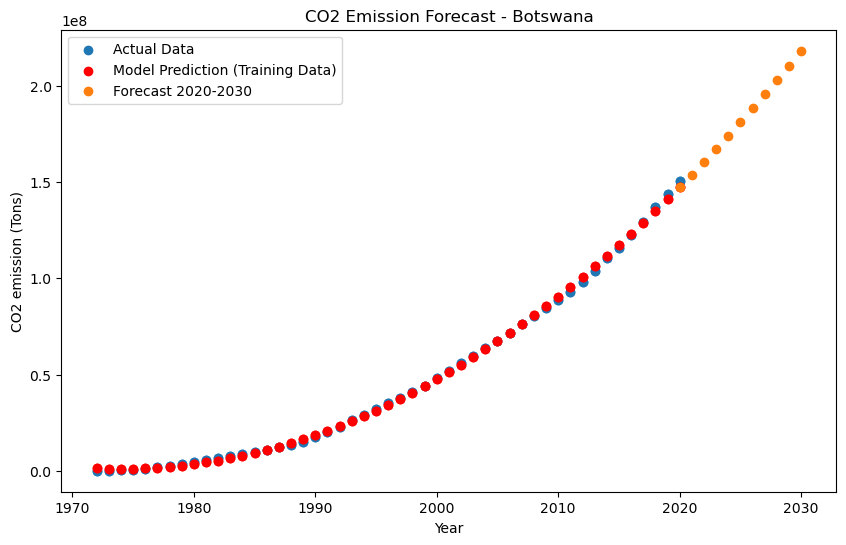

Brazil Metrics:
Brazil Predictions (2020-2030):
2020: 14344168972.714844
2021: 14702318789.66211
2022: 15064660824.5
2023: 15431195077.230469
2024: 15801921547.853516
2025: 16176840236.36621
2026: 16555951142.769531
2027: 16939254267.066406
2028: 17326749609.25293
2029: 17718437169.331055
2030: 18114316947.299805


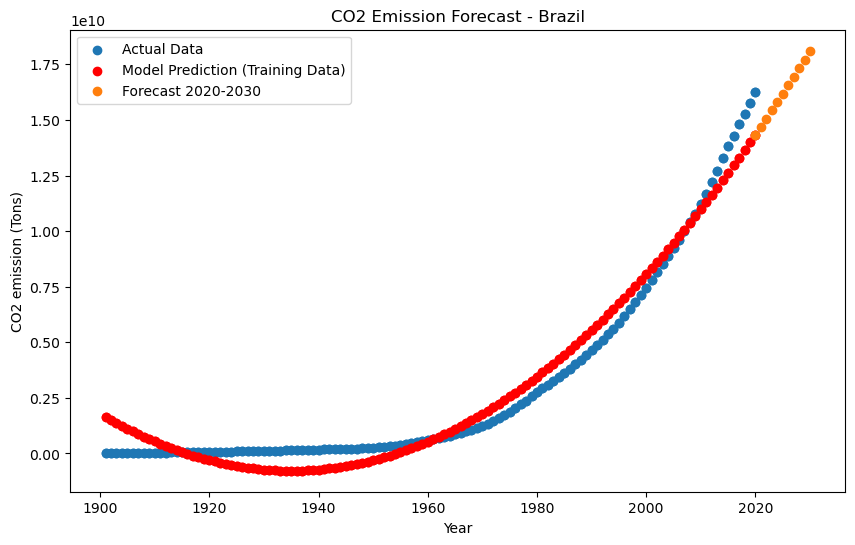

Brunei Metrics:
Brunei Predictions (2020-2030):
2020: 351133141.33413696
2021: 359019895.68618774
2022: 366995043.03622437
2023: 375058583.3841858
2024: 383210516.73013306
2025: 391450843.07403564
2026: 399779562.41589355
2027: 408196674.7557373
2028: 416702180.09350586
2029: 425296078.42926025
2030: 433978369.76293945


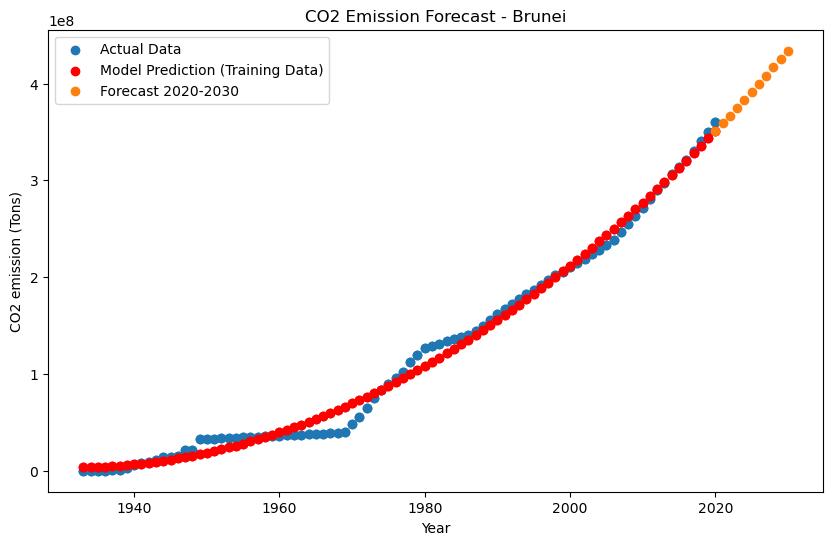

Bulgaria Metrics:
Bulgaria Predictions (2020-2030):
2020: 4165511329.2351074
2021: 4249703321.3479004
2022: 4334702575.762451
2023: 4420509092.47876
2024: 4507122871.496582
2025: 4594543912.816162
2026: 4682772216.4375
2027: 4771807782.360352
2028: 4861650610.584961
2029: 4952300701.111328
2030: 5043758053.939209


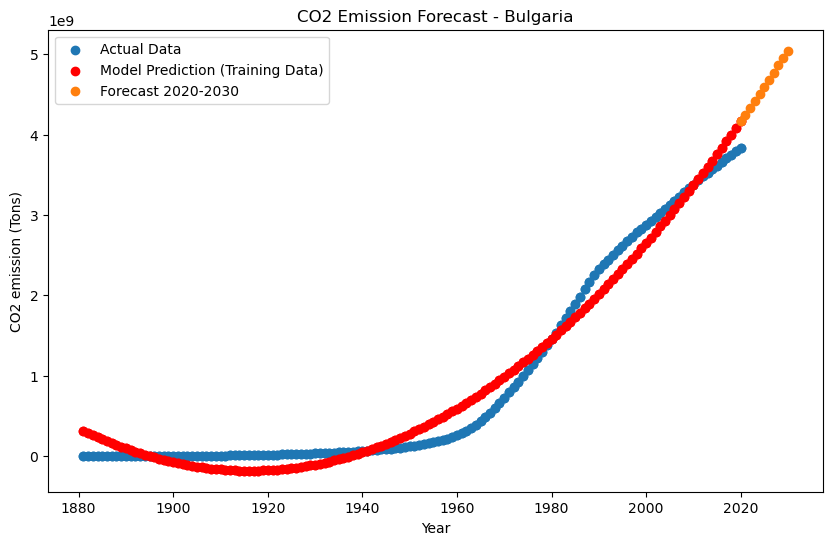

Burkina Faso Metrics:
Burkina Faso Predictions (2020-2030):
2020: 54780895.30517578
2021: 57060784.93052673
2022: 59387039.01132202
2023: 61759657.54762268
2024: 64178640.53939819
2025: 66643987.98666382
2026: 69155699.88937378
2027: 71713776.24760437
2028: 74318217.06129456
2029: 76969022.33047485
2030: 79666192.05509949


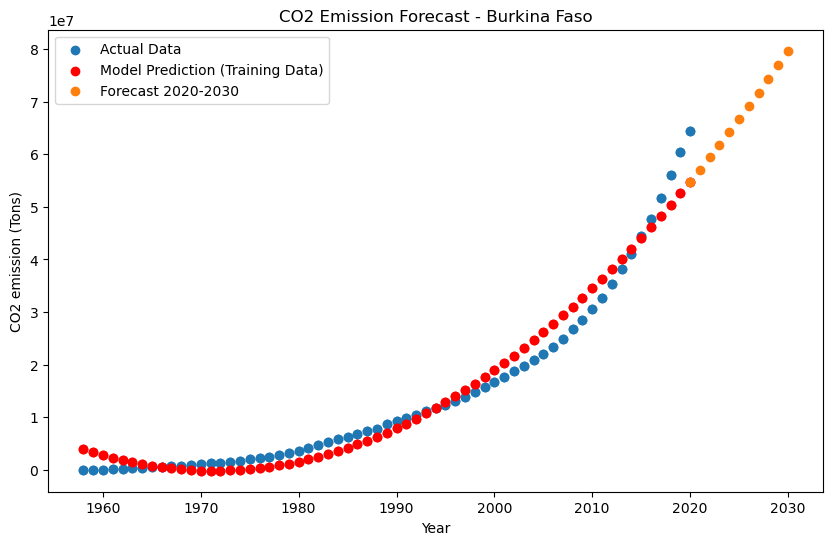

Burundi Metrics:
Burundi Predictions (2020-2030):
2020: 12161546.557605743
2021: 12536544.006225586
2022: 12917250.679750443
2023: 13303666.578178406
2024: 13695791.701509476
2025: 14093626.049743652
2026: 14497169.622880936
2027: 14906422.420921326
2028: 15321384.44386673
2029: 15742055.691713333
2030: 16168436.16446495


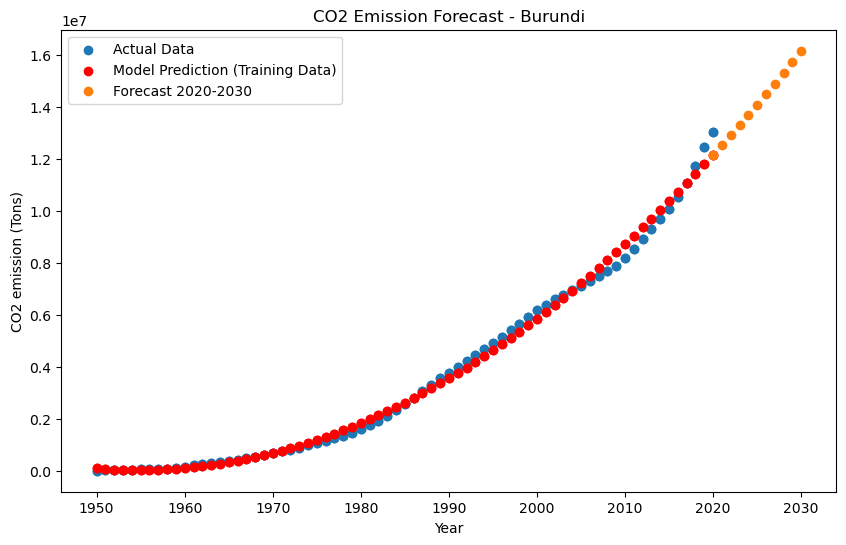

Cambodia Metrics:
Cambodia Predictions (2020-2030):
2020: 117973117.42443848
2021: 123211625.9133606
2022: 128561132.34005737
2023: 134021636.70465088
2024: 139593139.00698853
2025: 145275639.24713135
2026: 151069137.42507935
2027: 156973633.54083252
2028: 162989127.5944519
2029: 169115619.58584595
2030: 175353109.51501465


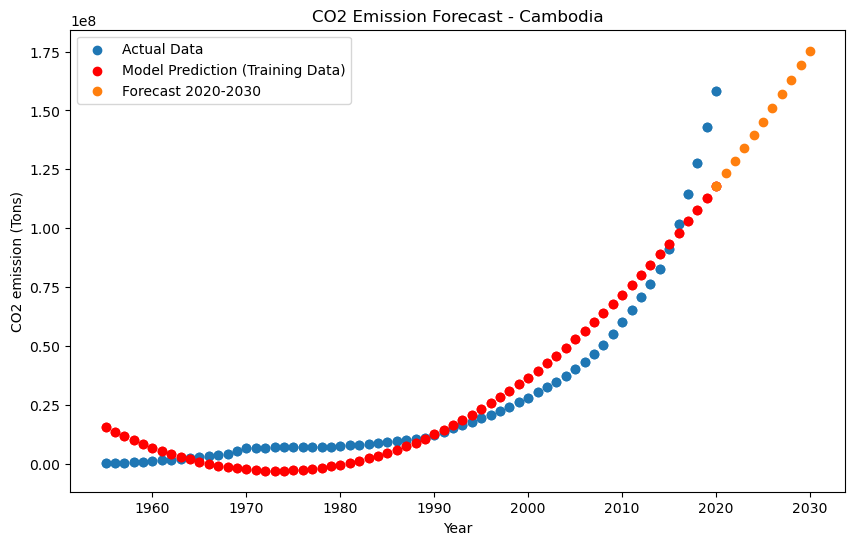

Cameroon Metrics:
Cameroon Predictions (2020-2030):
2020: 209481766.91604614
2021: 216070892.68112183
2022: 222761783.83590698
2023: 229554440.3803711
2024: 236448862.31451416
2025: 243445049.6383667
2026: 250543002.3518982
2027: 257742720.45513916
2028: 265044203.94805908
2029: 272447452.8306885
2030: 279952467.1029663


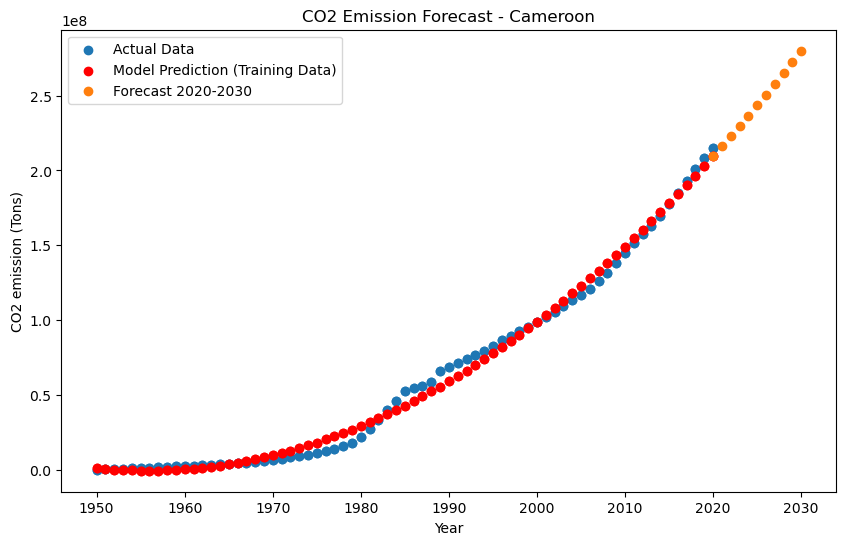

Canada Metrics:
Canada Predictions (2020-2030):
2020: 28039200319.180664
2021: 28418575502.36328
2022: 28800305368.848145
2023: 29184389918.63379
2024: 29570829151.717773
2025: 29959623068.104492
2026: 30350771667.79004
2027: 30744274950.777832
2028: 31140132917.064453
2029: 31538345566.65381
2030: 31938912899.543945


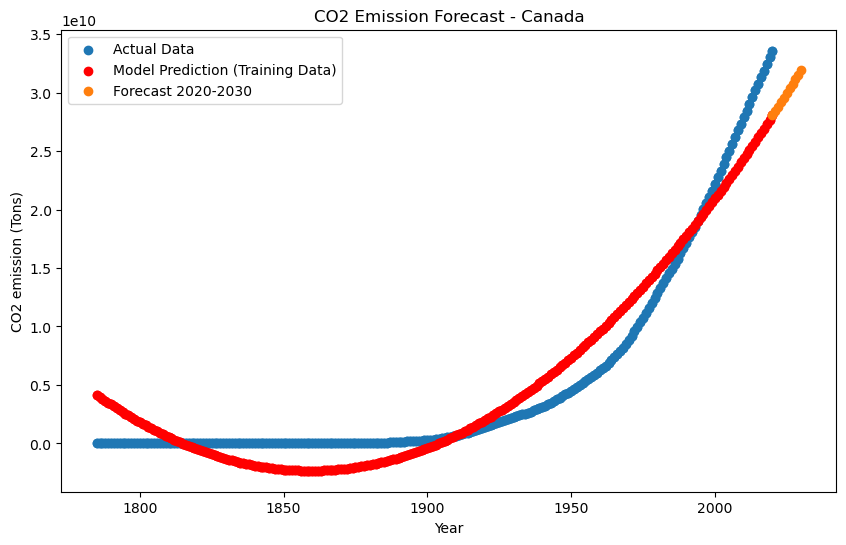

Cape Verde Metrics:
Cape Verde Predictions (2020-2030):
2020: 11993856.50605774
2021: 12440447.598011017
2022: 12895272.23526001
2023: 13358330.417808533
2024: 13829622.145656586
2025: 14309147.418800354
2026: 14796906.237243652
2027: 15292898.600982666
2028: 15797124.51002121
2029: 16309583.964357376
2030: 16830276.963993073


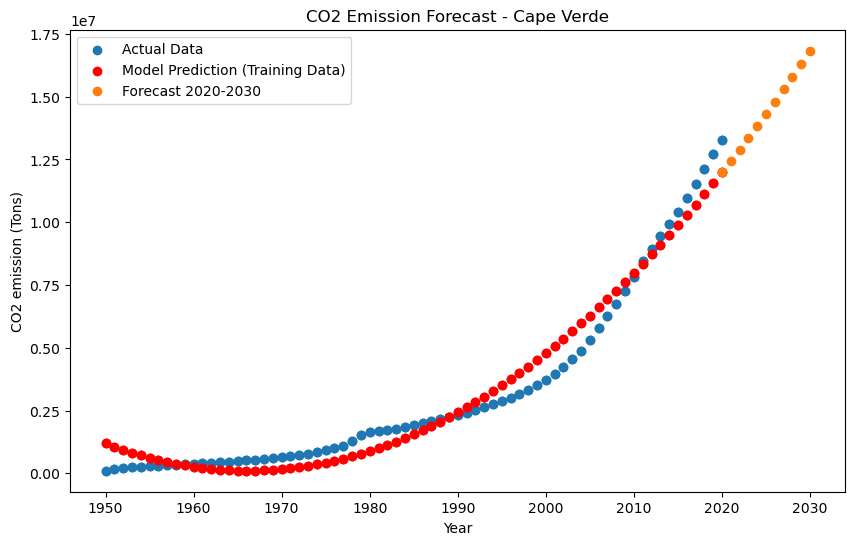

Central African Republic Metrics:
Central African Republic Predictions (2020-2030):
2020: 10851732.940225601
2021: 11091673.962492466
2022: 11333546.75794077
2023: 11577351.32657051
2024: 11823087.668382168
2025: 12070755.783375263
2026: 12320355.671549797
2027: 12571887.33290577
2028: 12825350.767443657
2029: 13080745.975162983
2030: 13338072.956063747


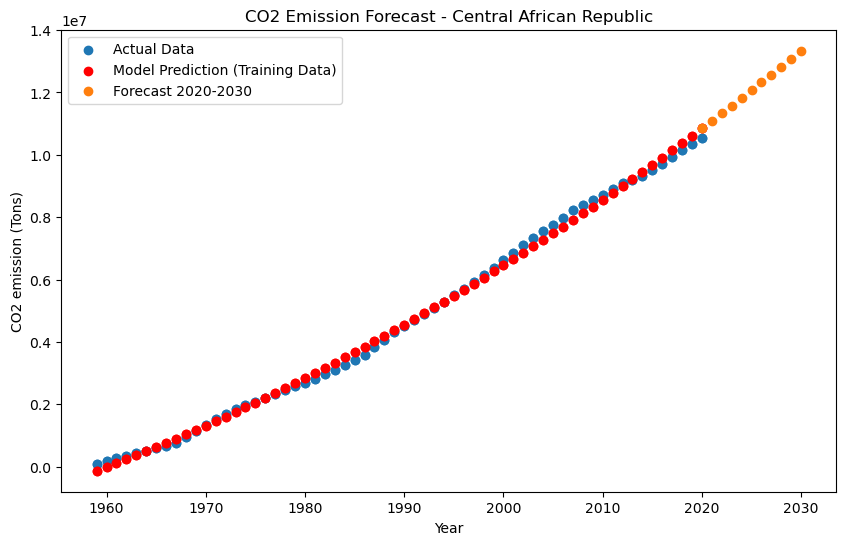

Chad Metrics:
Chad Predictions (2020-2030):
2020: 25285025.333625793
2021: 26232314.416740417
2022: 27197490.021385193
2023: 28180552.14753723
2024: 29181500.79524231
2025: 30200335.96446228
2026: 31237057.65522003
2027: 32291665.867515564
2028: 33364160.60131836
2029: 34454541.856674194
2030: 35562809.63353729


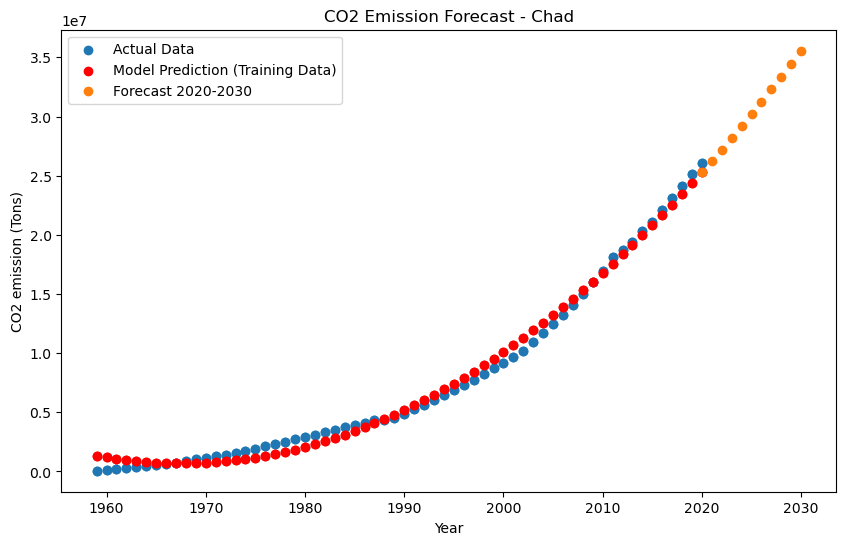

Chile Metrics:
Chile Predictions (2020-2030):
2020: 2548850149.4350586
2021: 2603301432.7720947
2022: 2658321238.0925293
2023: 2713909565.3966064
2024: 2770066414.6846924
2025: 2826791785.956909
2026: 2884085679.2125244
2027: 2941948094.4519043
2028: 3000379031.675171
2029: 3059378490.8825684
2030: 3118946472.0733643


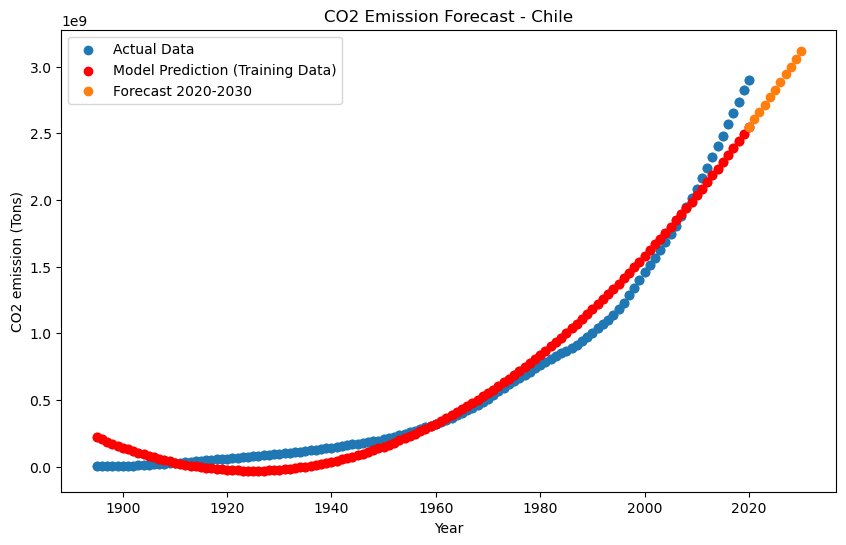

China Metrics:
China Predictions (2020-2030):
2020: 115980083157.26562
2021: 118753617547.32031
2022: 121558404775.80469
2023: 124394444842.73438
2024: 127261737748.09375
2025: 130160283491.91406
2026: 133090082074.14844
2027: 136051133494.82812
2028: 139043437753.9375
2029: 142066994851.4922
2030: 145121804787.48438


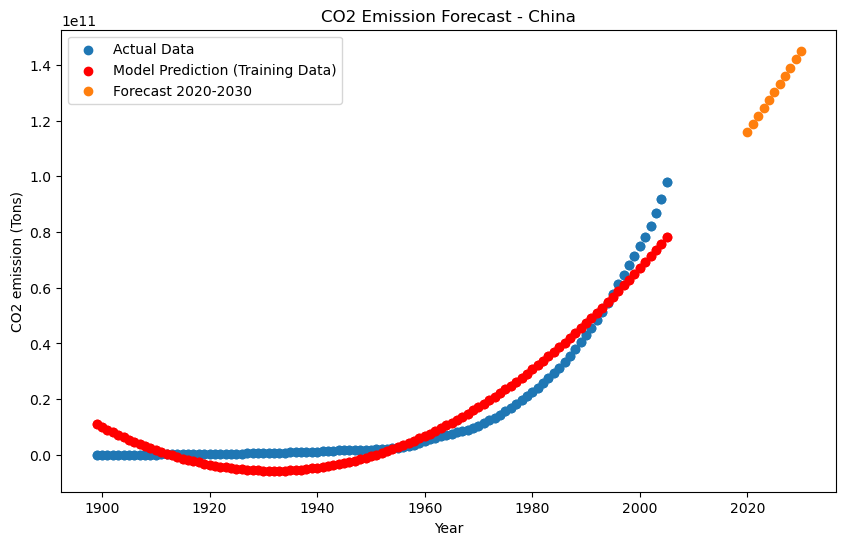

Christmas Island Metrics:
Christmas Island Predictions (2020-2030):
2020: 1130383.5711097717
2021: 1091430.7365560532
2022: 1050297.9261550903
2023: 1006985.1399106979
2024: 961492.3778190613
2025: 913819.6398820877
2026: 863966.9261007309
2027: 811934.2364730835
2028: 757721.5710010529
2029: 701328.929681778
2030: 642756.3125200272


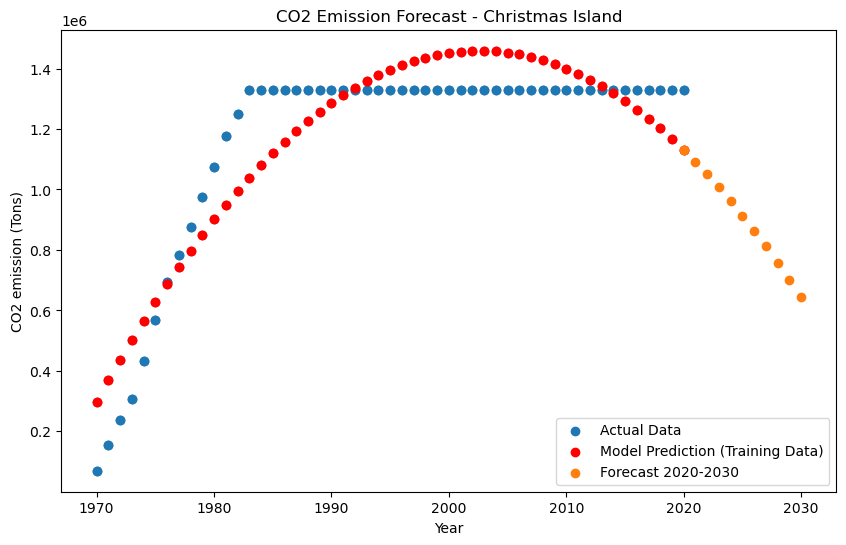

Colombia Metrics:
Colombia Predictions (2020-2030):
2020: 3338284009.8896484
2021: 3421571474.0703125
2022: 3505874902.0961914
2023: 3591194293.967285
2024: 3677529649.6835938
2025: 3764880969.245117
2026: 3853248252.6518555
2027: 3942631499.9035645
2028: 4033030711.0007324
2029: 4124445885.942871
2030: 4216877024.7302246


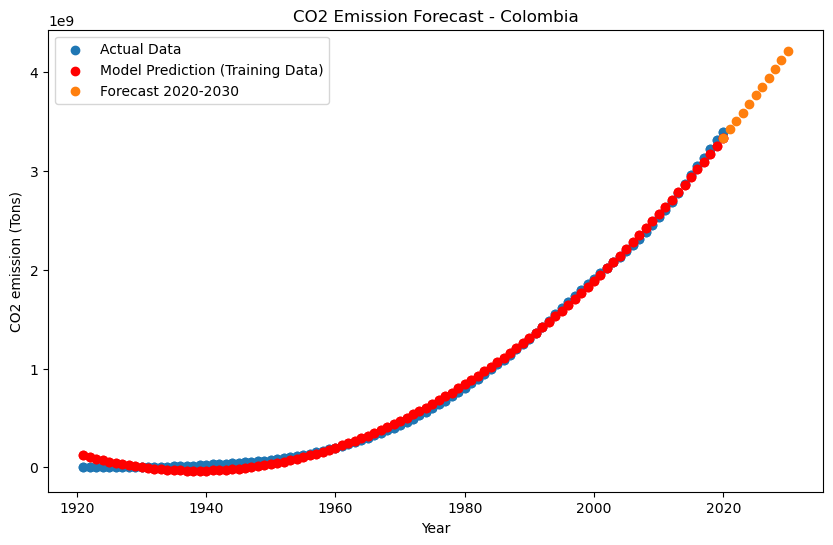

Comoros Metrics:
Comoros Predictions (2020-2030):
2020: 4877020.582980156
2021: 5058943.850905418
2022: 5244273.653731346
2023: 5433009.9914598465
2024: 5625152.8640909195
2025: 5820702.271624565
2026: 6019658.21405983
2027: 6222020.691396713
2028: 6427789.703636169
2029: 6636965.250779152
2030: 6849547.3328228


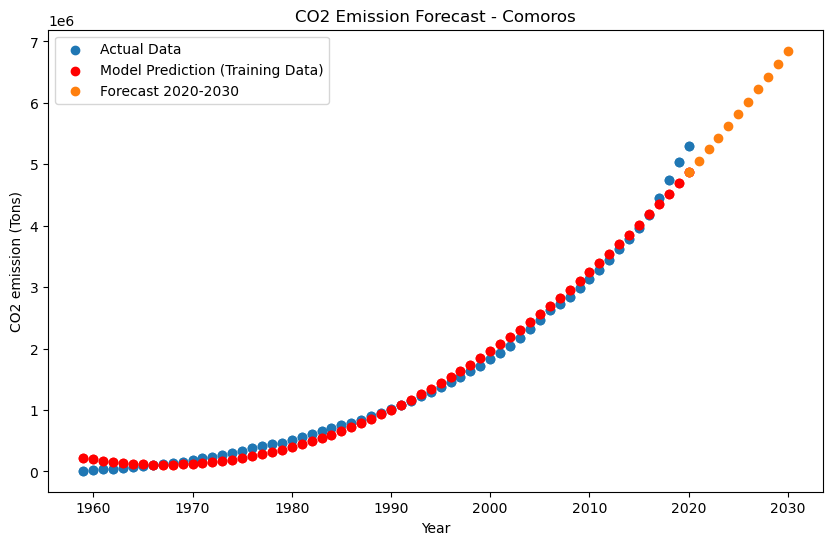

Congo Metrics:
Congo Predictions (2020-2030):
2020: 71058450.80238342
2021: 73195173.3454361
2022: 75363638.12194824
2023: 77563845.1319046
2024: 79795794.37528992
2025: 82059485.85212708
2026: 84354919.56239319
2027: 86682095.50611115
2028: 89041013.68325806
2029: 91431674.09386444
2030: 93854076.73790741


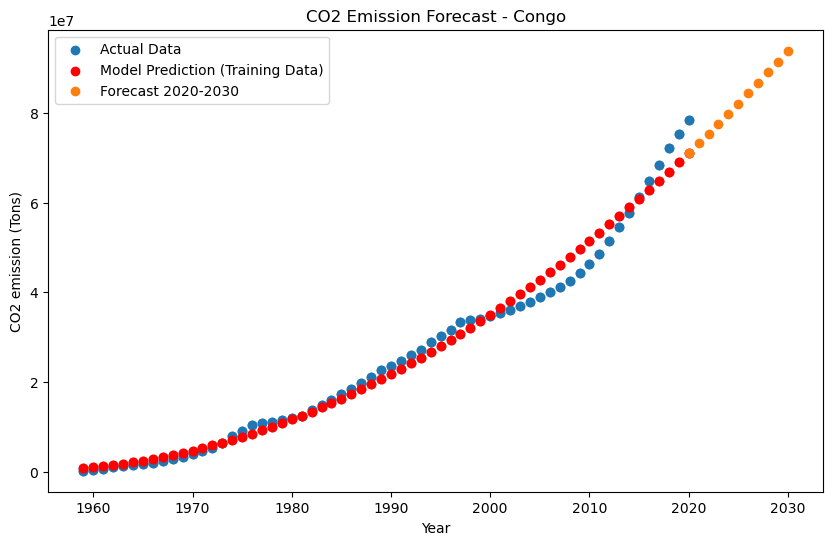

Cook Islands Metrics:
Cook Islands Predictions (2020-2030):
2020: 2143502.604957819
2021: 2212729.912006855
2022: 2283002.24153924
2023: 2354319.5935544968
2024: 2426681.9680523872
2025: 2500089.3650341034
2026: 2574541.7844986916
2027: 2650039.22644639
2028: 2726581.690877199
2029: 2804169.1777911186
2030: 2882801.687188387


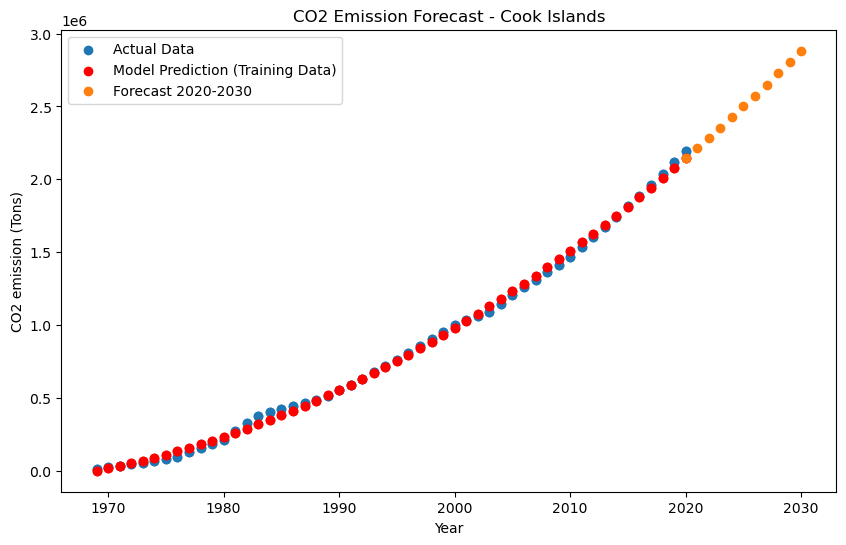

Costa Rica Metrics:
Costa Rica Predictions (2020-2030):
2020: 250490148.61904907
2021: 258854148.91174316
2022: 267356917.61071777
2023: 275998454.71603394
2024: 284778760.2276001
2025: 293697834.1454773
2026: 302755676.4696655
2027: 311952287.20010376
2028: 321287666.33688354
2029: 330761813.87994385
2030: 340374729.82928467


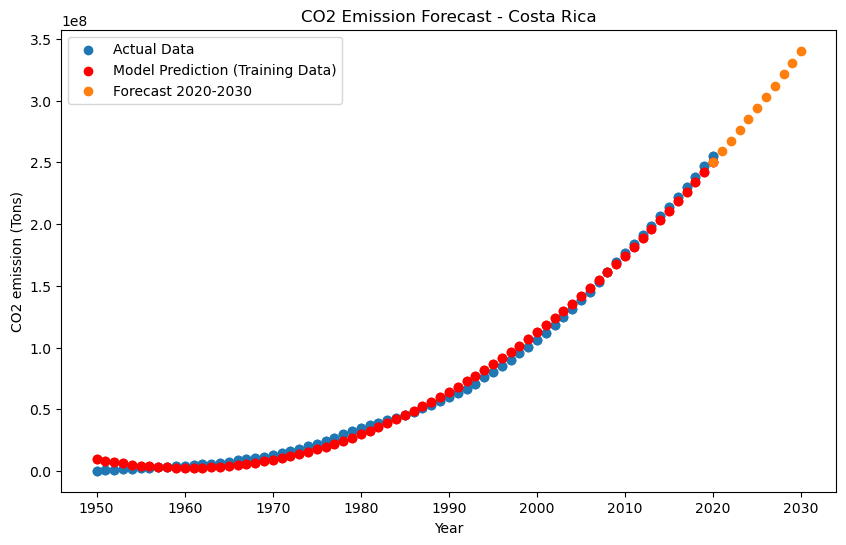

Cote d'Ivoire Metrics:
Cote d'Ivoire Predictions (2020-2030):
2020: 329690789.73760986
2021: 339176344.35980225
2022: 348790115.649292
2023: 358532103.6060486
2024: 368402308.230011
2025: 378400729.52127075
2026: 388527367.47976685
2027: 398782222.1055603
2028: 409165293.3986206
2029: 419676581.3588562
2030: 430316085.9864502


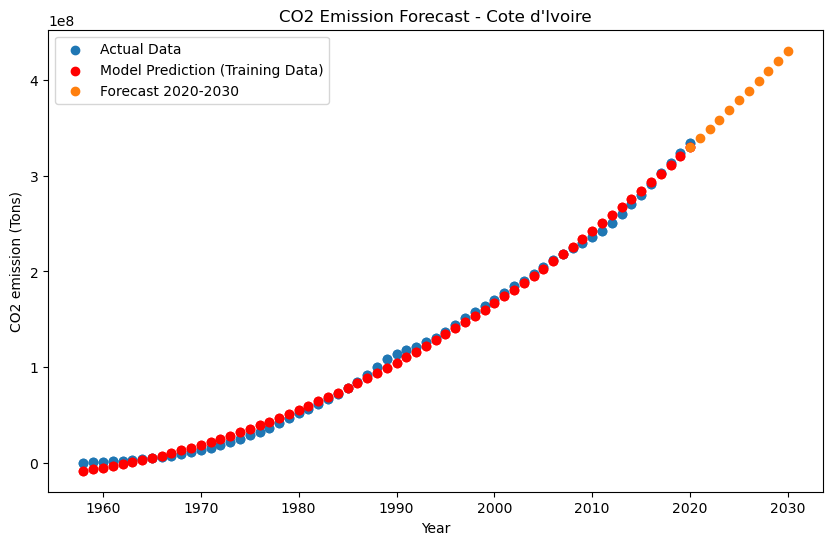

Croatia Metrics:
Croatia Predictions (2020-2030):
2020: 1066157733.2016602
2021: 1088740102.2484741
2022: 1111549187.3338013
2023: 1134584988.4576416
2024: 1157847505.6200562
2025: 1181336738.8209229
2026: 1205052688.0602417
2027: 1228995353.3380737
2028: 1253164734.654419
2029: 1277560832.0092773
2030: 1302183645.402649


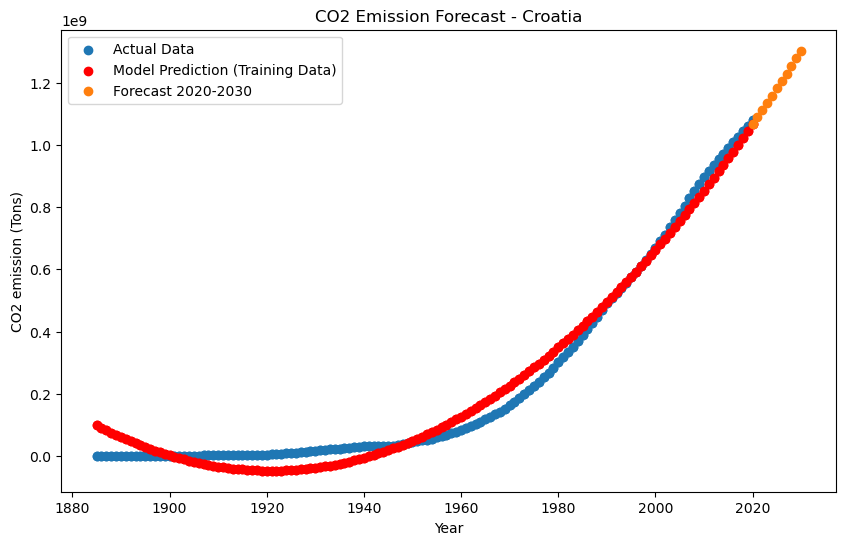

Cuba Metrics:
Cuba Predictions (2020-2030):
2020: 1702065969.999878
2021: 1738489953.7235107
2022: 1775257088.3586426
2023: 1812367373.9055176
2024: 1849820810.3637695
2025: 1887617397.7338867
2026: 1925757136.015747
2027: 1964240025.2091064
2028: 2003066065.3139648
2029: 2042235256.3306885
2030: 2081747598.2590332


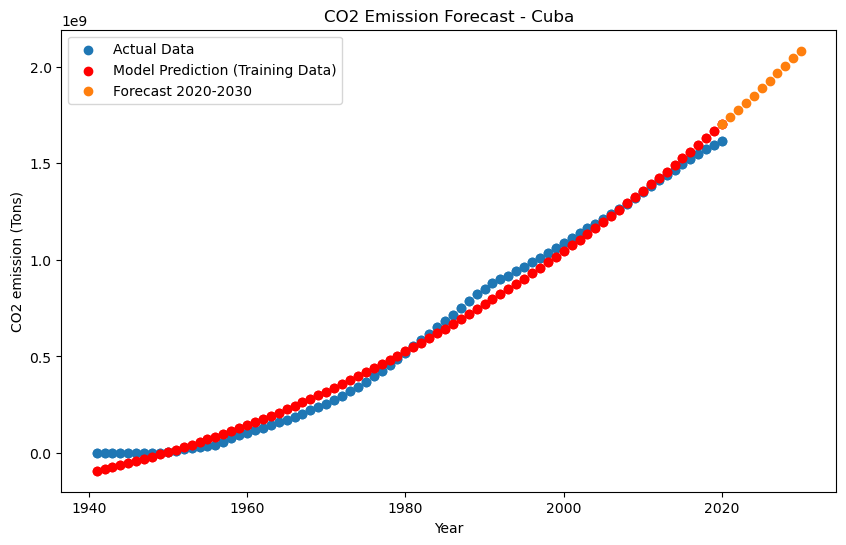

Curacao Metrics:
Curacao Predictions (2020-2030):
2020: 587717476.5044785
2021: 594130105.8080368
2022: 600531627.2289276
2023: 606922040.7671432
2024: 613301346.4226837
2025: 619669544.195549
2026: 626026634.0857315
2027: 632372616.0932465
2028: 638707490.2180862
2029: 645031256.4602585
2030: 651343914.8197479


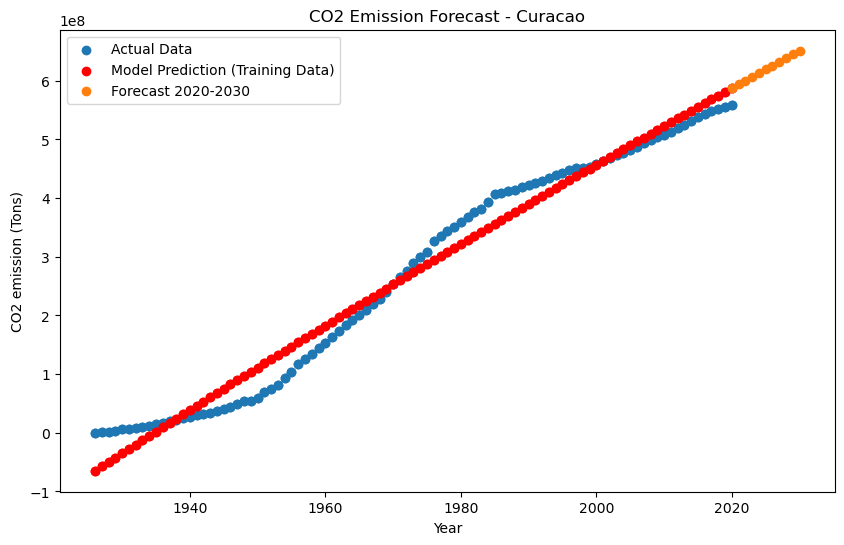

Cyprus Metrics:
Cyprus Predictions (2020-2030):
2020: 301479805.6452637
2021: 310984582.3376465
2022: 320638265.5369873
2023: 330440855.2432251
2024: 340392351.4562988
2025: 350492754.17626953
2026: 360742063.40319824
2027: 371140279.1369629
2028: 381687401.3776245
2029: 392383430.1251221
2030: 403228365.37957764


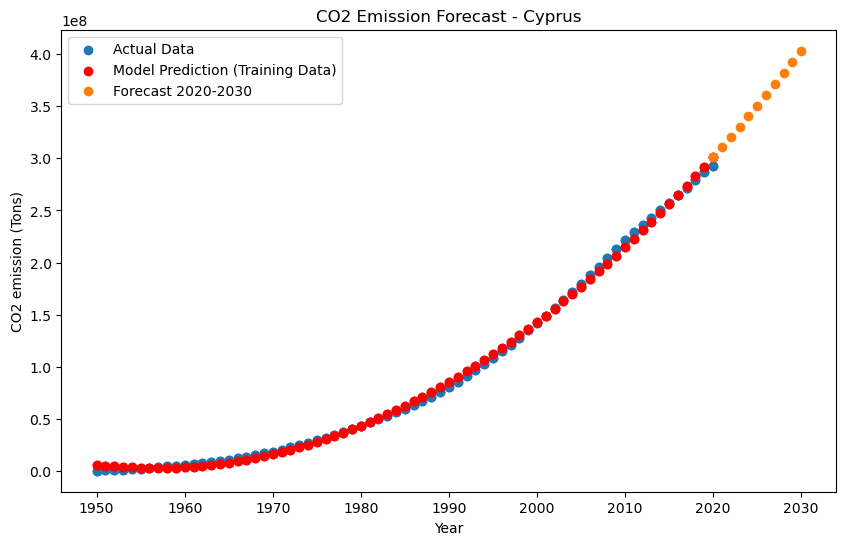

Czechia Metrics:
Czechia Predictions (2020-2030):
2020: 12527439700.436523
2021: 12706192510.333984
2022: 12886224894.992676
2023: 13067536854.412598
2024: 13250128388.59375
2025: 13433999497.536133
2026: 13619150181.239746
2027: 13805580439.70459
2028: 13993290272.930176
2029: 14182279680.91748
2030: 14372548663.666016


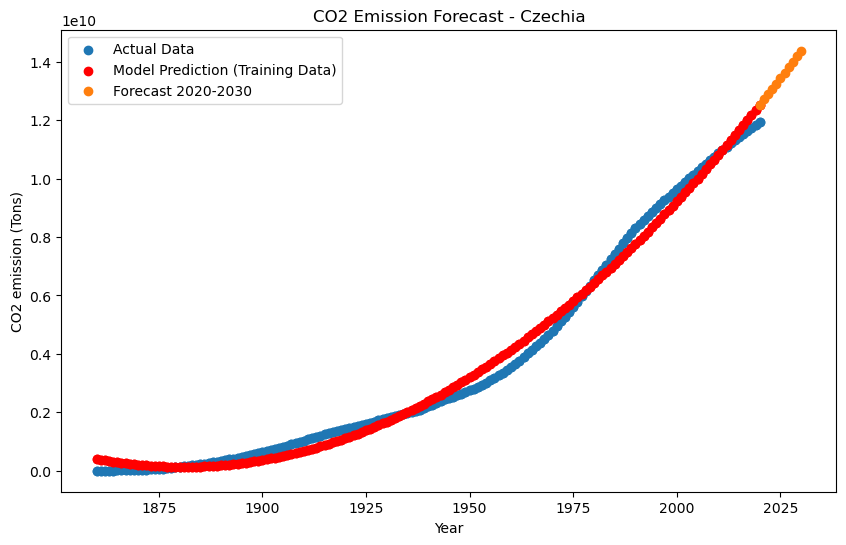

Democratic Republic of Congo Metrics:
Democratic Republic of Congo Predictions (2020-2030):
2020: 208801461.3859024
2021: 212478014.43852997
2022: 216183352.49106598
2023: 219917475.54354095
2024: 223680383.59592438
2025: 227472076.64824677
2026: 231292554.70046997
2027: 235141817.75263977
2028: 239019865.8047104
2029: 242926698.8567276
2030: 246862316.90864563


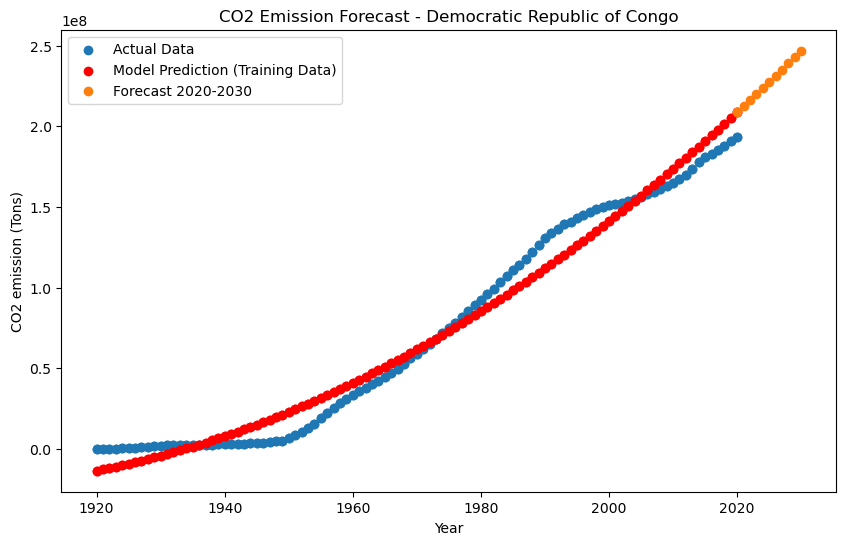

Denmark Metrics:
Denmark Predictions (2020-2030):
2020: 4204797424.5386963
2021: 4269093959.378418
2022: 4333865818.342163
2023: 4399113001.430176
2024: 4464835508.642212
2025: 4531033339.978516
2026: 4597706495.438965
2027: 4664854975.0234375
2028: 4732478778.732178
2029: 4800577906.564941
2030: 4869152358.521973


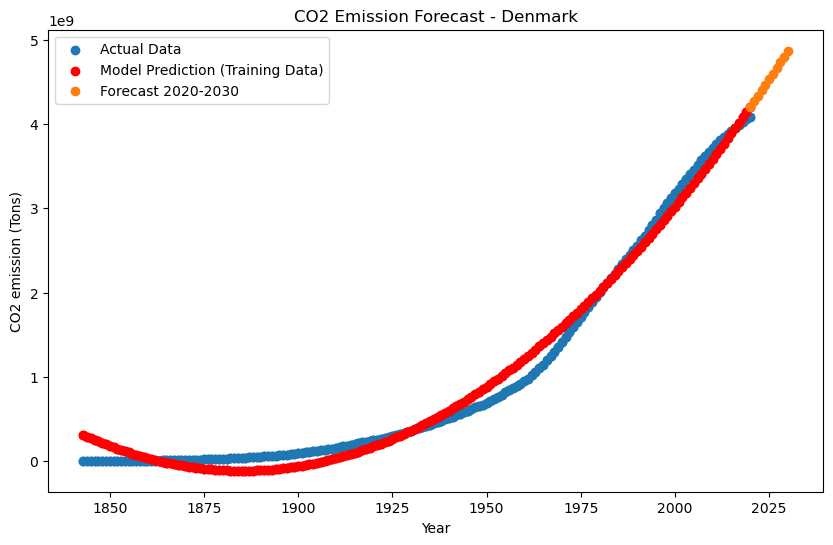

Djibouti Metrics:
Djibouti Predictions (2020-2030):
2020: 19568901.728925705
2021: 20118059.31171608
2022: 20674705.73366928
2023: 21238840.99477768
2024: 21810465.095046997
2025: 22389578.034475327
2026: 22976179.813062668
2027: 23570270.43081093
2028: 24171849.887722015
2029: 24780918.1837883
2030: 25397475.319015503


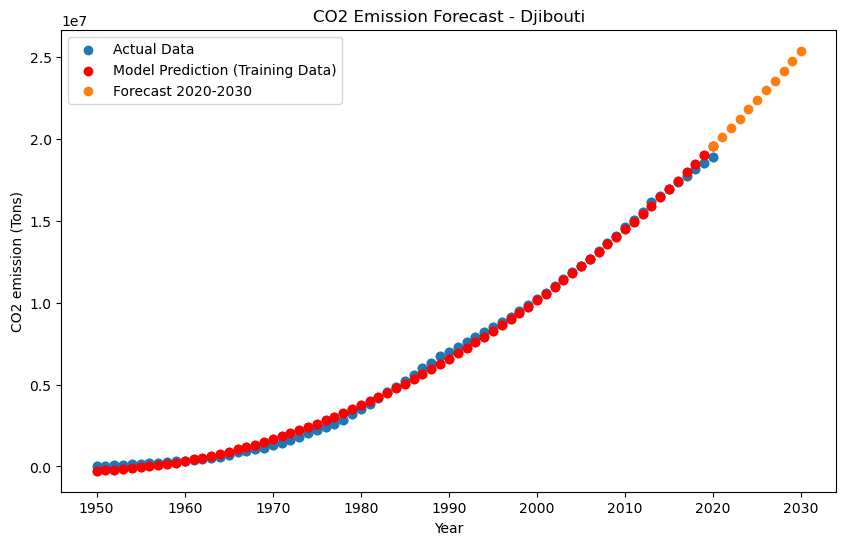

Dominica Metrics:
Dominica Predictions (2020-2030):
2020: 4653226.084935188
2021: 4819176.832036972
2022: 4988050.103889465
2023: 5159845.90049839
2024: 5334564.221860886
2025: 5512205.067976952
2026: 5692768.438846588
2027: 5876254.334470749
2028: 6062662.75484848
2029: 6251993.699979782
2030: 6444247.169864655


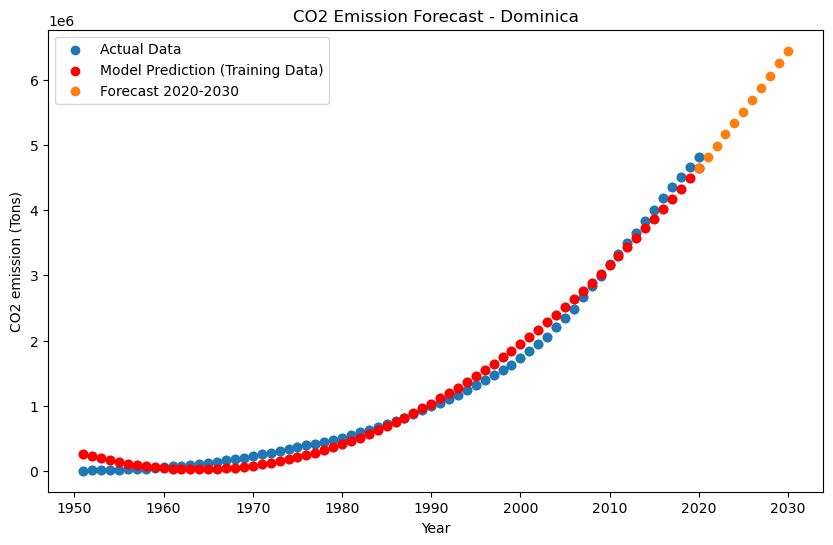

Dominican Republic Metrics:
Dominican Republic Predictions (2020-2030):
2020: 730530886.4799805
2021: 755208659.2341309
2022: 780294336.9998779
2023: 805787919.7772217
2024: 831689407.56604
2025: 857998800.3665771
2026: 884716098.178833
2027: 911841301.0026855
2028: 939374408.8378906
2029: 967315421.6849365
2030: 995664339.5435791


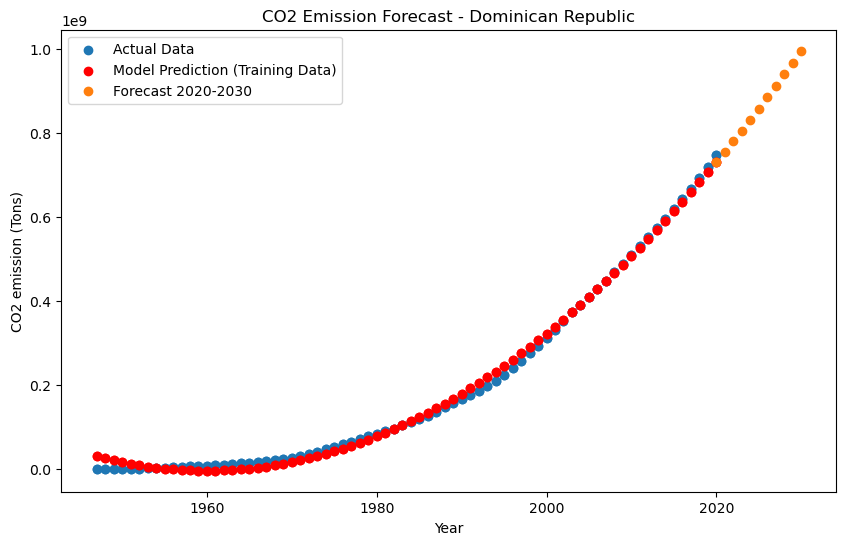

Ecuador Metrics:
Ecuador Predictions (2020-2030):
2020: 1095977202.2009277
2021: 1126782041.2735596
2022: 1157995672.75708
2023: 1189618096.6518555
2024: 1221649312.9578857
2025: 1254089321.6750488
2026: 1286938122.8029785
2027: 1320195716.3424072
2028: 1353862102.2929688
2029: 1387937280.654663
2030: 1422421251.427246


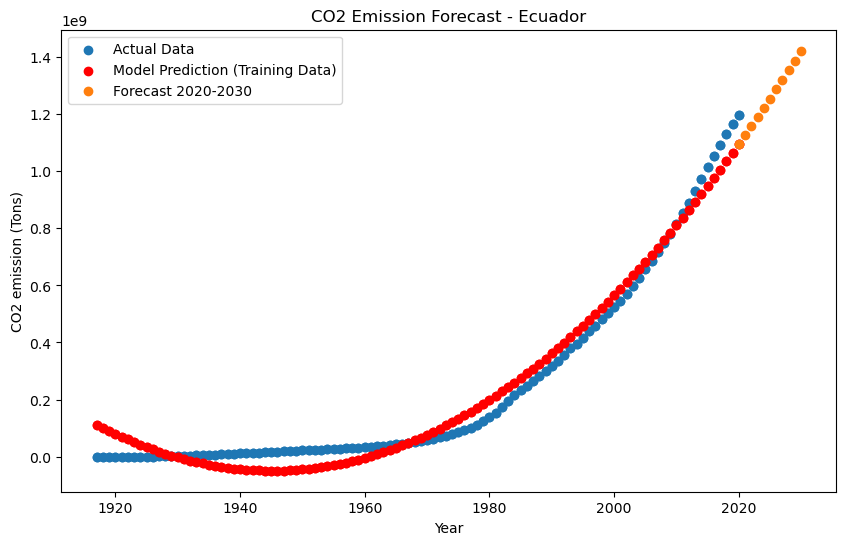

Egypt Metrics:
Egypt Predictions (2020-2030):
2020: 5376622704.955566
2021: 5524209217.108398
2022: 5673688308.413086
2023: 5825059978.8671875
2024: 5978324228.47168
2025: 6133481057.225586
2026: 6290530465.130371
2027: 6449472452.185059
2028: 6610307018.390137
2029: 6773034163.744141
2030: 6937653888.249512


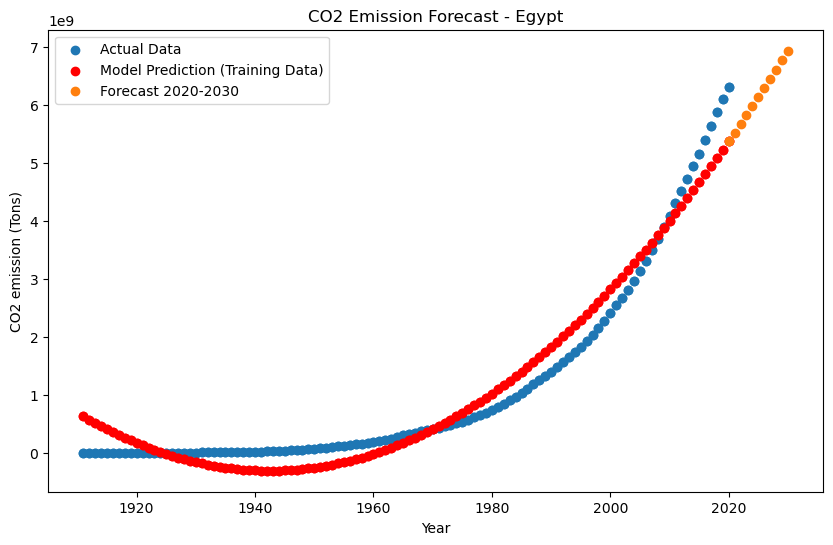

El Salvador Metrics:
El Salvador Predictions (2020-2030):
2020: 232610595.7406006
2021: 240085076.65945435
2022: 247679730.93807983
2023: 255394558.57635498
2024: 263229559.5742798
2025: 271184733.93185425
2026: 279260081.6491394
2027: 287455602.72610474
2028: 295771297.16275024
2029: 304207164.9590149
2030: 312763206.11499023


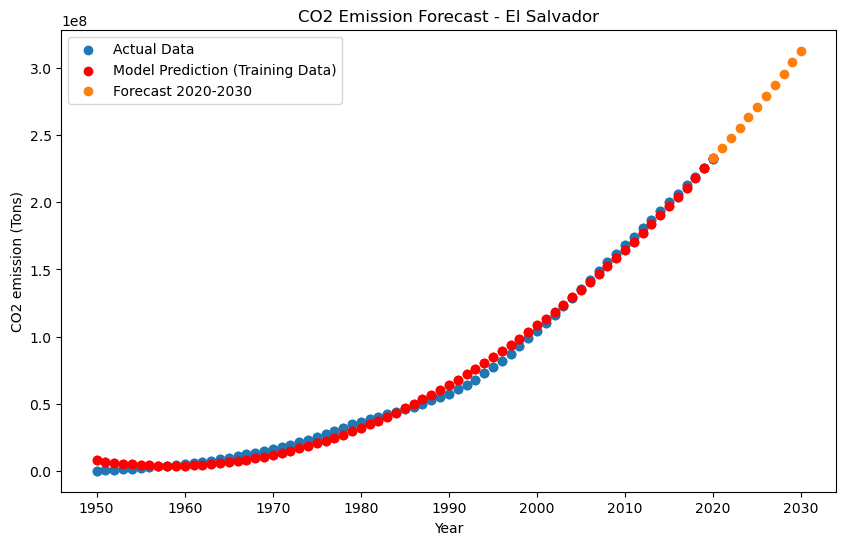

Equatorial Guinea Metrics:
Equatorial Guinea Predictions (2020-2030):
2020: 143148414.01519775
2021: 150078004.0053711
2022: 157155694.56970215
2023: 164381485.70812988
2024: 171755377.4204712
2025: 179277369.70703125
2026: 186947462.567688
2027: 194765656.0022583
2028: 202731950.01104736
2029: 210846344.59387207
2030: 219108839.75073242


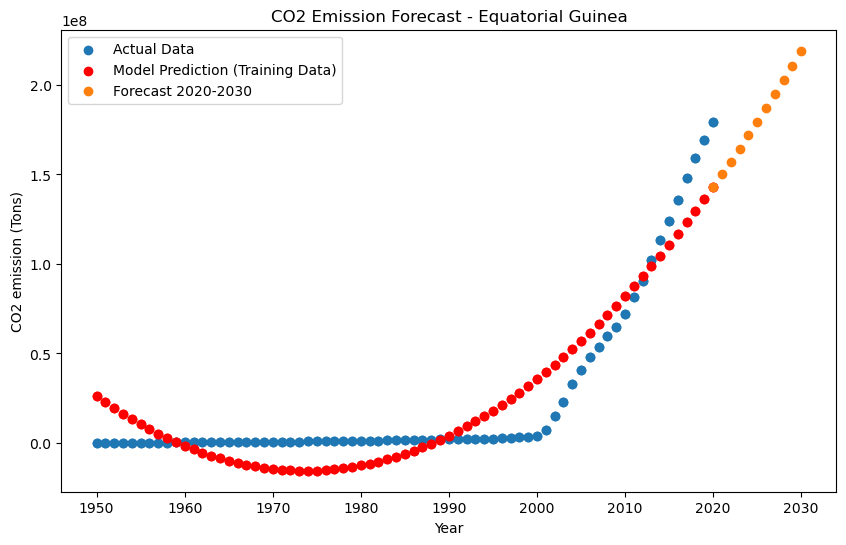

Eritrea Metrics:
Eritrea Predictions (2020-2030):
2020: 16541864.967571259
2021: 17197546.89681244
2022: 17864979.20335388
2023: 18544161.887187958
2024: 19235094.948329926
2025: 19937778.38676834
2026: 20652212.20249939
2027: 21378396.395542145
2028: 22116330.965869904
2029: 22866015.91350937
2030: 23627451.238449097


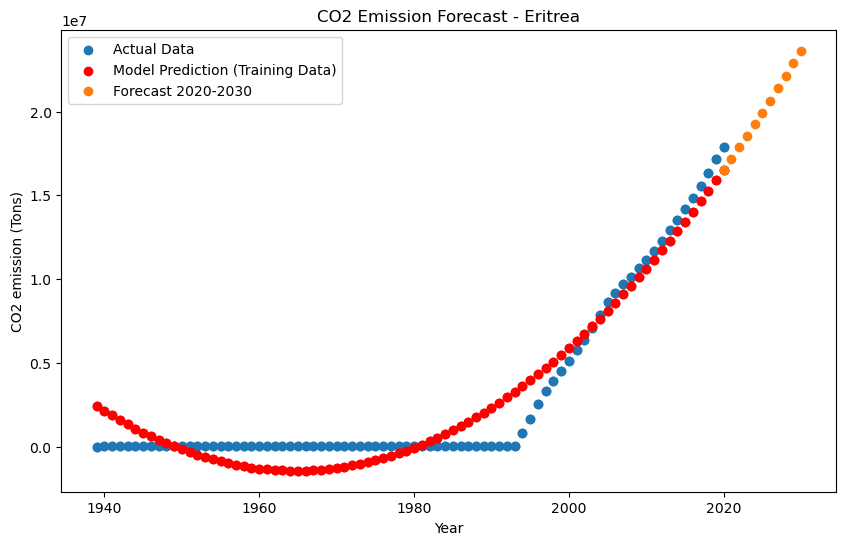

Estonia Metrics:
Estonia Predictions (2020-2030):
2020: 1661738033.144287
2021: 1688679792.9944458
2022: 1715823734.9337769
2023: 1743169858.9625244
2024: 1770718165.0803833
2025: 1798468653.2877197
2026: 1826421323.5842285
2027: 1854576175.9701538
2028: 1882933210.4451904
2029: 1911492427.0097046
2030: 1940253825.66333


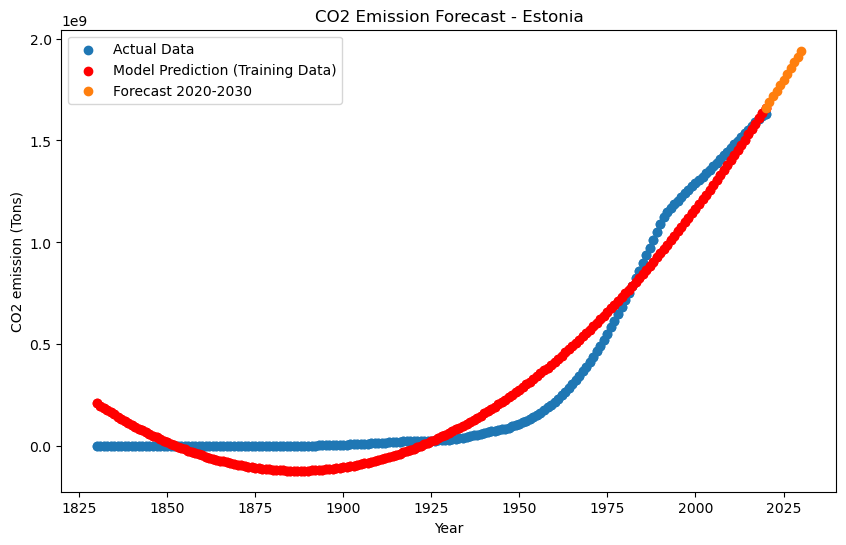

Eswatini Metrics:
Eswatini Predictions (2020-2030):
2020: 42366350.34803772
2021: 43748971.70409393
2022: 45153675.064964294
2023: 46580460.43065643
2024: 48029327.80115509
2025: 49500277.176475525
2026: 50993308.55660248
2027: 52508421.94153595
2028: 54045617.33129883
2029: 55604894.725868225
2030: 57186254.1252594


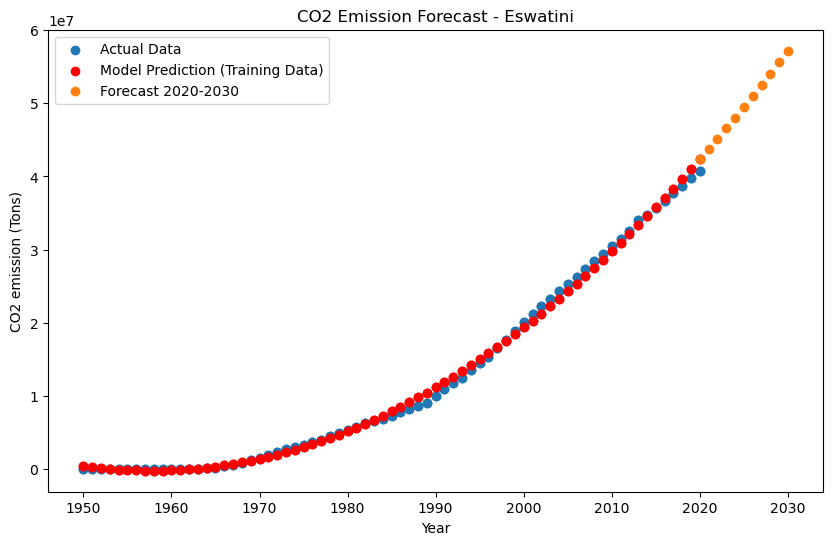

Ethiopia Metrics:
Ethiopia Predictions (2020-2030):
2020: 211286964.90927124
2021: 218446792.65472412
2022: 225723822.86212158
2023: 233118055.53152466
2024: 240629490.6628418
2025: 248258128.25610352
2026: 256003968.3113098
2027: 263867010.8284912
2028: 271847255.8076782
2029: 279944703.2487488
2030: 288159353.15179443


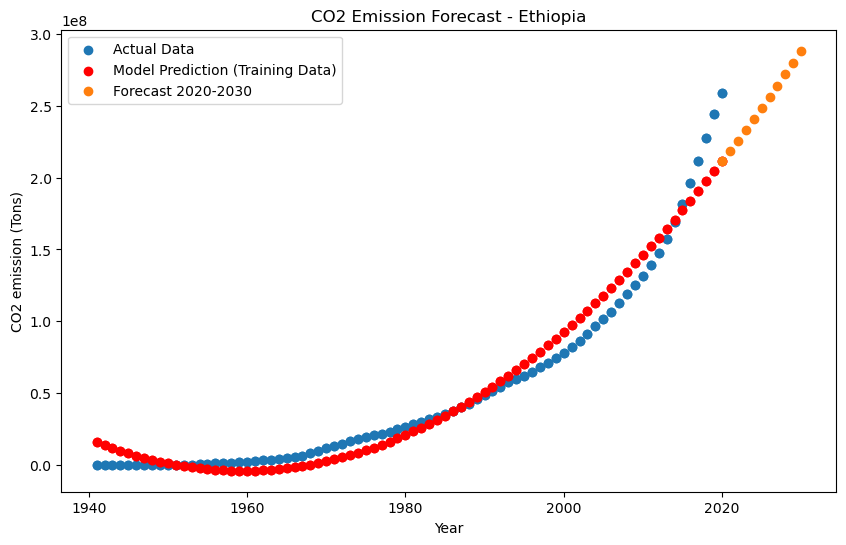

Faeroe Islands Metrics:
Faeroe Islands Predictions (2020-2030):
2020: 31875165.950962067
2021: 32757216.04019928
2022: 33651152.477306366
2023: 34556975.262290955
2024: 35474684.395145416
2025: 36404279.875881195
2026: 37345761.70448685
2027: 38299129.88097
2028: 39264384.40532303
2029: 40241525.27755737
2030: 41230552.497657776


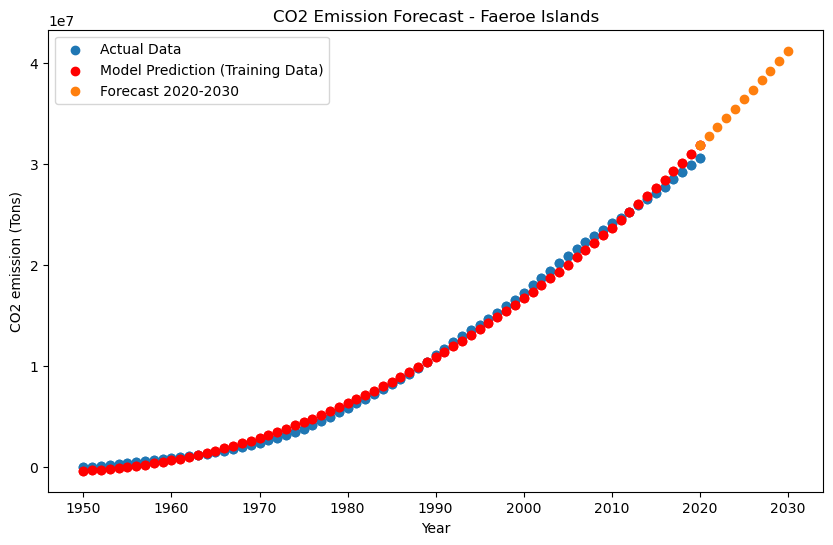

Fiji Metrics:
Fiji Predictions (2020-2030):
2020: 48794376.500183105
2021: 50048922.56361008
2022: 51319039.953022
2023: 52604728.66843033
2024: 53905988.70982742
2025: 55222820.07721329
2026: 56555222.770591736
2027: 57903196.789958954
2028: 59266742.135318756
2029: 60645858.80667114
2030: 62040546.8040123


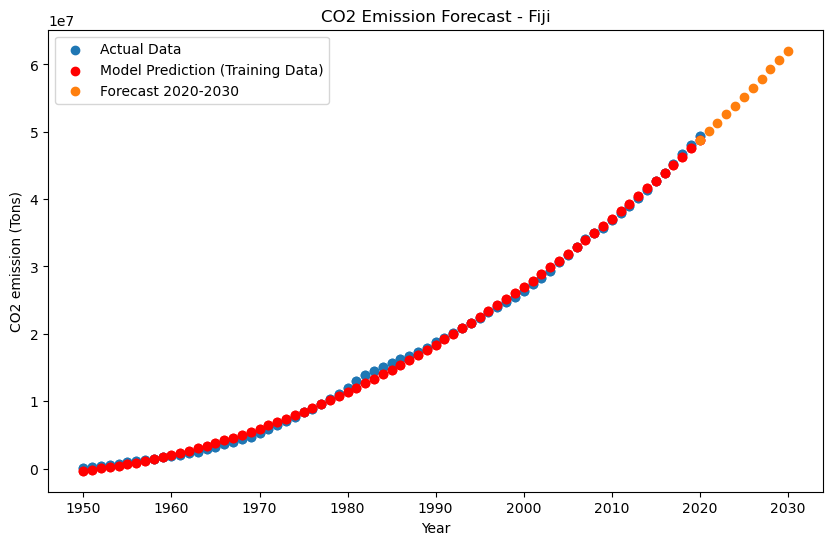

Finland Metrics:
Finland Predictions (2020-2030):
2020: 3070952910.522339
2021: 3129757069.0845947
2022: 3189083373.7698975
2023: 3248931824.5787354
2024: 3309302421.5108643
2025: 3370195164.56604
2026: 3431610053.744873
2027: 3493547089.046631
2028: 3556006270.472046
2029: 3618987598.0203857
2030: 3682491071.692383


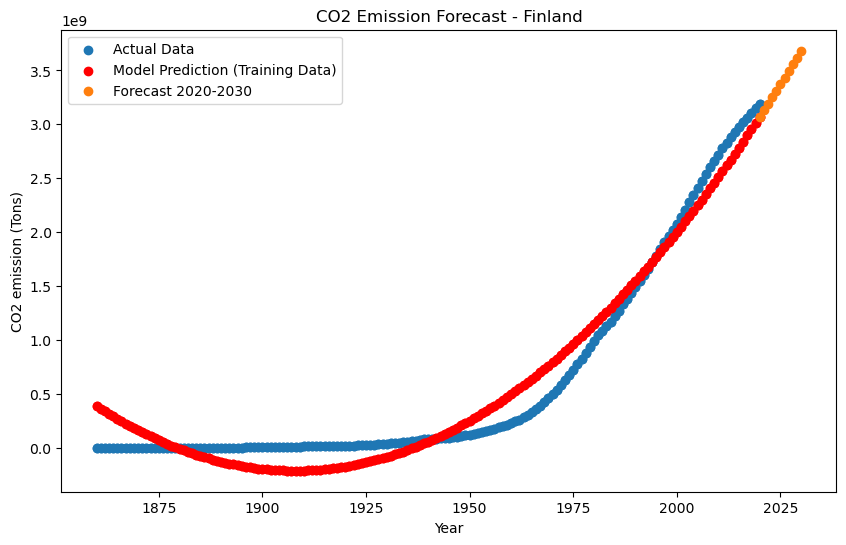

France Metrics:
France Predictions (2020-2030):
2020: 38965909030.711914
2021: 39420988388.833984
2022: 39878677177.478516
2023: 40338975396.64258
2024: 40801883046.33008
2025: 41267400126.53613
2026: 41735526637.265625
2027: 42206262578.51465
2028: 42679607950.28613
2029: 43155562752.57715
2030: 43634126985.390625


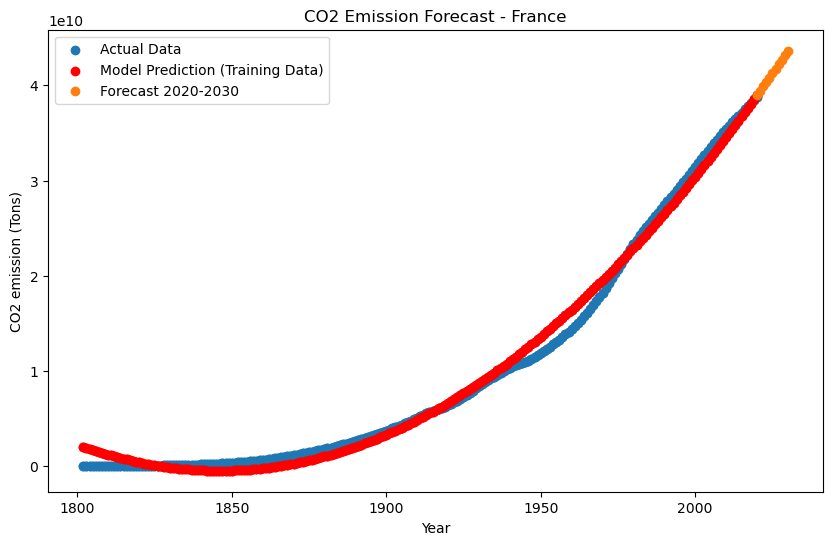

French Guiana Metrics:
French Guiana Predictions (2020-2030):
2020: 28686159.820087433
2021: 29606991.91721344
2022: 30542222.1485672
2023: 31491850.514133453
2024: 32455877.01393509
2025: 33434301.647960663
2026: 34427124.416210175
2027: 35434345.31867981
2028: 36455964.3553772
2029: 37491981.52630234
2030: 38542396.83143997


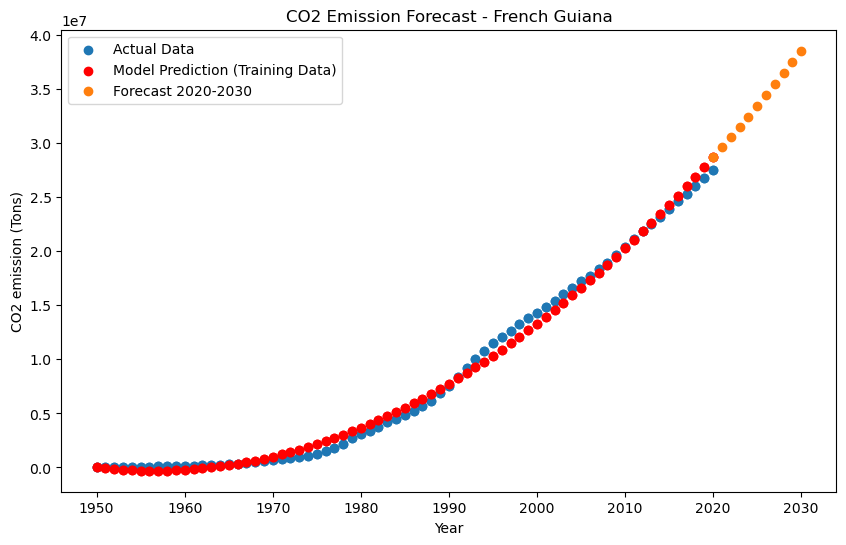

French Polynesia Metrics:
French Polynesia Predictions (2020-2030):
2020: 29051373.56578827
2021: 29965353.3075943
2022: 30893507.158439636
2023: 31835835.11833191
2024: 32792337.18727112
2025: 33763013.36525345
2026: 34747863.6522789
2027: 35746888.04835129
2028: 36760086.55347061
2029: 37787459.167640686
2030: 38829005.89085007


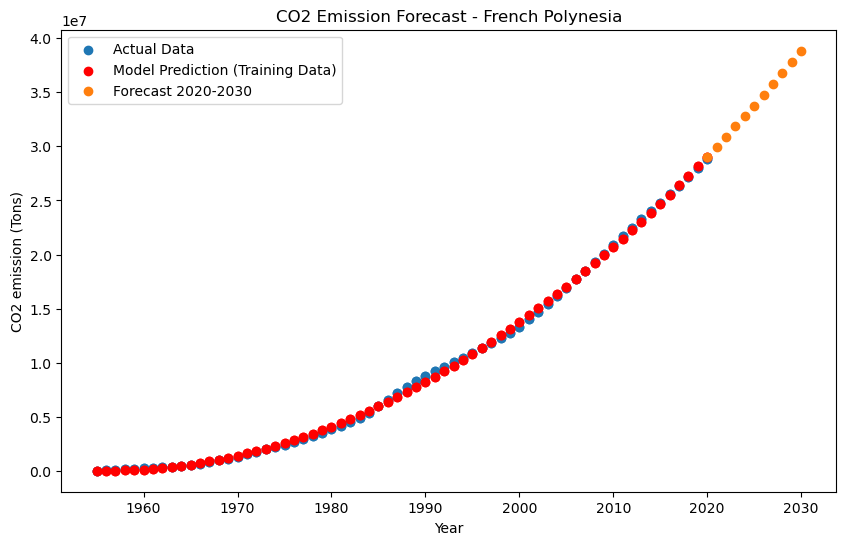

Gabon Metrics:
Gabon Predictions (2020-2030):
2020: 264558335.12584686
2021: 270097348.30031586
2022: 275663194.7511673
2023: 281255874.4783859
2024: 286875387.481987
2025: 292521733.76194
2026: 298194913.3182831
2027: 303894926.1510086
2028: 309621772.2601013
2029: 315375451.6455765
2030: 321155964.30740356


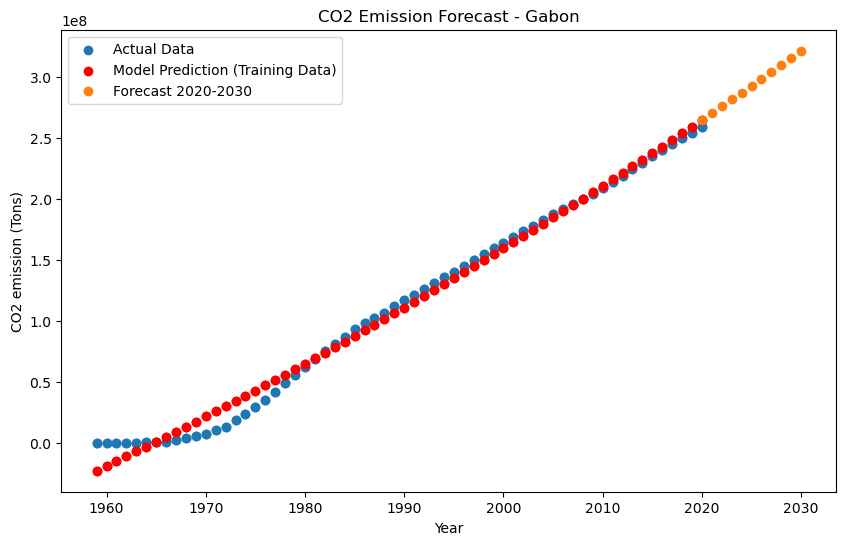

Gambia Metrics:
Gambia Predictions (2020-2030):
2020: 13315041.090250015
2021: 13771175.795379639
2022: 14235019.500928879
2023: 14706572.206895828
2024: 15185833.91327858
2025: 15672804.62007904
2026: 16167484.327293396
2027: 16669873.034929276
2028: 17179970.742975235
2029: 17697777.451444626
2030: 18223293.160326004


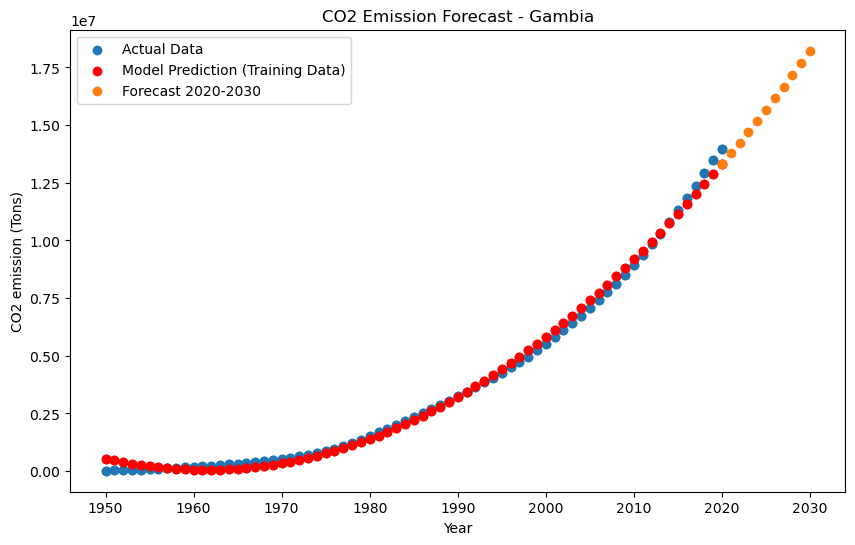

Georgia Metrics:
Georgia Predictions (2020-2030):
2020: 660100137.9640198
2021: 670757099.9570923
2022: 681493805.88031
2023: 692310255.7338562
2024: 703206449.5176392
2025: 714182387.2315674
2026: 725238068.875824
2027: 736373494.4503174
2028: 747588663.9550476
2029: 758883577.3899231
2030: 770258234.755127


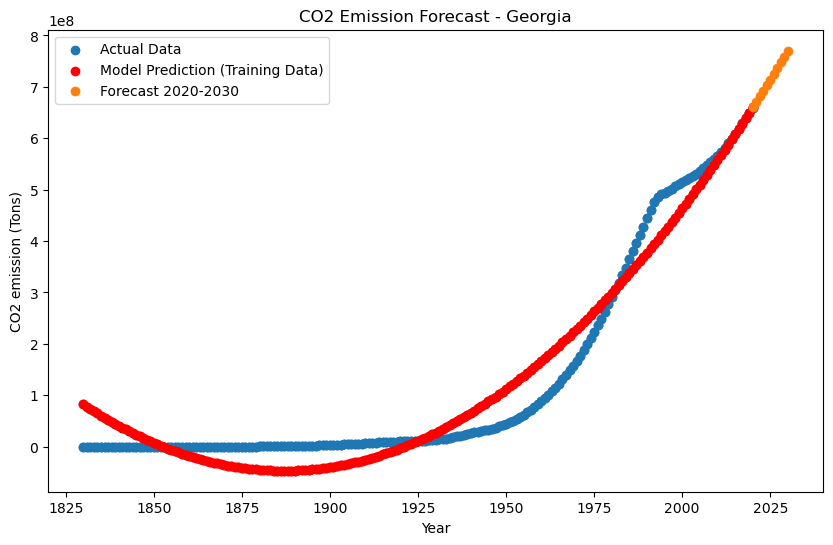

Germany Metrics:
Germany Predictions (2020-2030):
2020: 94459755425.09766
2021: 95564666018.7207
2022: 96675829069.46289
2023: 97793244577.32422
2024: 98916912542.30469
2025: 100046832964.40625
2026: 101183005843.625
2027: 102325431179.96094
2028: 103474108973.41602
2029: 104629039223.9961
2030: 105790221931.68945


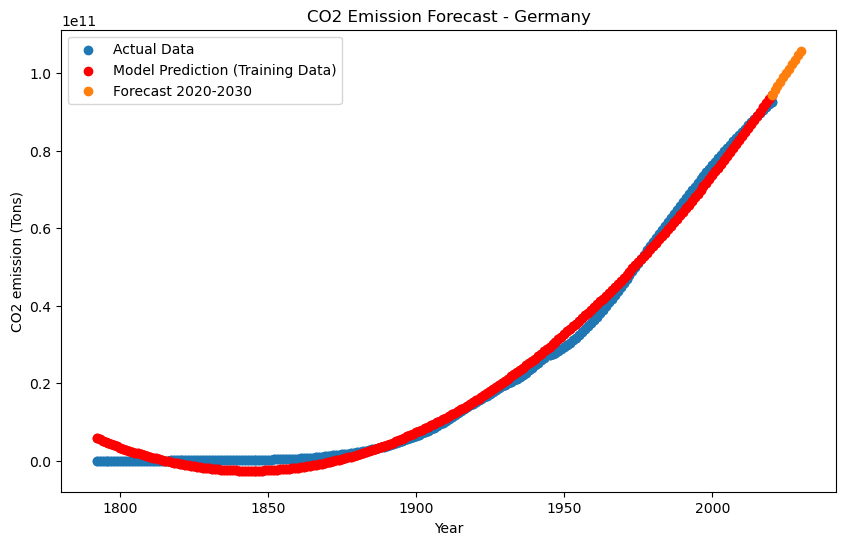

Ghana Metrics:
Ghana Predictions (2020-2030):
2020: 335248486.08026123
2021: 346222296.9397583
2022: 357378311.41571045
2023: 368716529.5084839
2024: 380236951.2178955
2025: 391939576.5439453
2026: 403824405.48657227
2027: 415891438.04589844
2028: 428140674.22180176
2029: 440572114.0144043
2030: 453185757.423584


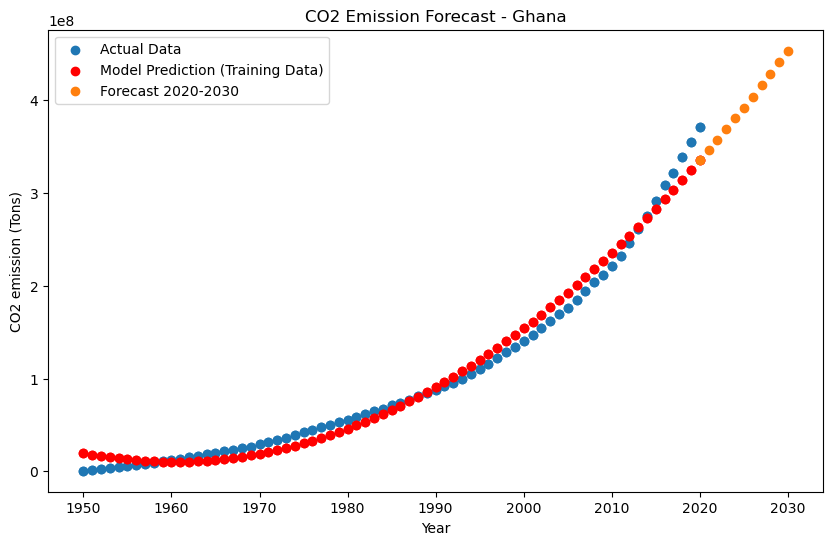

Greece Metrics:
Greece Predictions (2020-2030):
2020: 3625077934.505615
2021: 3701688175.9211426
2022: 3779034382.050537
2023: 3857116552.8935547
2024: 3935934688.4501953
2025: 4015488788.720459
2026: 4095778853.7038574
2027: 4176804883.401367
2028: 4258566877.812744
2029: 4341064836.9375
2030: 4424298760.776123


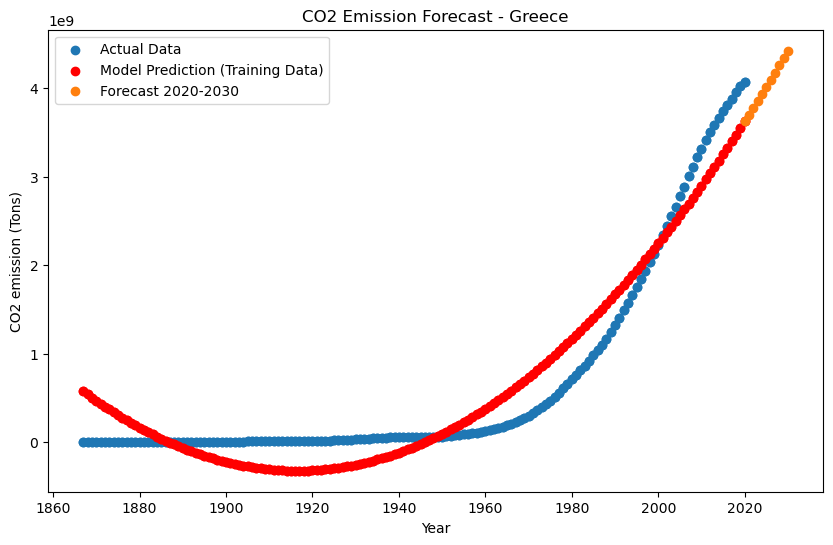

Greenland Metrics:
Greenland Predictions (2020-2030):
2020: 33993546.63884926
2021: 34715505.36942673
2022: 35443724.92525673
2023: 36178205.306344986
2024: 36918946.51268387
2025: 37665948.54427719
2026: 38419211.40112686
2027: 39178735.08322716
2028: 39944519.59057999
2029: 40716564.923187256
2030: 41494871.08105087


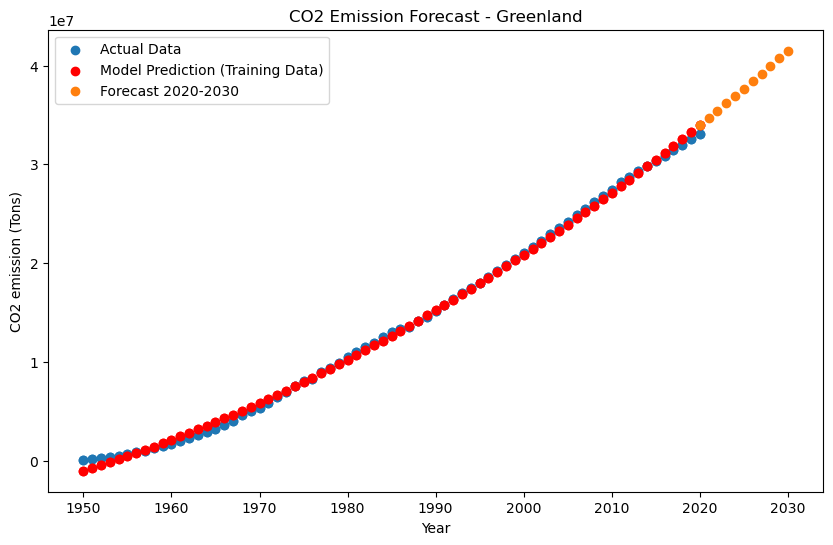

Grenada Metrics:
Grenada Predictions (2020-2030):
2020: 7965118.728199005
2021: 8243577.262653351
2022: 8526850.616096497
2023: 8814938.788524628
2024: 9107841.77994728
2025: 9405559.590351105
2026: 9708092.219743729
2027: 10015439.668123245
2028: 10327601.93549347
2029: 10644579.021848679
2030: 10966370.927192688


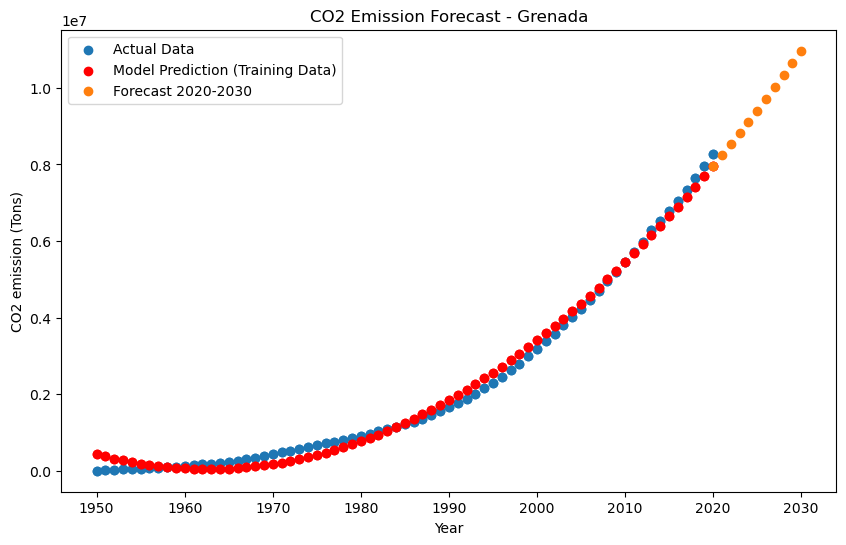

Guadeloupe Metrics:
Guadeloupe Predictions (2020-2030):
2020: 84425978.44007874
2021: 87393470.42445374
2022: 90412149.00408936
2023: 93482014.1789856
2024: 96603065.94909668
2025: 99775304.3144989
2026: 102998729.27516174
2027: 106273340.83106995
2028: 109599138.98222351
2029: 112976123.72865295
2030: 116404295.0703125


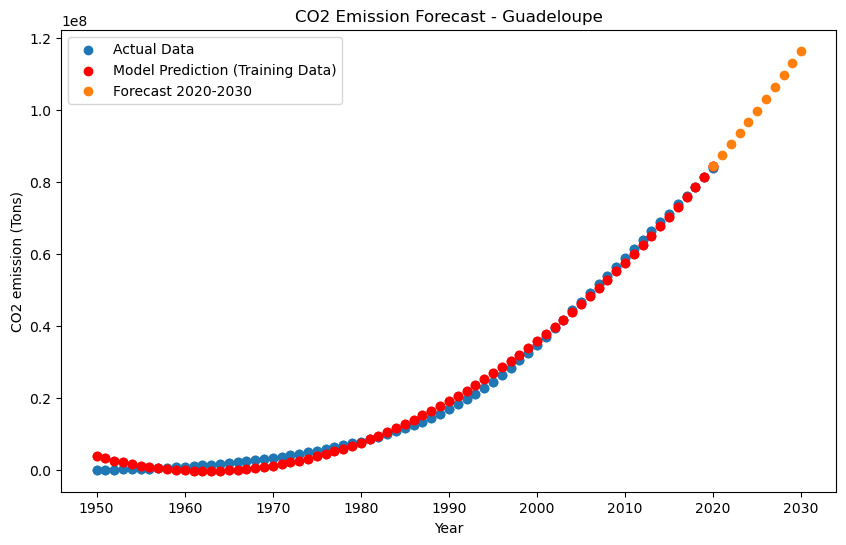

Guatemala Metrics:
Guatemala Predictions (2020-2030):
2020: 407105420.88916016
2021: 420014568.0949707
2022: 433124458.2675781
2023: 446435091.40686035
2024: 459946467.51293945
2025: 473658586.5856323
2026: 487571448.625
2027: 501685053.6312866
2028: 515999401.604126
2029: 530514492.5437622
2030: 545230326.4500732


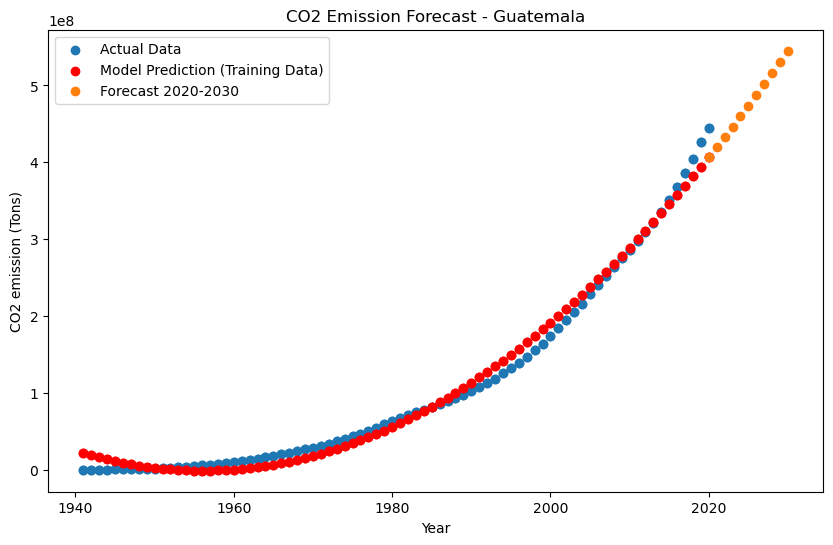

Guinea Metrics:
Guinea Predictions (2020-2030):
2020: 80846065.11457062
2021: 83215845.8254013
2022: 85620654.55677795
2023: 88060491.30865479
2024: 90535356.0810852
2025: 93045248.87400818
2026: 95590169.68748474
2027: 98170118.52144623
2028: 100785095.37596893
2029: 103435100.25098419
2030: 106120133.14654541


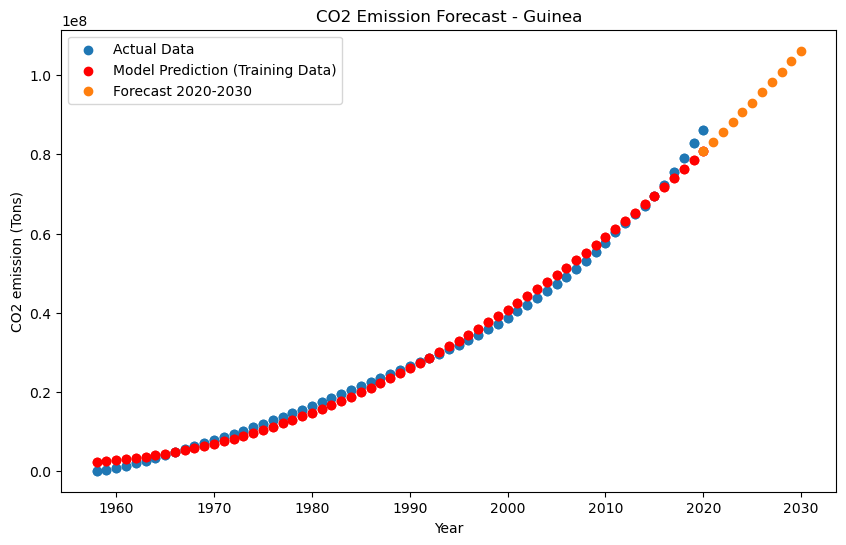

Guinea-Bissau Metrics:
Guinea-Bissau Predictions (2020-2030):
2020: 10061448.89859581
2021: 10351610.923261642
2022: 10645860.02219677
2023: 10944196.195403099
2024: 11246619.44288063
2025: 11553129.76462841
2026: 11863727.160647392
2027: 12178411.630936623
2028: 12497183.175494194
2029: 12820041.794323921
2030: 13146987.487423897


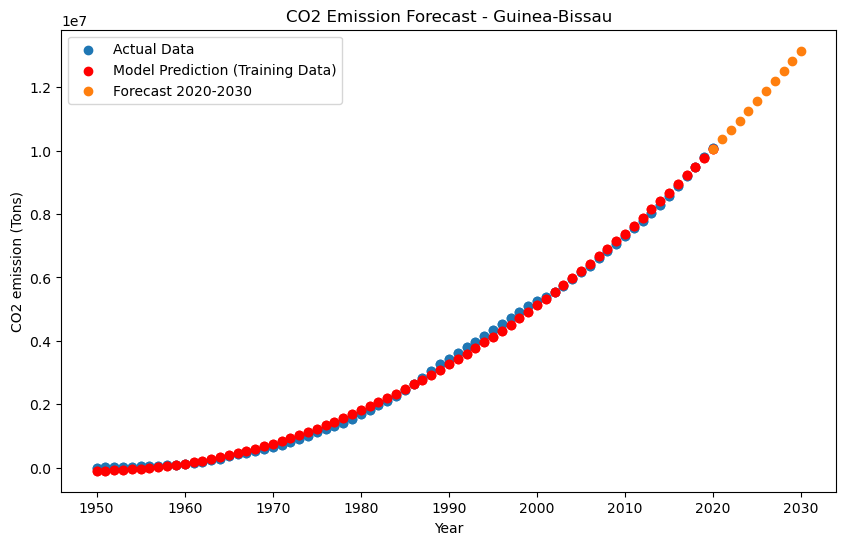

Guyana Metrics:
Guyana Predictions (2020-2030):
2020: 99458454.98702621
2021: 101533504.61670303
2022: 103625747.6641655
2023: 105735184.12940598
2024: 107861814.01243591
2025: 110005637.31325531
2026: 112166654.0318451
2027: 114344864.16823196
2028: 116540267.72240067
2029: 118752864.69434738
2030: 120982655.08408356


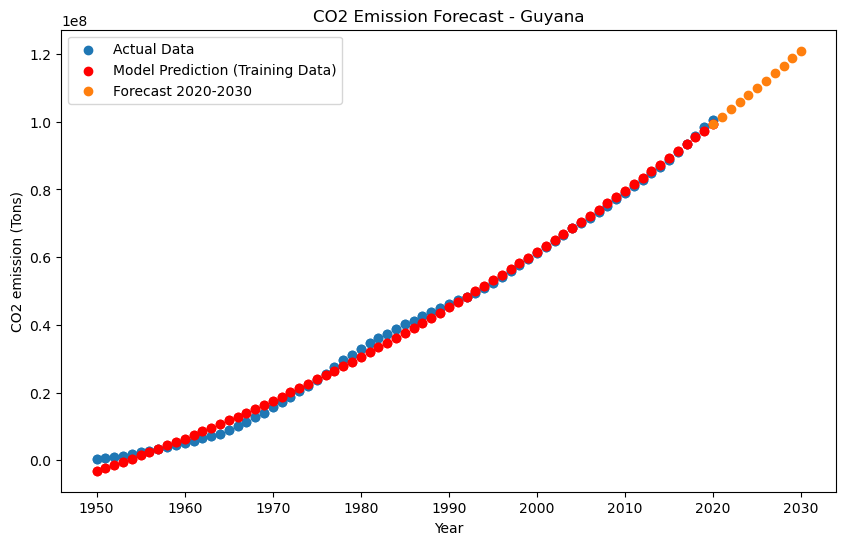

Haiti Metrics:
Haiti Predictions (2020-2030):
2020: 70536958.57637024
2021: 72809227.87945557
2022: 75118434.56033325
2023: 77464578.61901855
2024: 79847660.0554657
2025: 82267678.86972046
2026: 84724635.06175232
2027: 87218528.63156128
2028: 89749359.57919312
2029: 92317127.90457153
2030: 94921833.60774231


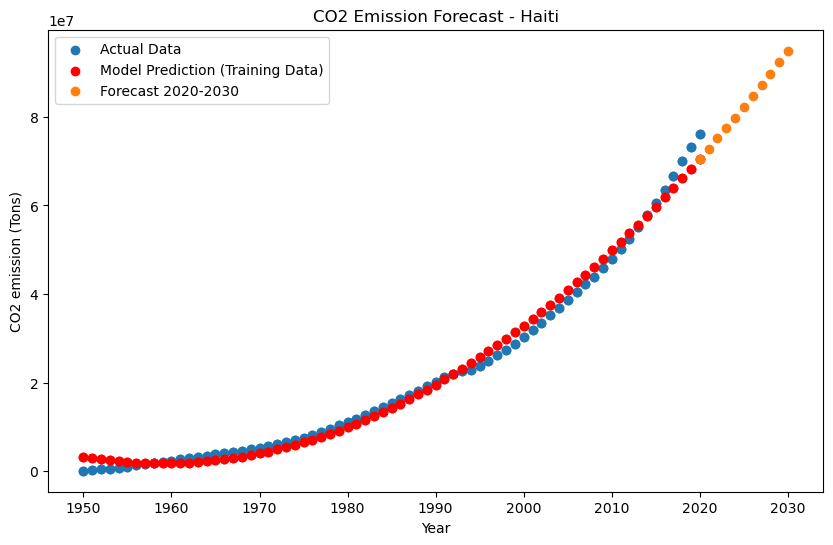

Honduras Metrics:
Honduras Predictions (2020-2030):
2020: 239990832.5914917
2021: 248415507.38775635
2022: 256987059.83581543
2023: 265705489.93585205
2024: 274570797.6878052
2025: 283582983.0914917
2026: 292742046.1472168
2027: 302047986.85479736
2028: 311500805.21417236
2029: 321100501.2255249
2030: 330847074.88879395


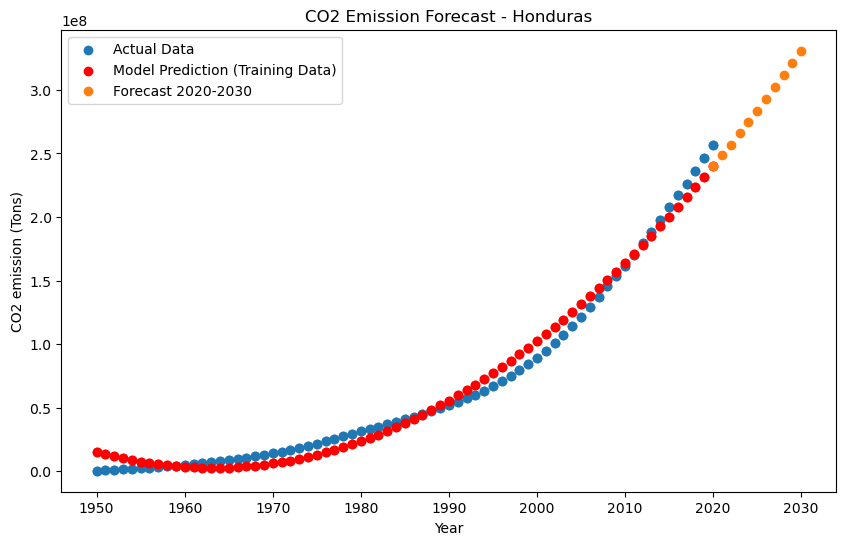

Hong Kong Metrics:
Hong Kong Predictions (2020-2030):
2020: 1650032834.7214355
2021: 1701406889.8000488
2022: 1753555520.277832
2023: 1806478726.1560059
2024: 1860176507.4331055
2025: 1914648864.1105957
2026: 1969895796.1872559
2027: 2025917303.6643066
2028: 2082713386.5405273
2029: 2140284044.8166504
2030: 2198629278.4924316


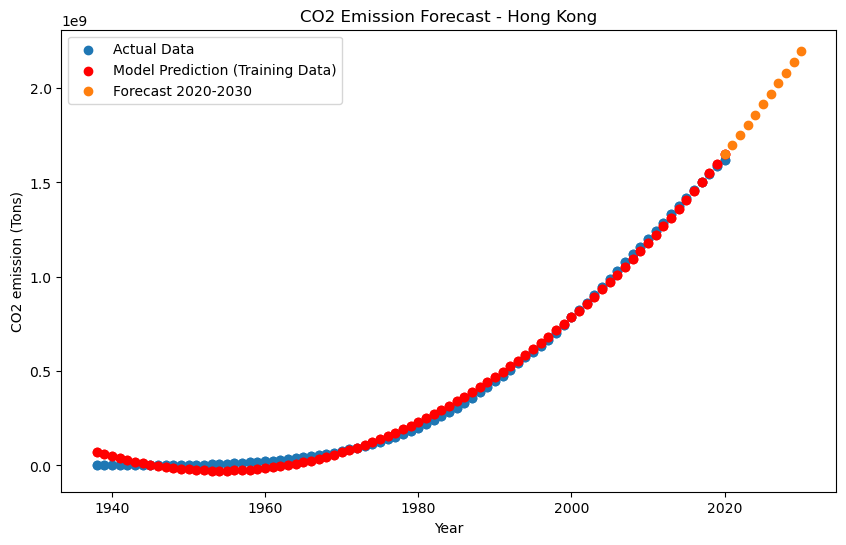

Hungary Metrics:
Hungary Predictions (2020-2030):
2020: 5091554278.825928
2021: 5166375928.915161
2022: 5241724973.621582
2023: 5317601412.945068
2024: 5394005246.885986
2025: 5470936475.444092
2026: 5548395098.619263
2027: 5626381116.411499
2028: 5704894528.821289
2029: 5783935335.848145
2030: 5863503537.4921875


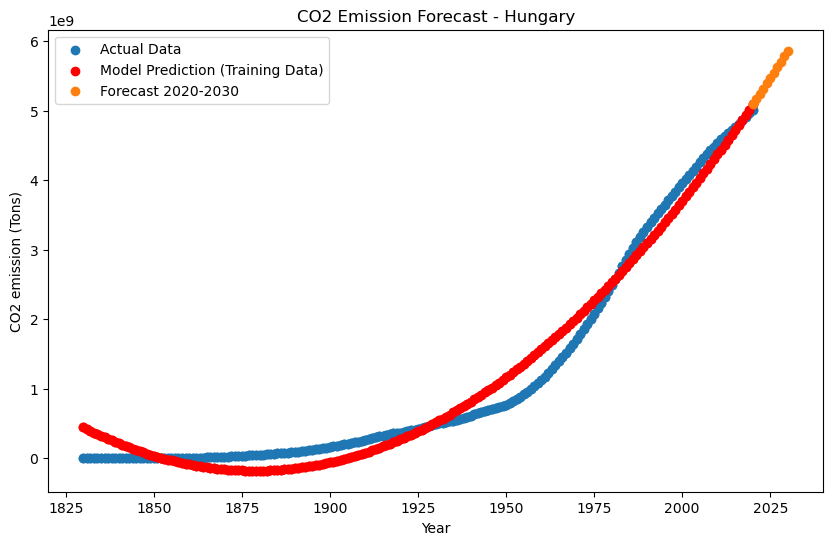

Iceland Metrics:
Iceland Predictions (2020-2030):
2020: 151217698.52861023
2021: 154943773.73399353
2022: 158715023.94029236
2023: 162531449.1475067
2024: 166393049.35562134
2025: 170299824.56463623
2026: 174251774.7745514
2027: 178248899.98536682
2028: 182291200.19708252
2029: 186378675.40968323
2030: 190511325.62321472


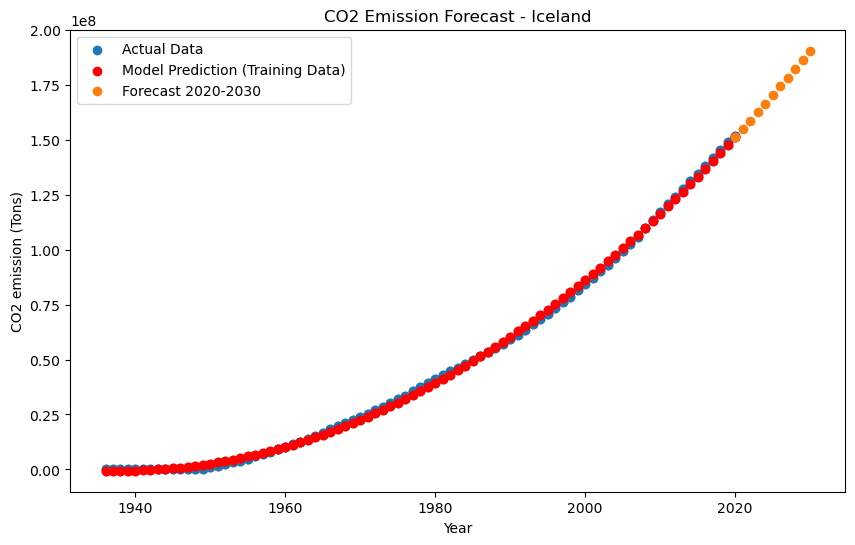

India Metrics:
India Predictions (2020-2030):
2020: 35877934096.50586
2021: 36598310182.984375
2022: 37325271488.26367
2023: 38058818012.3457
2024: 38798949755.23047
2025: 39545666716.916016
2026: 40298968897.40234
2027: 41058856296.6875
2028: 41825328914.77734
2029: 42598386751.66992
2030: 43378029807.36328


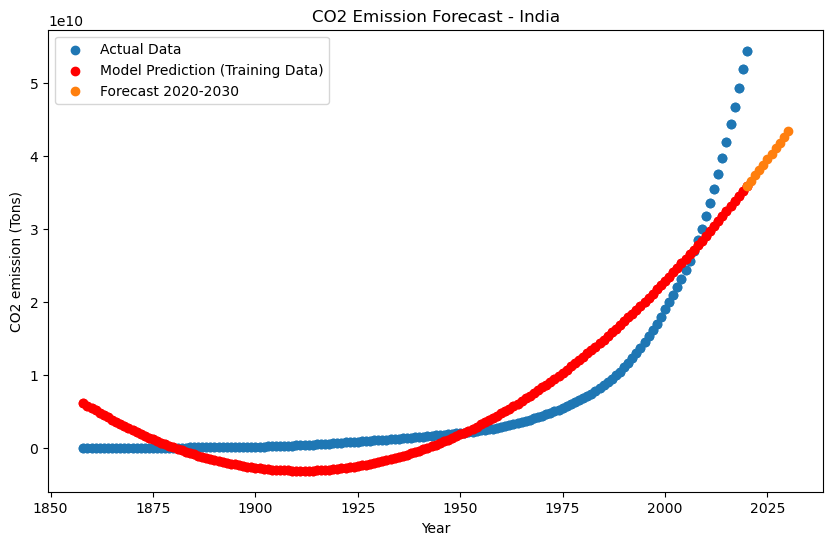

Indonesia Metrics:
Indonesia Predictions (2020-2030):
2020: 10825319973.112305
2021: 11081284016.355469
2022: 11340059761.5625
2023: 11601647208.734375
2024: 11866046357.870117
2025: 12133257208.969727
2026: 12403279762.032227
2027: 12676114017.060547
2028: 12951759974.052734
2029: 13230217633.009766
2030: 13511486993.93164


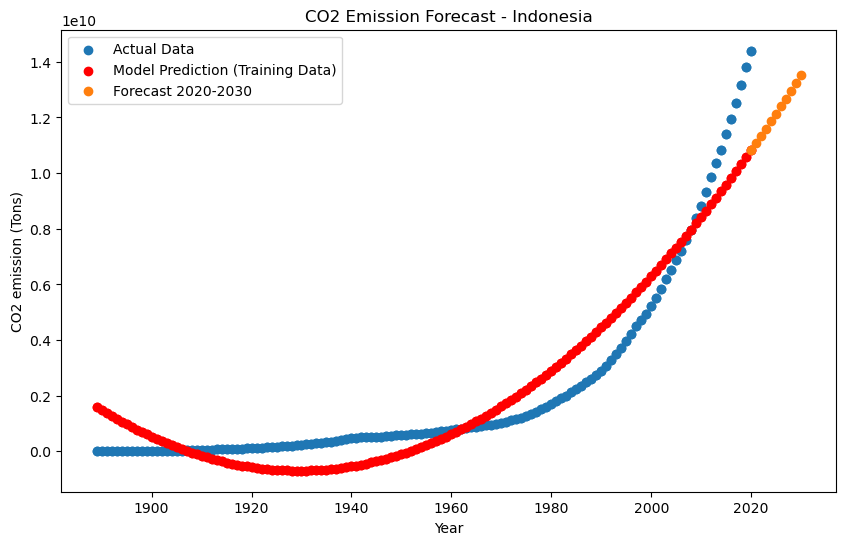

Iran Metrics:
Iran Predictions (2020-2030):
2020: 15738369256.603516
2021: 16134249493.089844
2022: 16534873902.777344
2023: 16940242485.65625
2024: 17350355241.73633
2025: 17765212171.015625
2026: 18184813273.492188
2027: 18609158549.16211
2028: 19038247998.033203
2029: 19472081620.103516
2030: 19910659415.365234


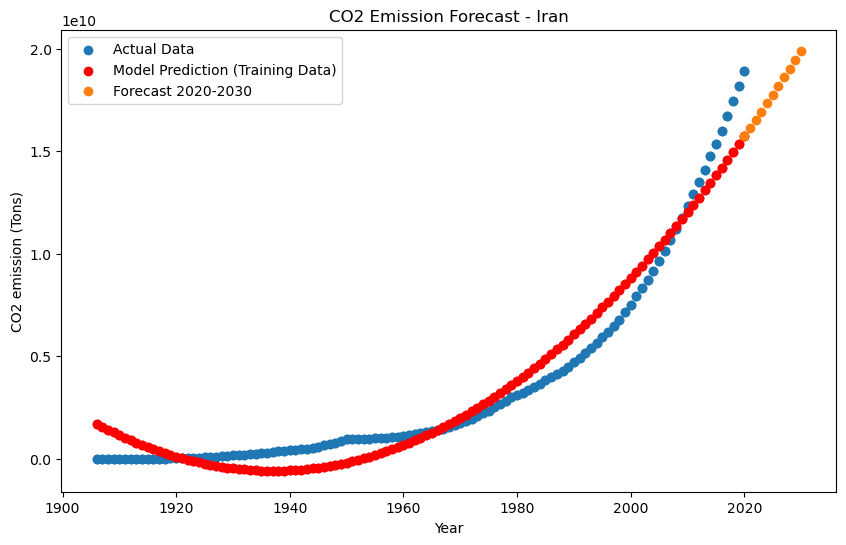

Iraq Metrics:
Iraq Predictions (2020-2030):
2020: 4031292644.3793945
2021: 4146401202.2817383
2022: 4263109020.7539062
2023: 4381416099.79541
2024: 4501322439.404785
2025: 4622828039.584473
2026: 4745932900.333008
2027: 4870637021.649902
2028: 4996940403.537109
2029: 5124843045.993164
2030: 5254344949.018555


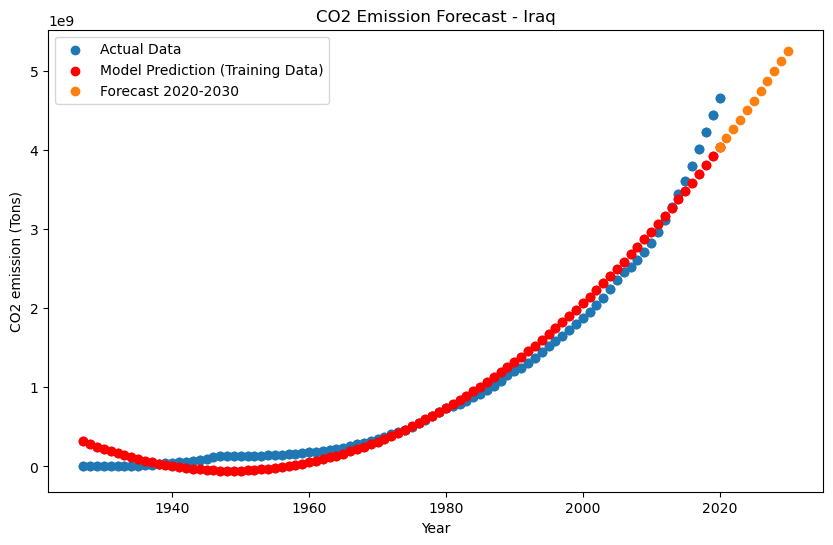

Ireland Metrics:
Ireland Predictions (2020-2030):
2020: 2040512915.175354
2021: 2076082939.0807495
2022: 2111943923.0167847
2023: 2148095866.9833984
2024: 2184538770.980652
2025: 2221272635.008484
2026: 2258297459.0669556
2027: 2295613243.1557617
2028: 2333219987.2754517
2029: 2371117691.42572
2030: 2409306355.6066284


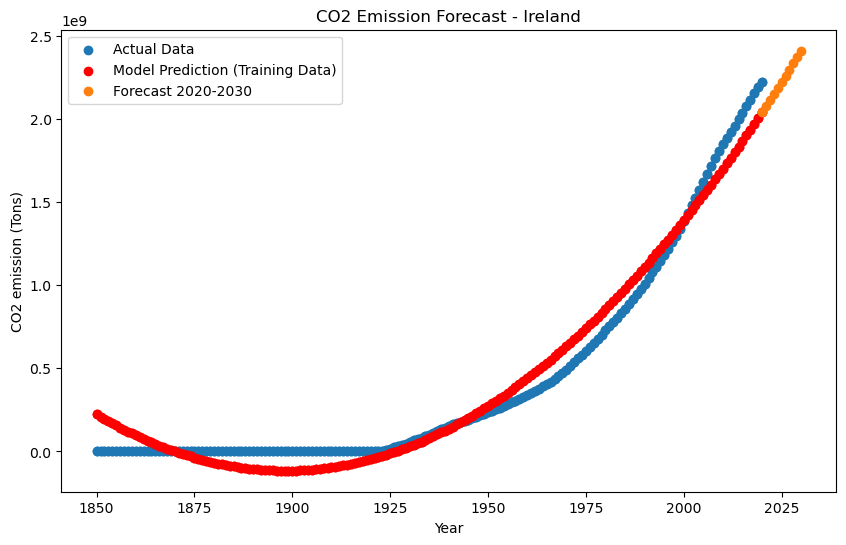

Israel Metrics:
Israel Predictions (2020-2030):
2020: 2347775944.1708984
2021: 2417054894.650635
2022: 2487318090.470703
2023: 2558565531.6308594
2024: 2630797218.1313477
2025: 2704013149.972412
2026: 2778213327.153076
2027: 2853397749.6740723
2028: 2929566417.5351562
2029: 3006719330.7365723
2030: 3084856489.278076


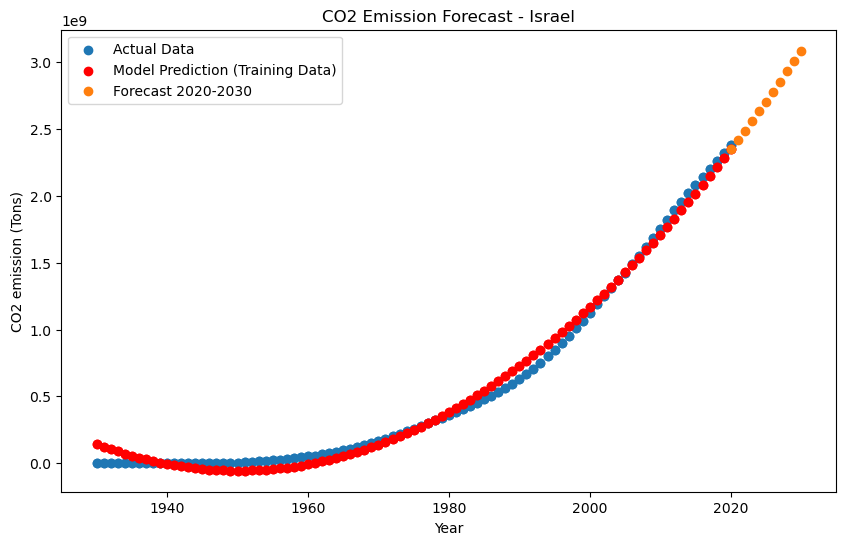

Italy Metrics:
Italy Predictions (2020-2030):
2020: 23719924622.575195
2021: 24156358521.473633
2022: 24596583230.404297
2023: 25040598749.368164
2024: 25488405078.365234
2025: 25940002217.395508
2026: 26395390166.458984
2027: 26854568925.555664
2028: 27317538494.685547
2029: 27784298873.848633
2030: 28254850063.043945


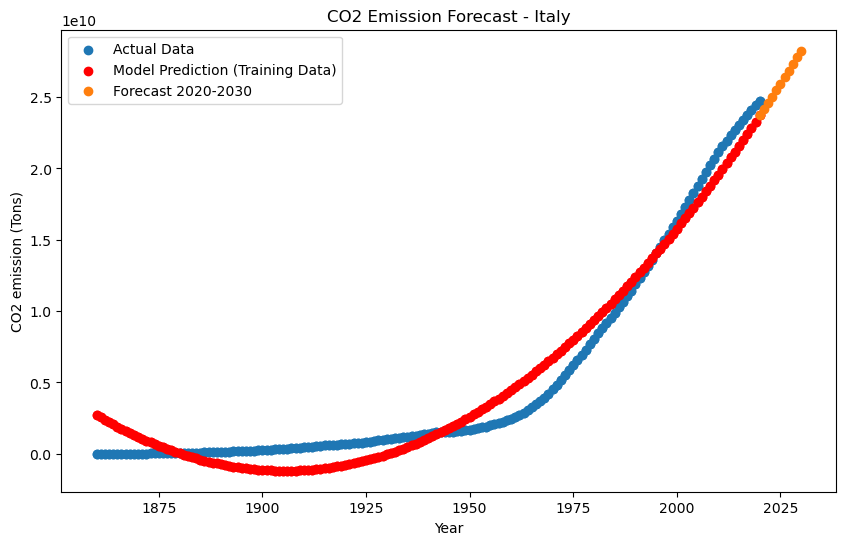

Jamaica Metrics:
Jamaica Predictions (2020-2030):
2020: 474009337.32110596
2021: 485724018.07180786
2022: 497571904.4395752
2023: 509552996.42440796
2024: 521667294.0262451
2025: 533914797.2451782
2026: 546295506.0811462
2027: 558809420.5341187
2028: 571456540.604187
2029: 584236866.2913208
2030: 597150397.5954285


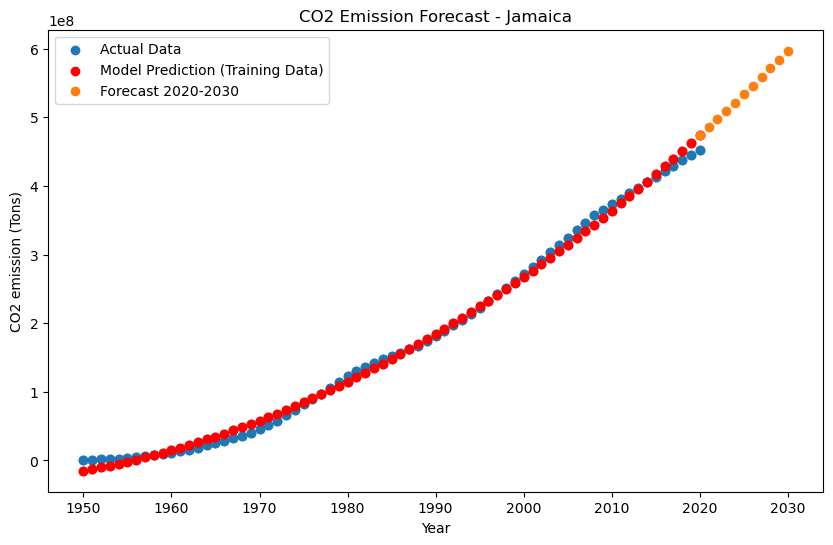

Japan Metrics:
Japan Predictions (2020-2030):
2020: 61757270985.06641
2021: 62954584208.33984
2022: 64162828100.58594
2023: 65382002661.80469
2024: 66612107892.00781
2025: 67853143791.17969
2026: 69105110359.32422
2027: 70368007596.45312
2028: 71641835502.55078
2029: 72926594077.63281
2030: 74222283321.67969


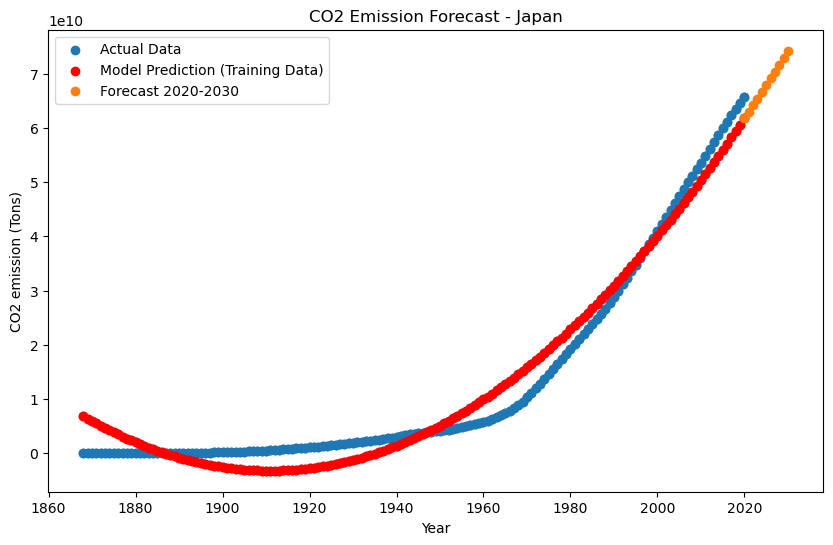

Jordan Metrics:
Jordan Predictions (2020-2030):
2020: 682183312.5327148
2021: 707182612.439331
2022: 732626308.0078125
2023: 758514399.2375488
2024: 784846886.1287842
2025: 811623768.6817627
2026: 838845046.8962402
2027: 866510720.7722168
2028: 894620790.3098145
2029: 923175255.5090332
2030: 952174116.3699951


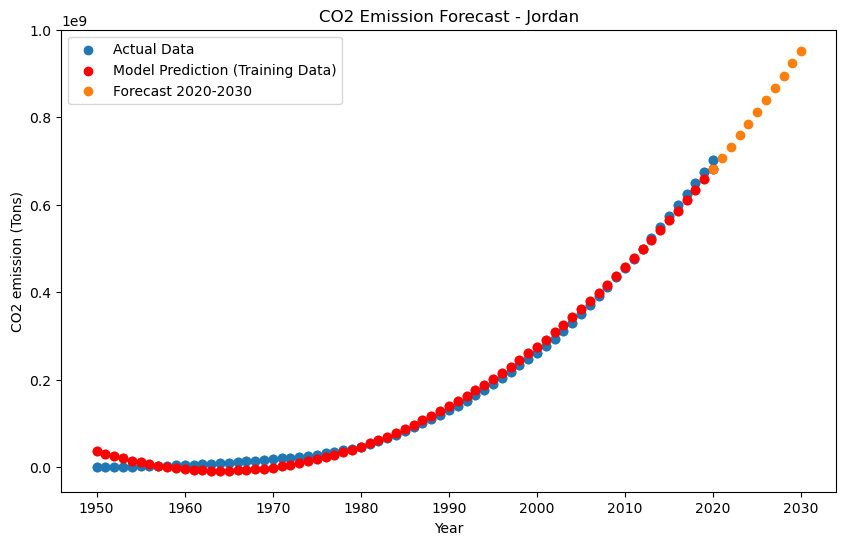

Kazakhstan Metrics:
Kazakhstan Predictions (2020-2030):
2020: 12358899170.074707
2021: 12564170677.568848
2022: 12771007728.780273
2023: 12979410323.708008
2024: 13189378462.353027
2025: 13400912144.713867
2026: 13614011370.79248
2027: 13828676140.58789
2028: 14044906454.100098
2029: 14262702311.32959
2030: 14482063712.27539


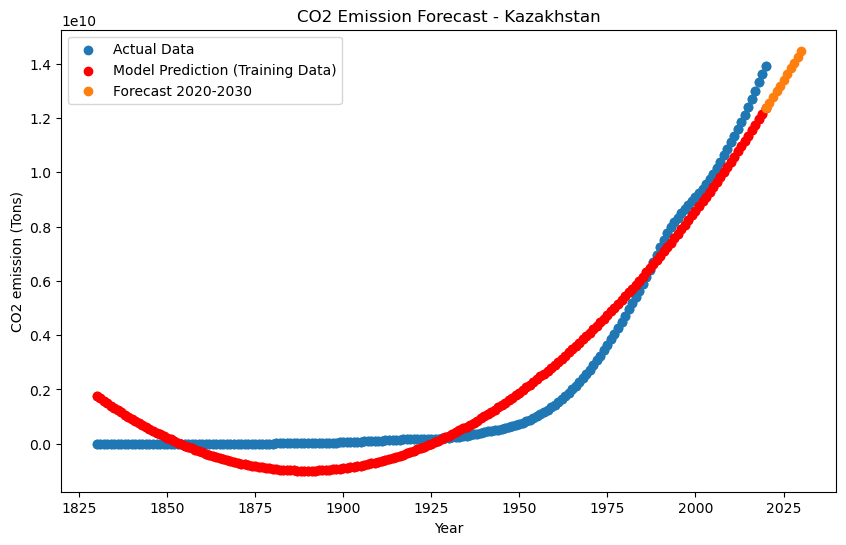

Kenya Metrics:
Kenya Predictions (2020-2030):
2020: 438822443.36694336
2021: 451403831.3015137
2022: 464168339.44085693
2023: 477115967.7848511
2024: 490246716.3334961
2025: 503560585.086853
2026: 517057574.04504395
2027: 530737683.2078247
2028: 544600912.5752563
2029: 558647262.147583
2030: 572876731.9244385


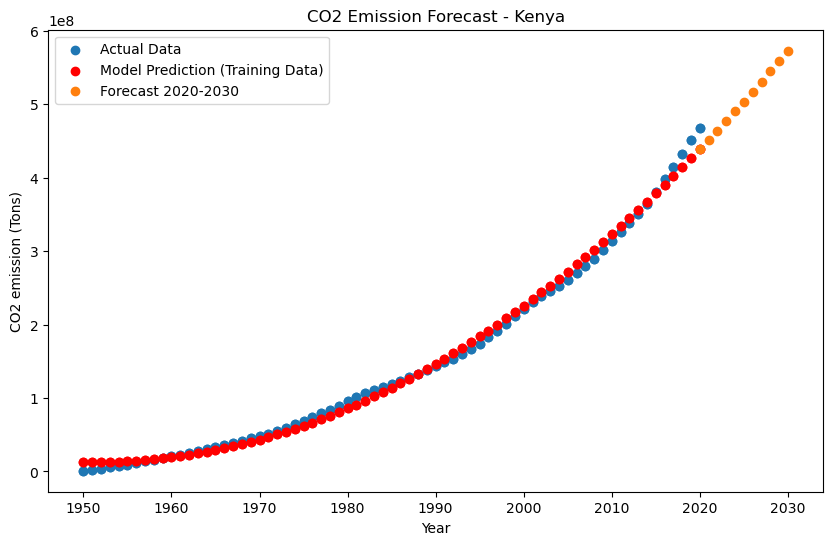

Kiribati Metrics:
Kiribati Predictions (2020-2030):
2020: 2011028.870921135
2021: 2067824.465229988
2022: 2125410.148692608
2023: 2183785.921310425
2024: 2242951.7830827236
2025: 2302907.7340095043
2026: 2363653.774090767
2027: 2425189.90332675
2028: 2487516.1217164993
2029: 2550632.429261446
2030: 2614538.8259608746


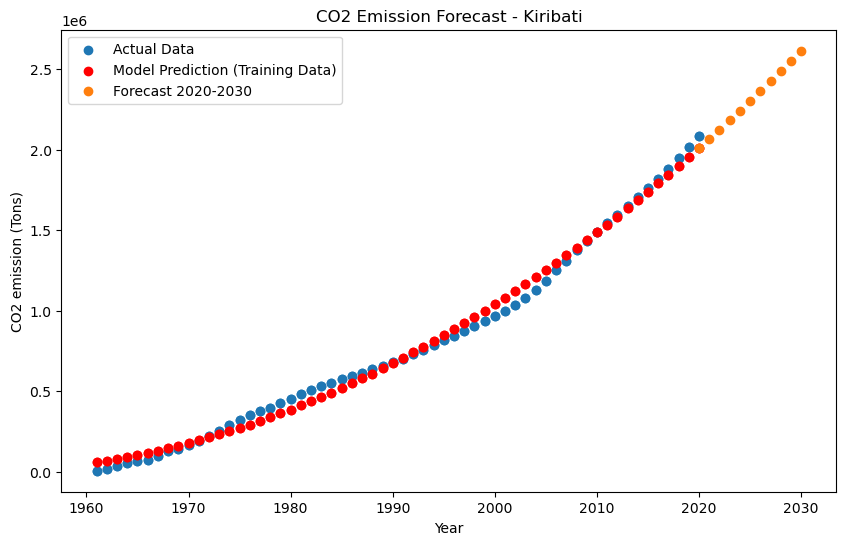

Kosovo Metrics:
Kosovo Predictions (2020-2030):
2020: 105660869.54899597
2021: 114112342.17424011
2022: 122609009.02922058
2023: 131150870.11399841
2024: 139737925.42852783
2025: 148370174.9728241
2026: 157047618.74687195
2027: 165770256.75068665
2028: 174538088.9842224
2029: 183351115.44755554
2030: 192209336.14065552


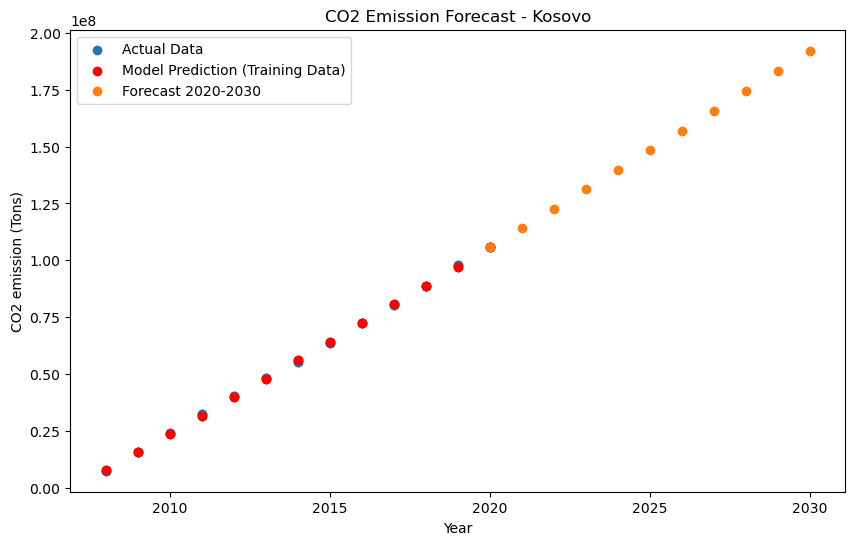

Kuwait Metrics:
Kuwait Predictions (2020-2030):
2020: 2750315060.015625
2021: 2834576391.419922
2022: 2920123592.498535
2023: 3006956663.2495117
2024: 3095075603.6728516
2025: 3184480413.7695312
2026: 3275171093.538574
2027: 3367147642.9814453
2028: 3460410062.097168
2029: 3554958350.885254
2030: 3650792509.3466797


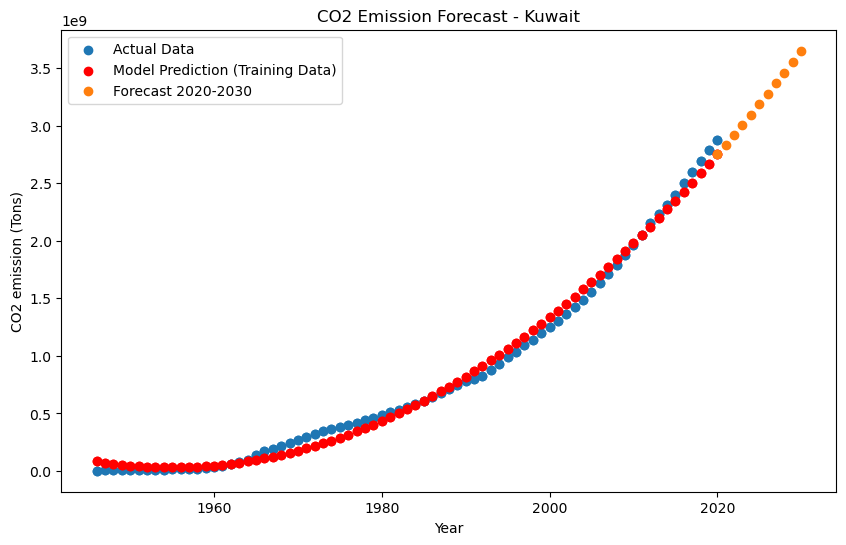

Kyrgyzstan Metrics:
Kyrgyzstan Predictions (2020-2030):
2020: 896570267.9129028
2021: 910887054.3858948
2022: 925310164.6437073
2023: 939839598.6862183
2024: 954475356.5134888
2025: 969217438.1254272
2026: 984065843.5221558
2027: 999020572.7036133
2028: 1014081625.6697998
2029: 1029249002.4206848
2030: 1044522702.9563293


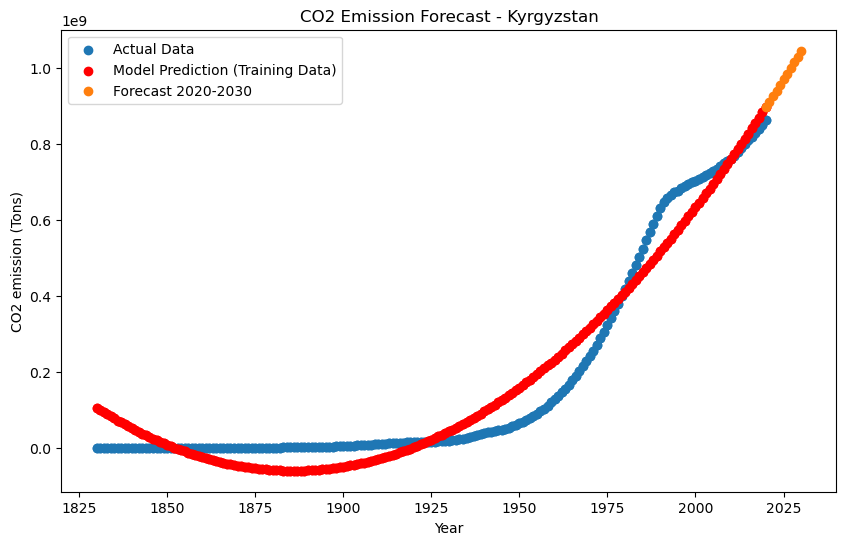

Laos Metrics:
Laos Predictions (2020-2030):
2020: 93747654.40176392
2021: 98307852.82736206
2022: 102970163.95059204
2023: 107734587.77139282
2024: 112601124.28979492
2025: 117569773.50579834
2026: 122640535.41940308
2027: 127813410.03060913
2028: 133088397.3394165
2029: 138465497.3458557
2030: 143944710.04986572


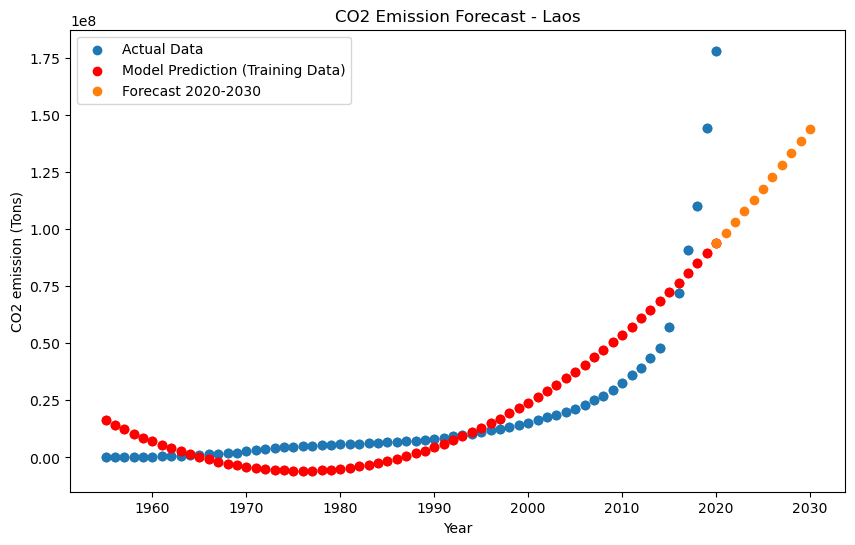

Latvia Metrics:
Latvia Predictions (2020-2030):
2020: 1013030085.2383423
2021: 1029214722.8457336
2022: 1045519599.2675781
2023: 1061944714.5039368
2024: 1078490068.554718
2025: 1095155661.4199219
2026: 1111941493.0996094
2027: 1128847563.59375
2028: 1145873872.9023438
2029: 1163020421.0253906
2030: 1180287207.9629517


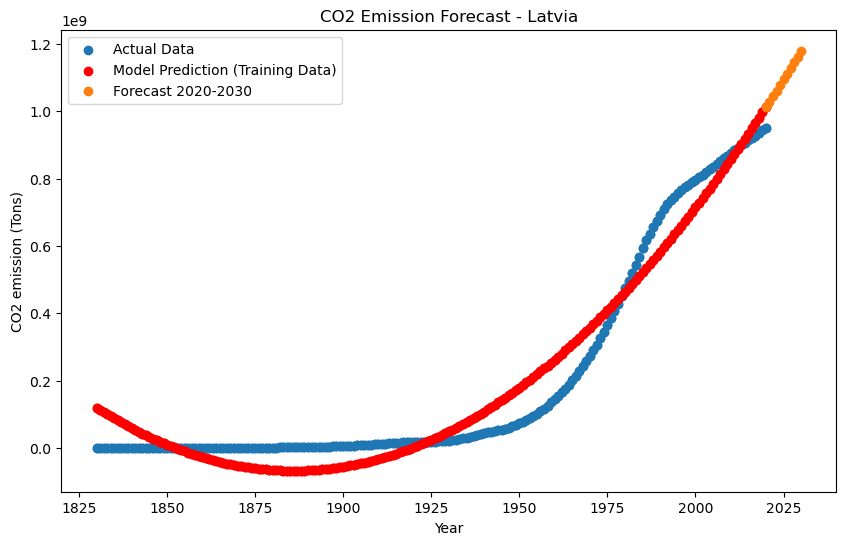

Lebanon Metrics:
Lebanon Predictions (2020-2030):
2020: 675018259.9125977
2021: 694877088.1072998
2022: 715018959.9225464
2023: 735443875.3585815
2024: 756151834.414856
2025: 777142837.0916138
2026: 798416883.388916
2027: 819973973.3067627
2028: 841814106.8451538
2029: 863937284.0040283
2030: 886343504.7833862


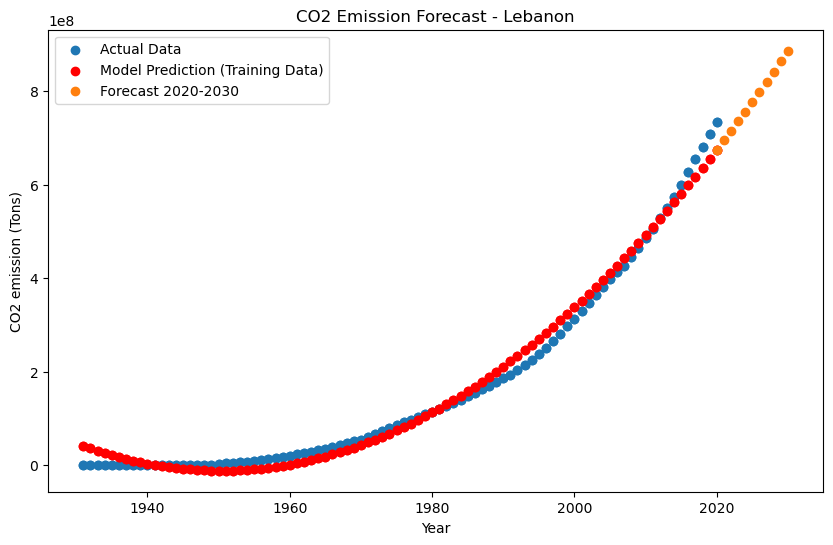

Lesotho Metrics:
Lesotho Predictions (2020-2030):
2020: 64823474.63723755
2021: 67573050.87585449
2022: 70363919.54676819
2023: 73196080.65002441
2024: 76069534.18553162
2025: 78984280.15335083
2026: 81940318.55345154
2027: 84937649.38586426
2028: 87976272.65057373
2029: 91056188.34761047
2030: 94177396.47692871


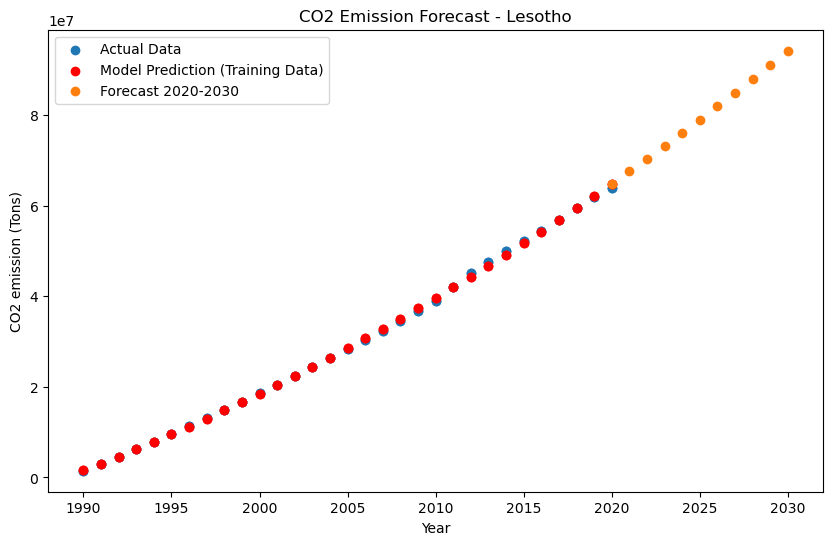

Liberia Metrics:
Liberia Predictions (2020-2030):
2020: 50766848.55966377
2021: 51442842.6040535
2022: 52114966.33695221
2023: 52783219.758356094
2024: 53447602.868270874
2025: 54108115.66669083
2026: 54764758.15361595
2027: 55417530.329050064
2028: 56066432.192993164
2029: 56711463.74544144
2030: 57352624.98639679


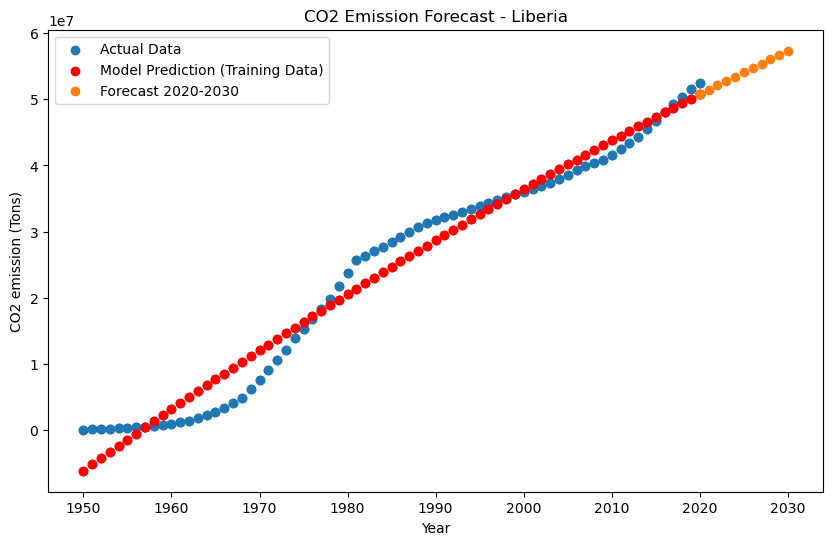

Libya Metrics:
Libya Predictions (2020-2030):
2020: 2192467428.665039
2021: 2259898369.523926
2022: 2328343019.2941895
2023: 2397801377.976074
2024: 2468273445.5703125
2025: 2539759222.0754395
2026: 2612258707.4921875
2027: 2685771901.821289
2028: 2760298805.0615234
2029: 2835839417.213379
2030: 2912393738.2766113


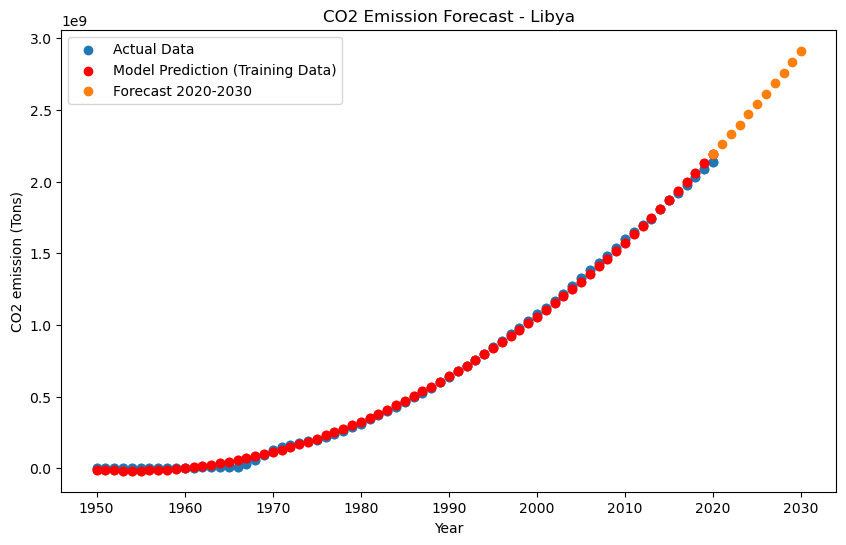

Liechtenstein Metrics:
Liechtenstein Predictions (2020-2030):
2020: 6199048.982039452
2021: 6361440.095887184
2022: 6521172.1892671585
2023: 6678245.262183189
2024: 6832659.314634323
2025: 6984414.34662056
2026: 7133510.358141899
2027: 7279947.349201202
2028: 7423725.3197927475
2029: 7564844.269920349
2030: 7703304.199583054


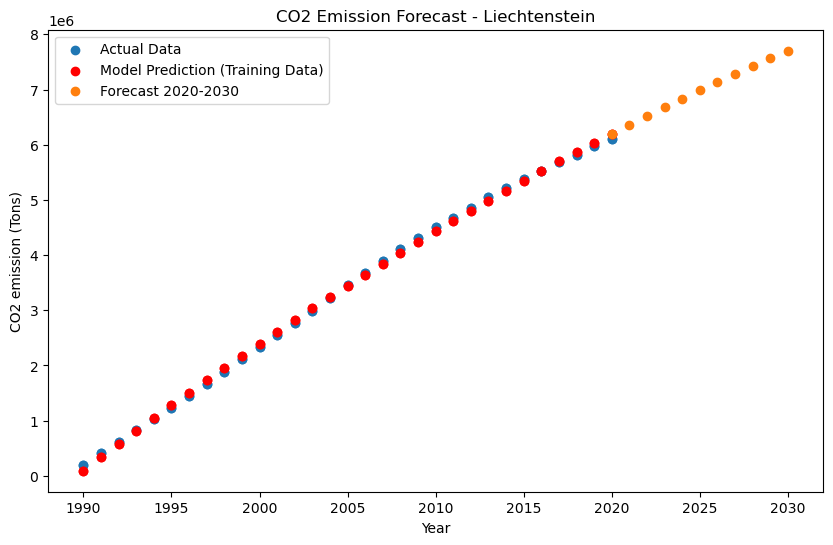

Lithuania Metrics:
Lithuania Predictions (2020-2030):
2020: 1632648015.1090698
2021: 1658896956.8963623
2022: 1685341754.1386719
2023: 1711982406.8359985
2024: 1738818914.9882202
2025: 1765851278.59552
2026: 1793079497.657898
2027: 1820503572.175293
2028: 1848123502.147644
2029: 1875939287.5750122
2030: 1903950928.4574585


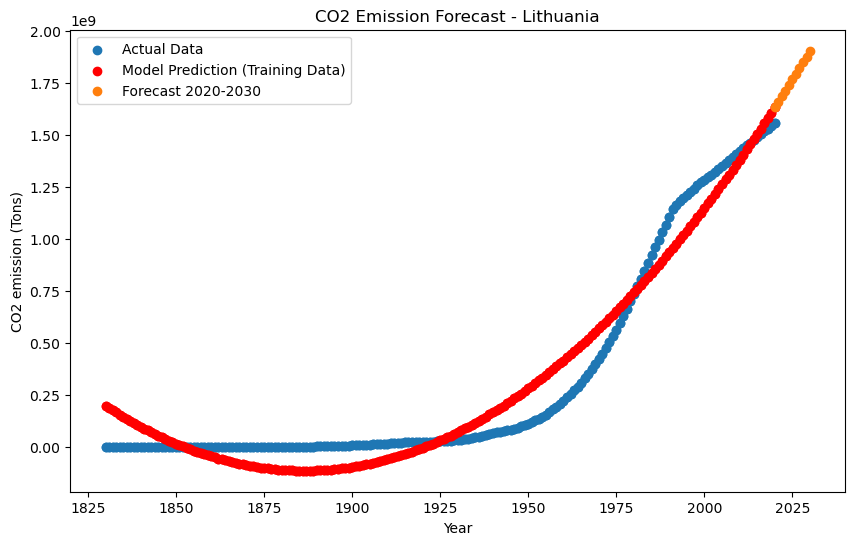

Luxembourg Metrics:
Luxembourg Predictions (2020-2030):
2020: 759092634.5225449
2021: 769356316.2837677
2022: 779608271.9791412
2023: 789848501.6086502
2024: 800077005.1723251
2025: 810293782.6701202
2026: 820498834.1020737
2027: 830692159.4681778
2028: 840873758.7684174
2029: 851043632.0028
2030: 861201779.1713486


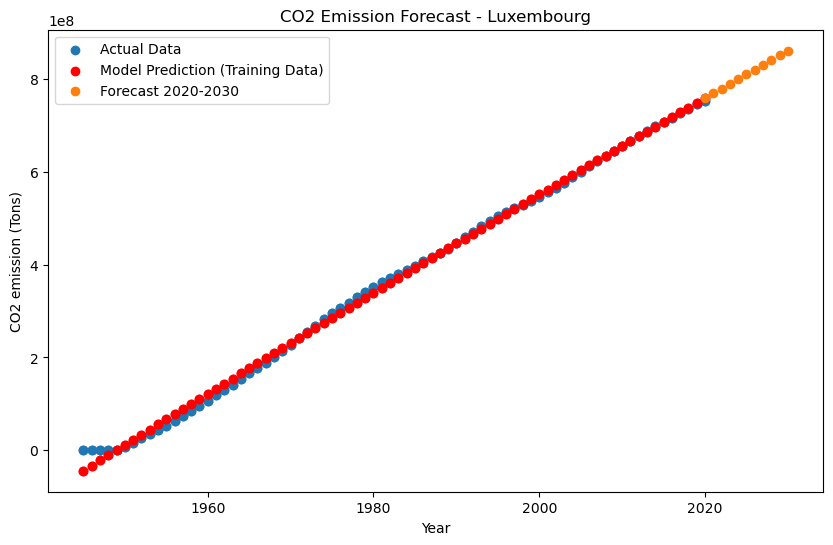

Macao Metrics:
Macao Predictions (2020-2030):
2020: 59262981.59864044
2021: 61333287.857437134
2022: 63439039.17802429
2023: 65580235.56037903
2024: 67756877.00448608
2025: 69968963.51039886
2026: 72216495.07809448
2027: 74499471.70757294
2028: 76817893.39881897
2029: 79171760.15184784
2030: 81561071.96665955


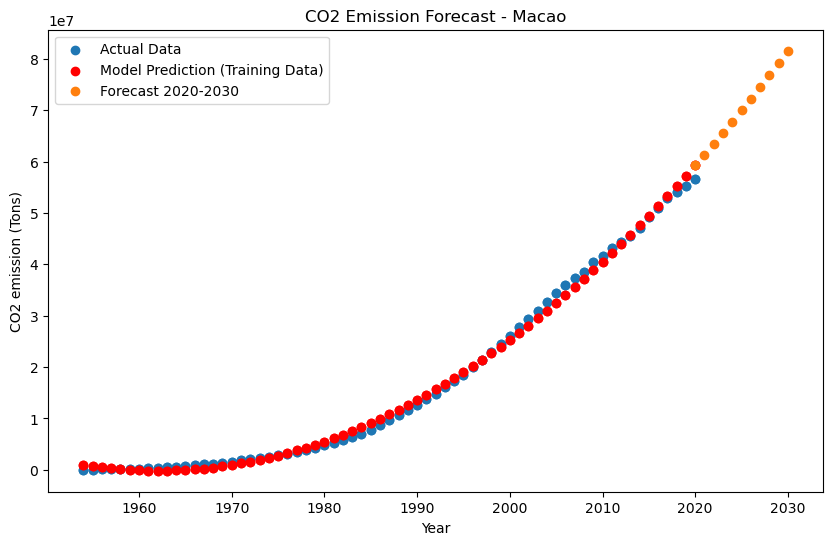

Madagascar Metrics:
Madagascar Predictions (2020-2030):
2020: 88271641.28762817
2021: 90633386.36232758
2022: 93026210.58300781
2023: 95450113.94966888
2024: 97905096.46231842
2025: 100391158.12095642
2026: 102908298.92557526
2027: 105456518.87618256
2028: 108035817.97277069
2029: 110646196.21534729
2030: 113287653.60390472


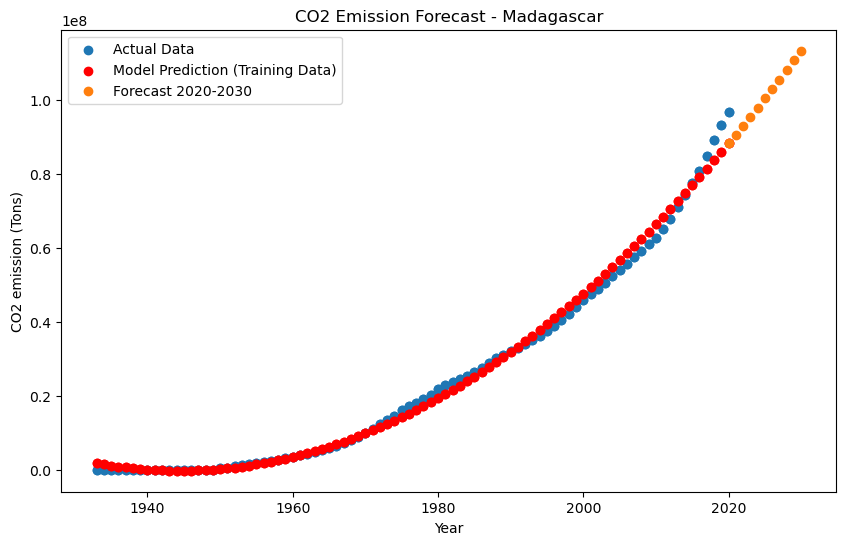

Malawi Metrics:
Malawi Predictions (2020-2030):
2020: 49359868.33546448
2021: 50550142.00982666
2022: 51754477.01026535
2023: 52972873.33680344
2024: 54205330.989429474
2025: 55451849.968135834
2026: 56712430.27294159
2027: 57987071.90382767
2028: 59275774.86081314
2029: 60578539.14388275
2030: 61895364.7530365


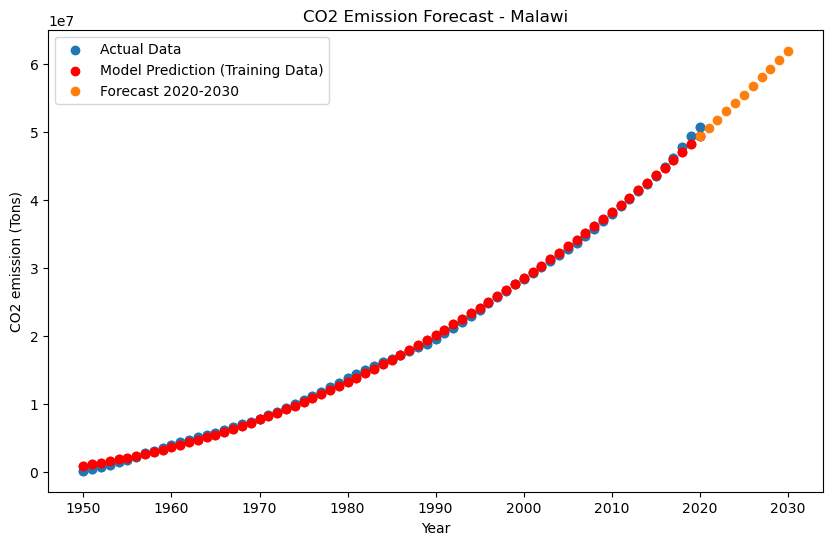

Malaysia Metrics:
Malaysia Predictions (2020-2030):
2020: 4375875234.390625
2021: 4487451862.013672
2022: 4600309324.399902
2023: 4714447621.548828
2024: 4829866753.459473
2025: 4946566720.131836
2026: 5064547521.566895
2027: 5183809157.764648
2028: 5304351628.724609
2029: 5426174934.445801
2030: 5549279074.930176


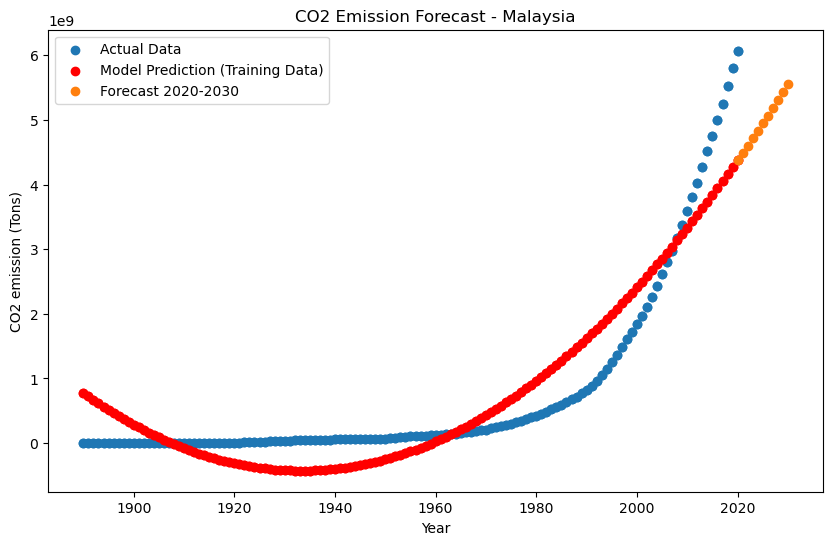

Maldives Metrics:
Maldives Predictions (2020-2030):
2020: 22596004.937278748
2021: 23864756.7023468
2022: 25167243.636032104
2023: 26503465.738327026
2024: 27873423.00921631
2025: 29277115.44873047
2026: 30714543.056861877
2027: 32185705.833602905
2028: 33690603.77895355
2029: 35229236.89289856
2030: 36801605.175476074


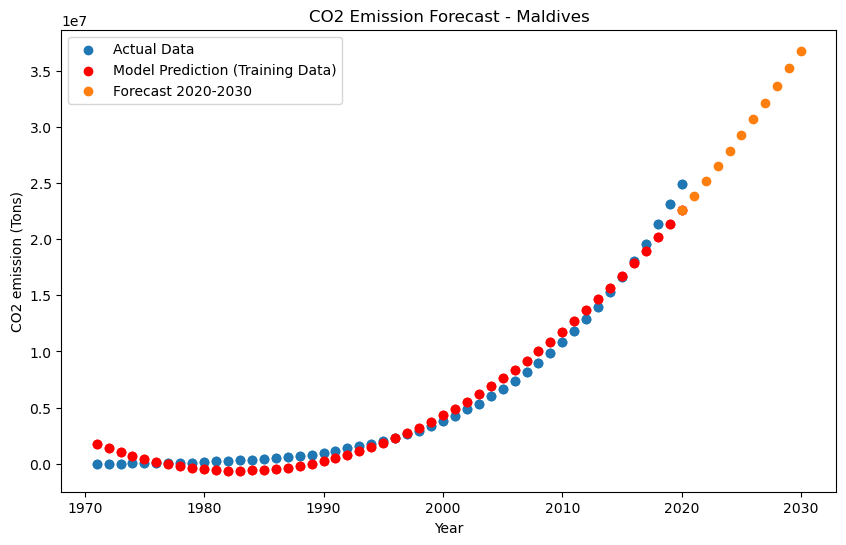

Mali Metrics:
Mali Predictions (2020-2030):
2020: 55417208.89274597
2021: 57721790.25680542
2022: 60073895.05578613
2023: 62473523.289627075
2024: 64920674.95837402
2025: 67415350.06201172
2026: 69957548.60057068
2027: 72547270.57400513
2028: 75184515.98231506
2029: 77869284.82556152
2030: 80601577.10368347


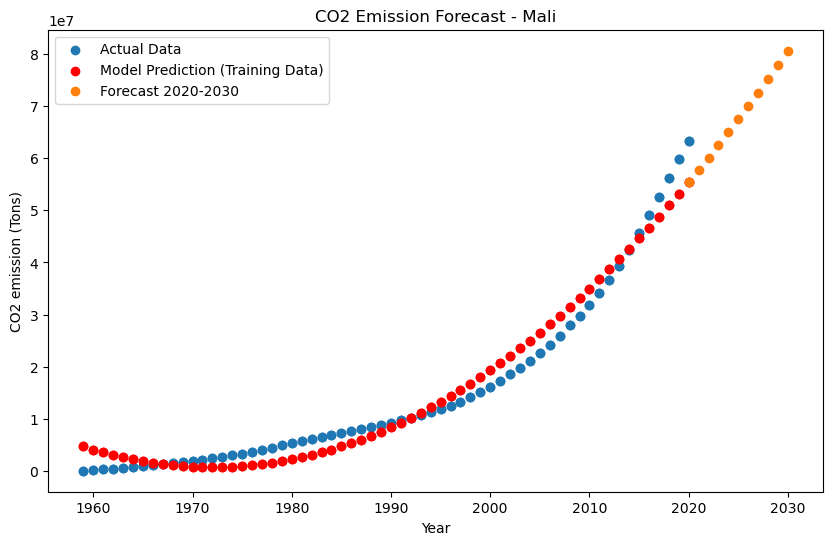

Malta Metrics:
Malta Predictions (2020-2030):
2020: 112940868.72555542
2021: 116353617.65937805
2022: 119817646.16770935
2023: 123332954.25053406
2024: 126899541.90785217
2025: 130517409.13967896
2026: 134186555.94599915
2027: 137906982.32681274
2028: 141678688.282135
2029: 145501673.81195068
2030: 149375938.91625977


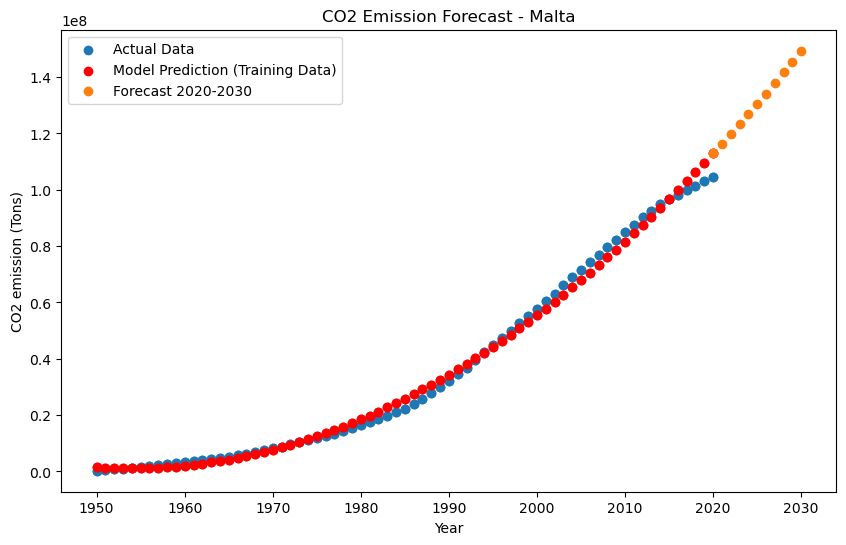

Marshall Islands Metrics:
Marshall Islands Predictions (2020-2030):
2020: 3437840.7915382385
2021: 3601021.83031559
2022: 3767176.9431791306
2023: 3936306.130126953
2024: 4108409.3911619186
2025: 4283486.726283073
2026: 4461538.13548851
2027: 4642563.61878109
2028: 4826563.176157951
2029: 5013536.80762291
2030: 5203484.513174057


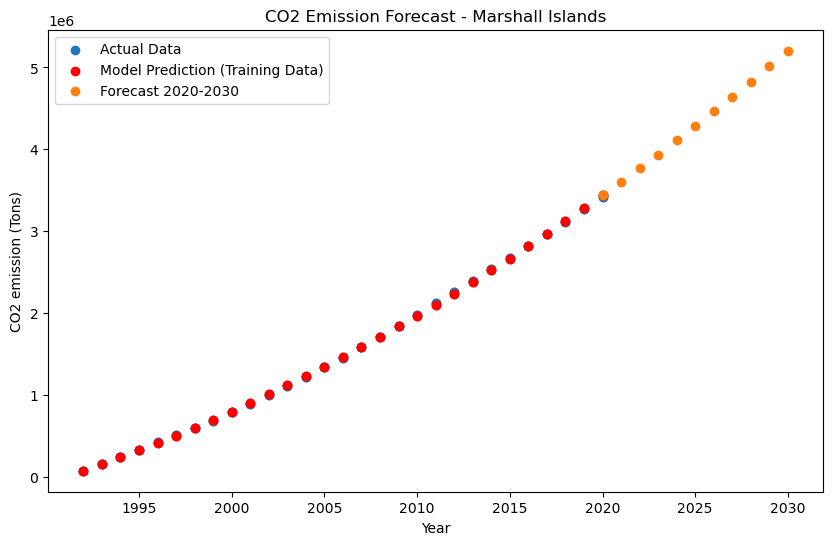

Martinique Metrics:
Martinique Predictions (2020-2030):
2020: 90629754.66558838
2021: 93509490.7260437
2022: 96434377.94911194
2023: 99404416.33485413
2024: 102419605.88319397
2025: 105479946.59420776
2026: 108585438.46783447
2027: 111736081.50413513
2028: 114931875.7030487
2029: 118172821.06460571
2030: 121458917.58883667


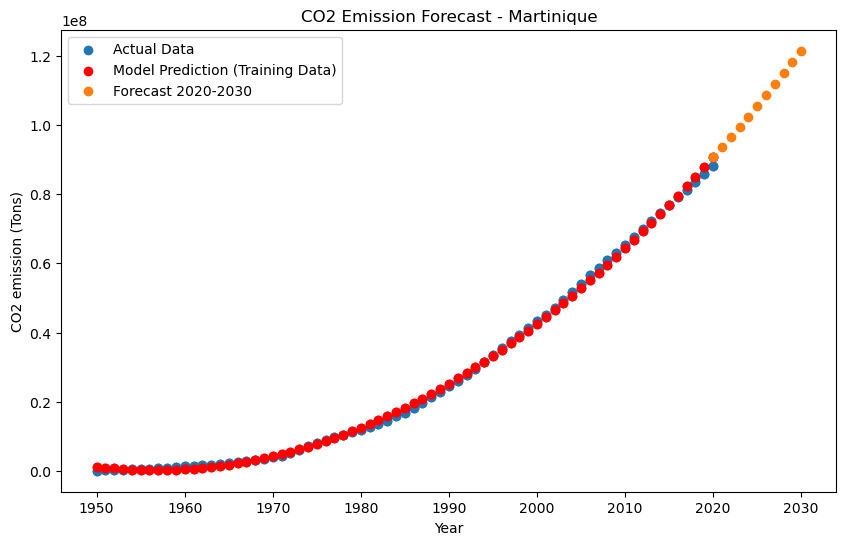

Mauritania Metrics:
Mauritania Predictions (2020-2030):
2020: 70814060.59007263
2021: 73181818.43101501
2022: 75588473.93708801
2023: 78034027.10832214
2024: 80518477.9447174
2025: 83041826.44621277
2026: 85604072.61289978
2027: 88205216.4447174
2028: 90845257.94166565
2029: 93524197.10377502
2030: 96242033.93104553


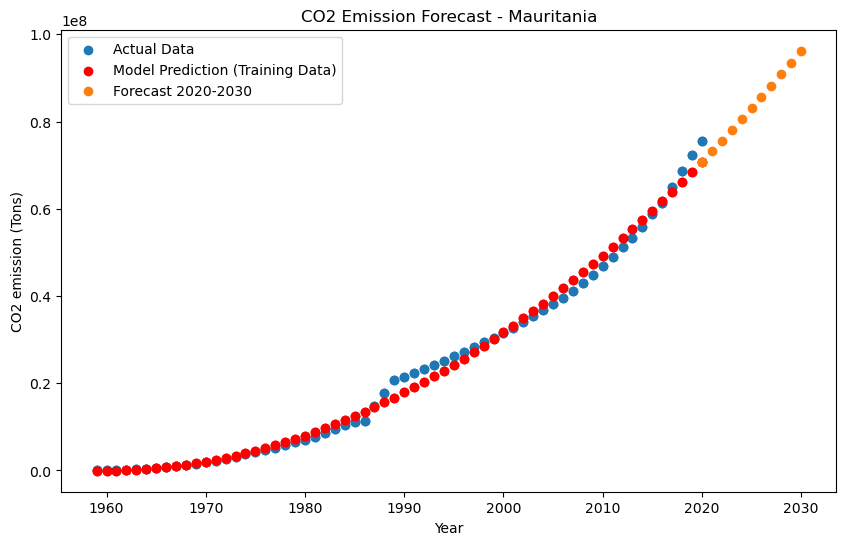

Mauritius Metrics:
Mauritius Predictions (2020-2030):
2020: 109880254.29403687
2021: 113879837.93591309
2022: 117951071.3123169
2023: 122093954.42321777
2024: 126308487.26867676
2025: 130594669.84869385
2026: 134952502.163208
2027: 139381984.21221924
2028: 143883115.99578857
2029: 148455897.51385498
2030: 153100328.7664795


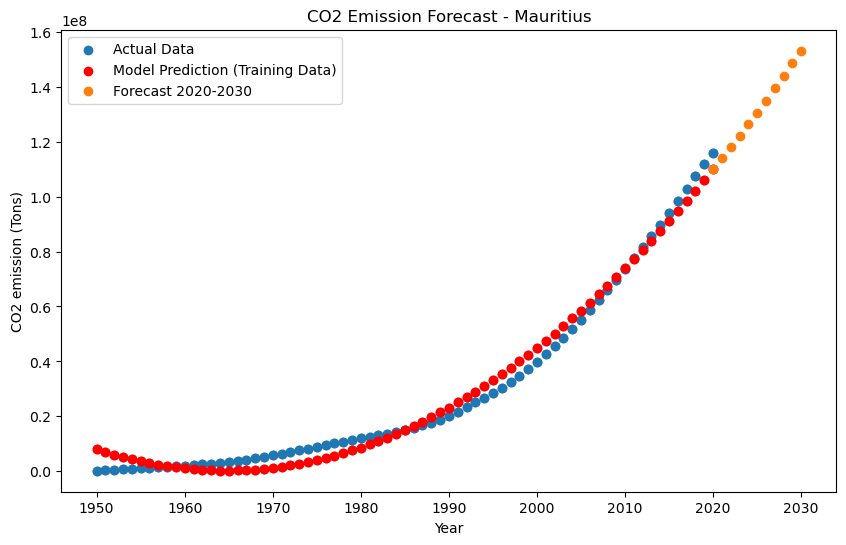

Mayotte Metrics:
Mayotte Predictions (2020-2030):
2020: 6677063.546485901
2021: 7053518.895763397
2022: 7439949.299564362
2023: 7836354.757896423
2024: 8242735.270767212
2025: 8659090.838161469
2026: 9085421.460083008
2027: 9521727.136547089
2028: 9968007.867530823
2029: 10424263.653045654
2030: 10890494.493091583


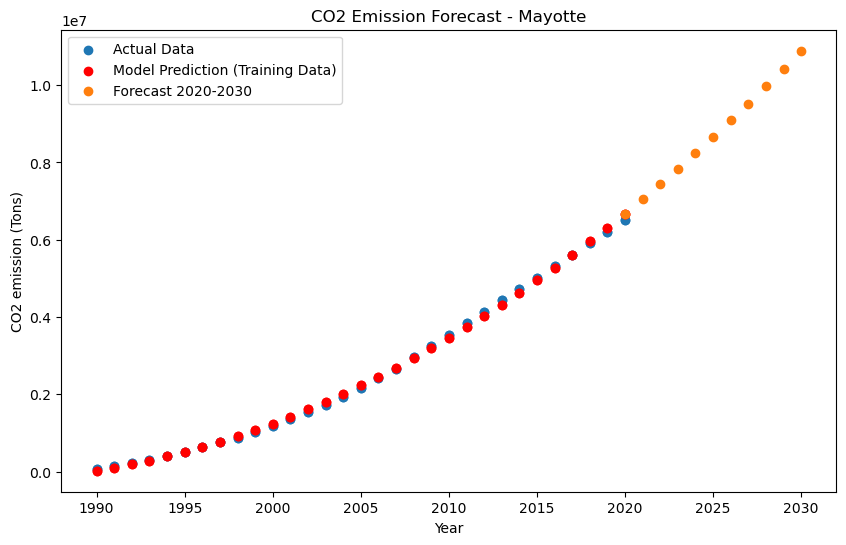

Mexico Metrics:
Mexico Predictions (2020-2030):
2020: 18459835690.552734
2021: 18864156028.109375
2022: 19272720590.751953
2023: 19685529378.48242
2024: 20102582391.296875
2025: 20523879629.197266
2026: 20949421092.185547
2027: 21379206780.256836
2028: 21813236693.416992
2029: 22251510831.660156
2030: 22694029194.989258


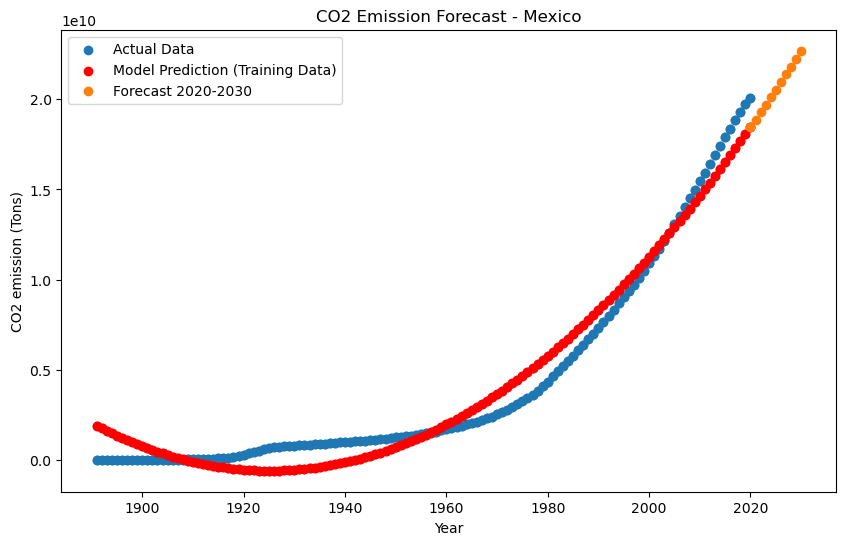

Micronesia Metrics:
Micronesia Predictions (2020-2030):
2020: 3689421.605328679
2021: 3827867.479463339
2022: 3966952.603929043
2023: 4106676.978725791
2024: 4247040.603853583
2025: 4388043.47931242
2026: 4529685.605101943
2027: 4671966.981222868
2028: 4814887.607674956
2029: 4958447.484458089
2030: 5102646.611572146


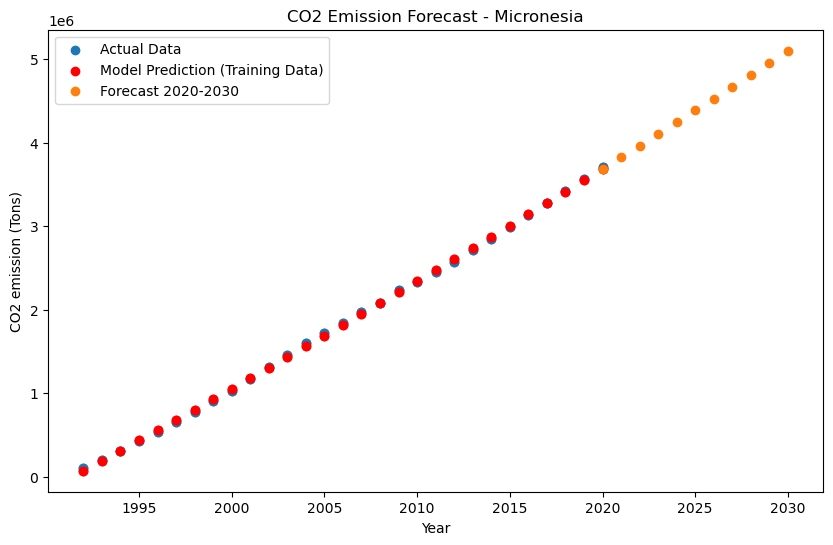

Moldova Metrics:
Moldova Predictions (2020-2030):
2020: 1575194643.7039795
2021: 1600049382.2617188
2022: 1625087139.2233887
2023: 1650307914.5888062
2024: 1675711708.3581543
2025: 1701298520.531189
2026: 1727068351.1080933
2027: 1753021200.0889282
2028: 1779157067.4734497
2029: 1805475953.2619019
2030: 1831977857.4541016


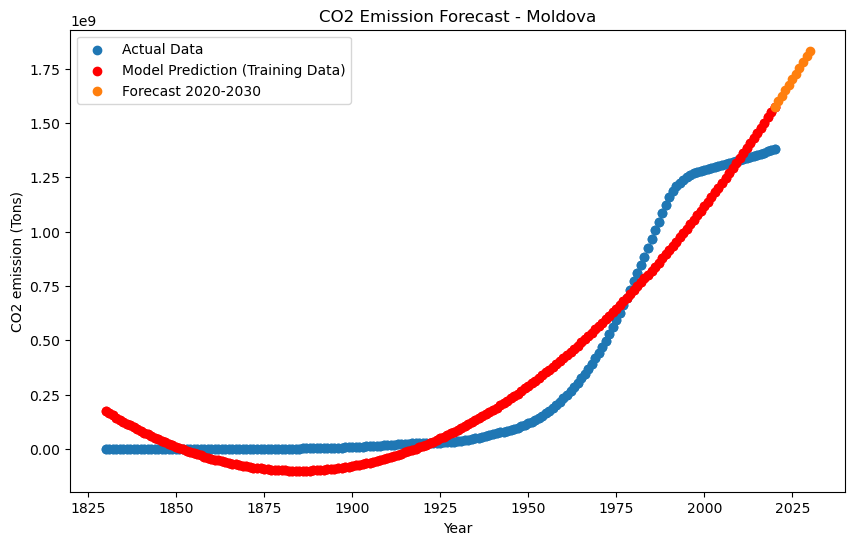

Mongolia Metrics:
Mongolia Predictions (2020-2030):
2020: 607282393.5480957
2021: 628203934.8691406
2022: 649482405.513794
2023: 671117805.4822998
2024: 693110134.7741699
2025: 715459393.3896484
2026: 738165581.3289795
2027: 761228698.5915527
2028: 784648745.1781006
2029: 808425721.0878906
2030: 832559626.3214111


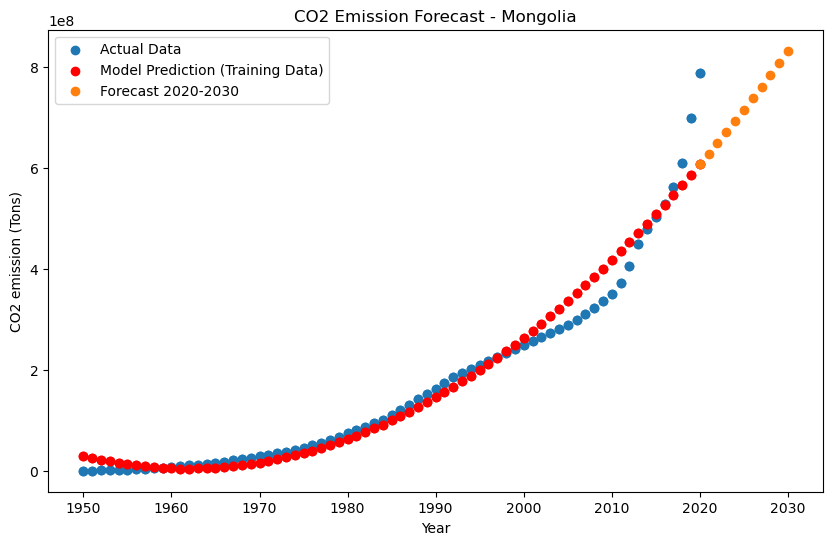

Montenegro Metrics:
Montenegro Predictions (2020-2030):
2020: 98745165.41223907
2021: 100836229.32563782
2022: 102948282.2581482
2023: 105081324.2097702
2024: 107235355.18048096
2025: 109410375.17031097
2026: 111606384.17922974
2027: 113823382.20724487
2028: 116061369.25437927
2029: 118320345.32060242
2030: 120600310.40592957


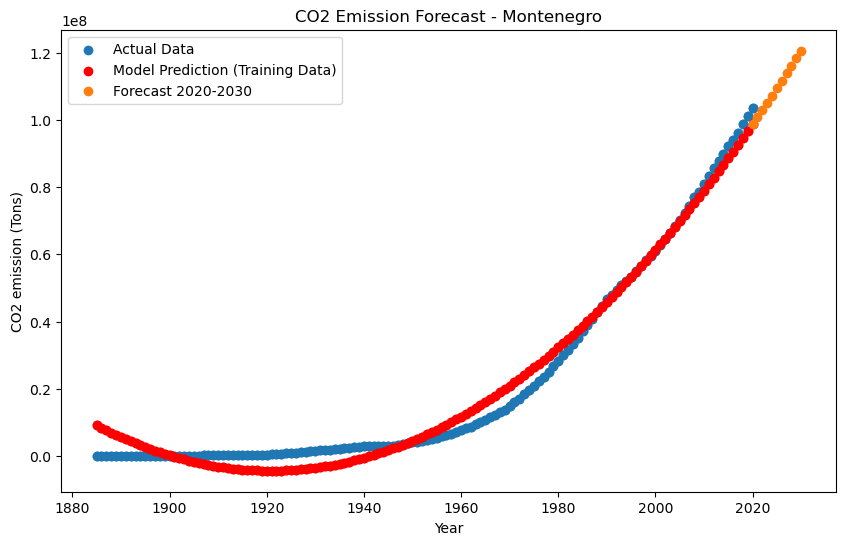

Montserrat Metrics:
Montserrat Predictions (2020-2030):
2020: 1687706.8757269382
2021: 1739768.237820387
2022: 1792600.0281693935
2023: 1846202.2467722893
2024: 1900574.8936300278
2025: 1955717.9687428474
2026: 2011631.4721097946
2027: 2068315.4037320614
2028: 2125769.7636082172
2029: 2183994.5517396927
2030: 2242989.768125534


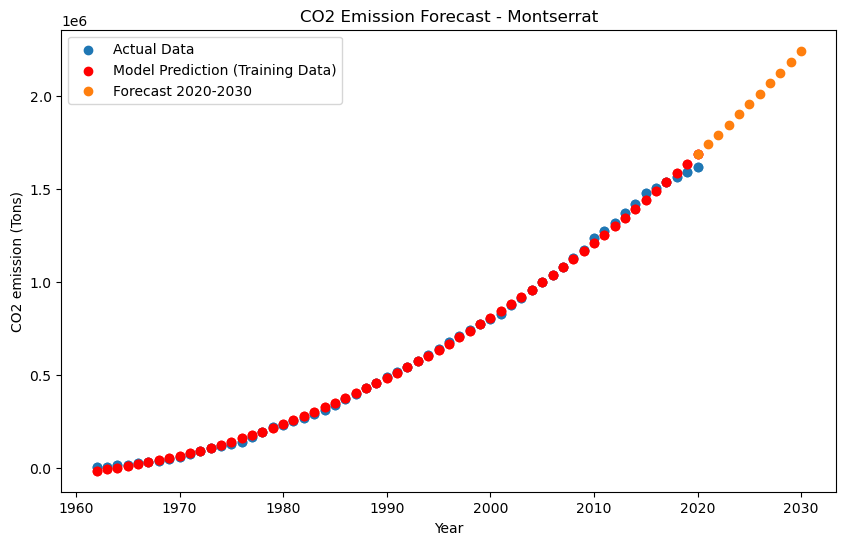

Morocco Metrics:
Morocco Predictions (2020-2030):
2020: 1577112818.2695312
2021: 1624762710.1113281
2022: 1673099866.2497559
2023: 1722124286.6848145
2024: 1771835971.416748
2025: 1822234920.4453125
2026: 1873321133.7700195
2027: 1925094611.3918457
2028: 1977555353.3105469
2029: 2030703359.5256348
2030: 2084538630.0375977


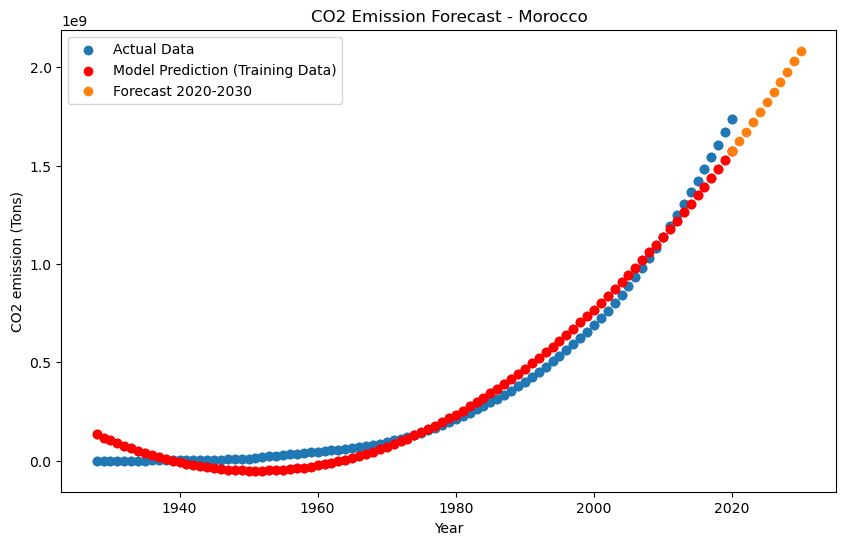

Mozambique Metrics:
Mozambique Predictions (2020-2030):
2020: 157207514.66796875
2021: 160267643.5504074
2022: 163355077.4146576
2023: 166469816.26072693
2024: 169611860.0885849
2025: 172781208.89823914
2026: 175977862.6897049
2027: 179201821.46297455
2028: 182453085.2180481
2029: 185731653.9549179
2030: 189037527.6736145


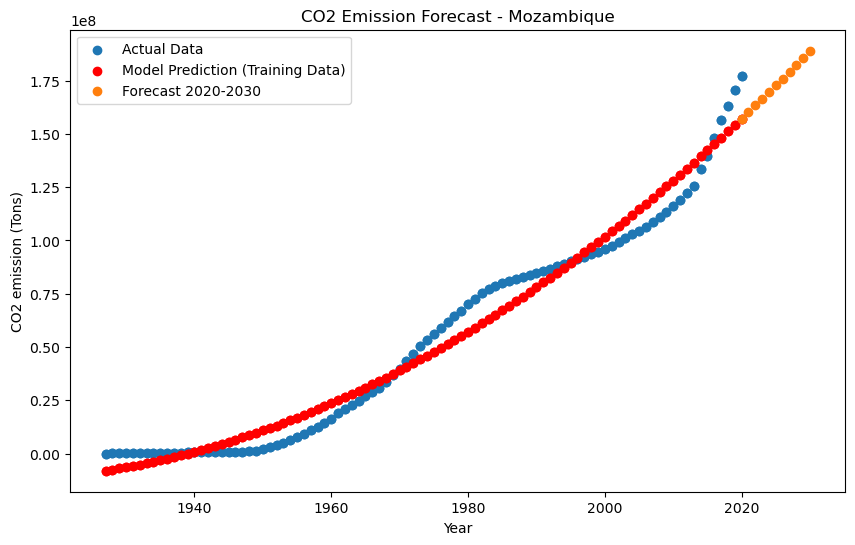

Myanmar Metrics:
Myanmar Predictions (2020-2030):
2020: 511046162.0928345
2021: 523576994.5657959
2022: 536268466.888855
2023: 549120579.0618286
2024: 562133331.0847168
2025: 575306722.9578247
2026: 588640754.6807251
2027: 602135426.2536621
2028: 615790737.6765747
2029: 629606688.949585
2030: 643583280.0725098


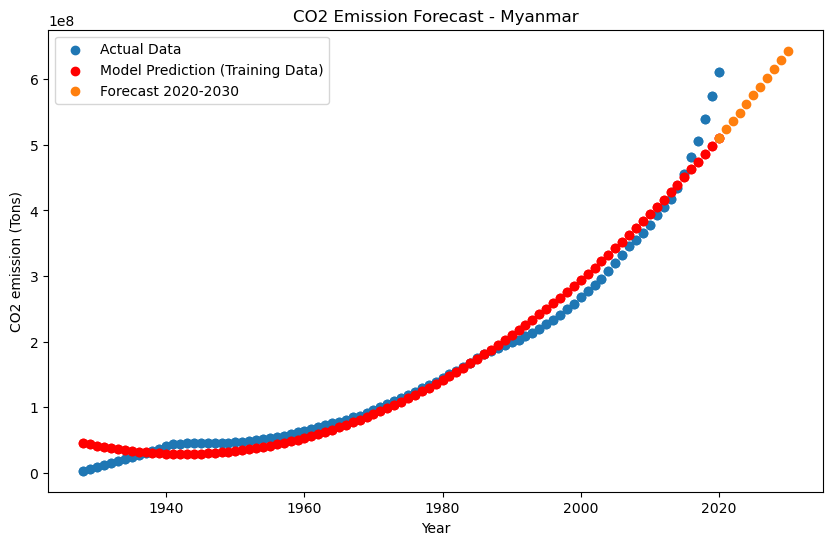

Namibia Metrics:
Namibia Predictions (2020-2030):
2020: 75633117.91021729
2021: 79868785.24099731
2022: 84217701.36230469
2023: 88679866.27420044
2024: 93255279.97665405
2025: 97943942.46960449
2026: 102745853.75317383
2027: 107661013.82730103
2028: 112689422.69198608
2029: 117831080.347229
2030: 123085986.7930603


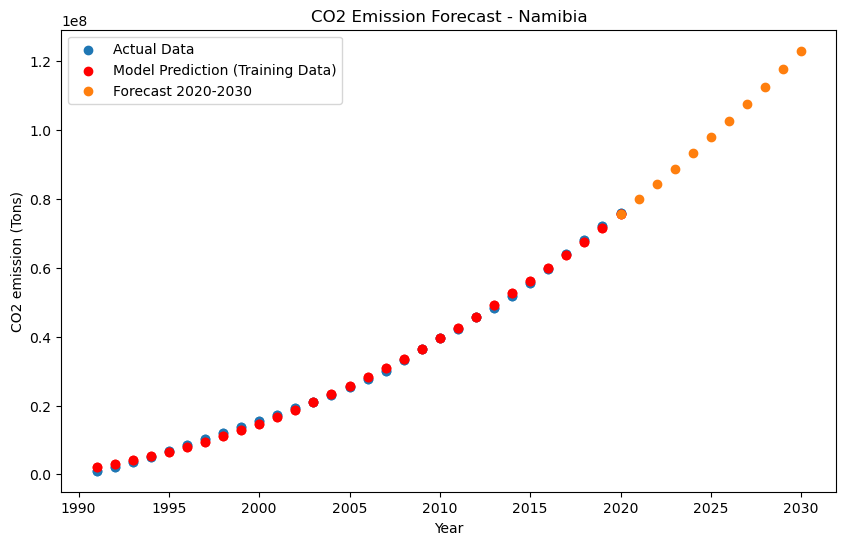

Nauru Metrics:
Nauru Predictions (2020-2030):
2020: 4981255.284930229
2021: 5035603.899824619
2022: 5088457.615287304
2023: 5139816.431317806
2024: 5189680.347915649
2025: 5238049.365082264
2026: 5284923.48281765
2027: 5330302.701120377
2028: 5374187.019990921
2029: 5416576.439430237
2030: 5457470.959437847


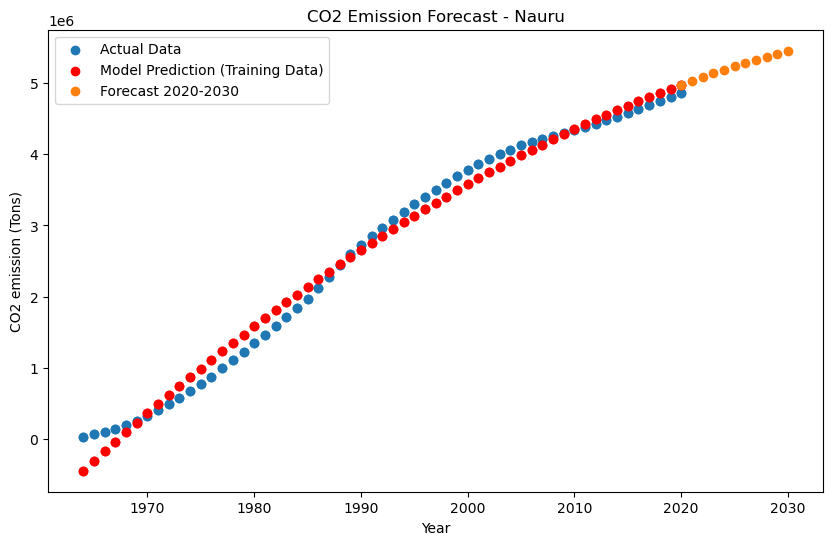

Nepal Metrics:
Nepal Predictions (2020-2030):
2020: 123610548.42996216
2021: 128814952.31704712
2022: 134122015.24752808
2023: 139531737.2215271
2024: 145044118.23892212
2025: 150659158.2998352
2026: 156376857.4041443
2027: 162197215.55197144
2028: 168120232.7432251
2029: 174145908.9779663
2030: 180274244.25610352


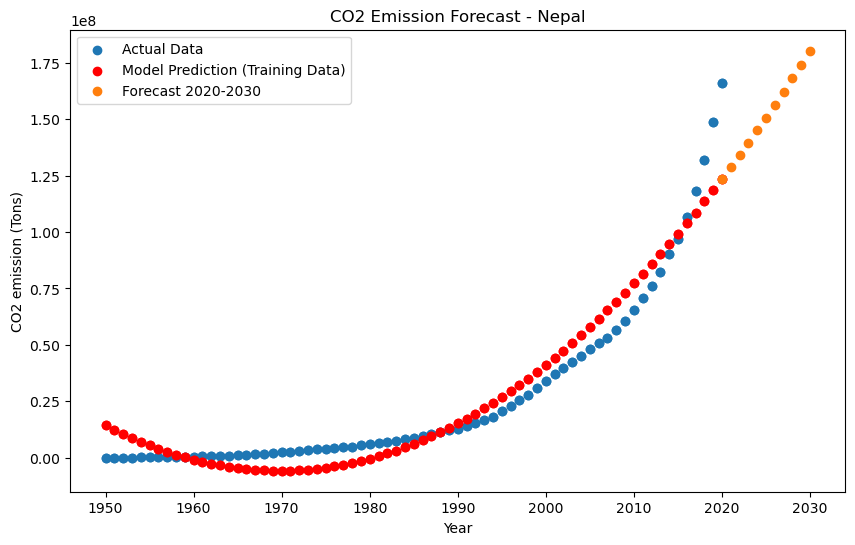

Netherlands Metrics:
Netherlands Predictions (2020-2030):
2020: 11376768853.661621
2021: 11553074334.373047
2022: 11730710075.97754
2023: 11909676078.476562
2024: 12089972341.86914
2025: 12271598866.155273
2026: 12454555651.33496
2027: 12638842697.407715
2028: 12824460004.374512
2029: 13011407572.235352
2030: 13199685400.989746


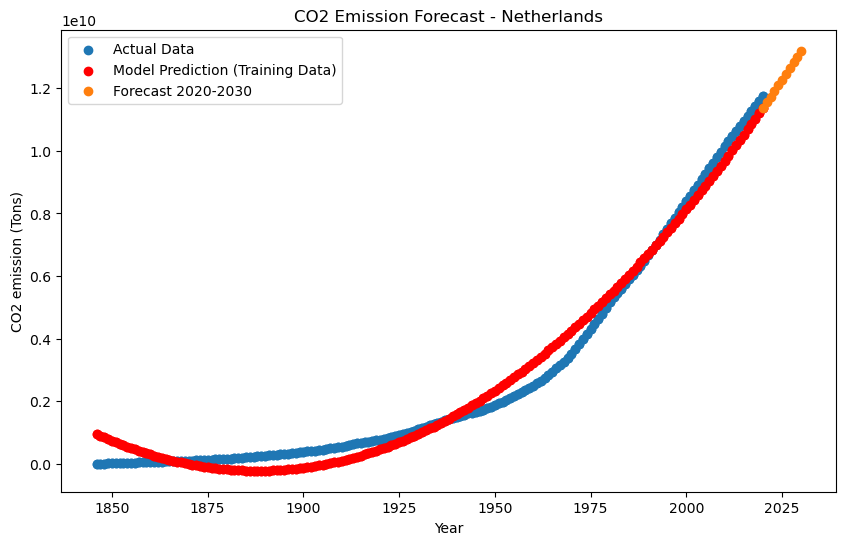

New Caledonia Metrics:
New Caledonia Predictions (2020-2030):
2020: 139570376.79382324
2021: 143000610.73851013
2022: 146471600.57000732
2023: 149983346.28831482
2024: 153535847.89343262
2025: 157129105.38534546
2026: 160763118.76408386
2027: 164437888.02964783
2028: 168153413.18199158
2029: 171909694.22114563
2030: 175706731.14709473


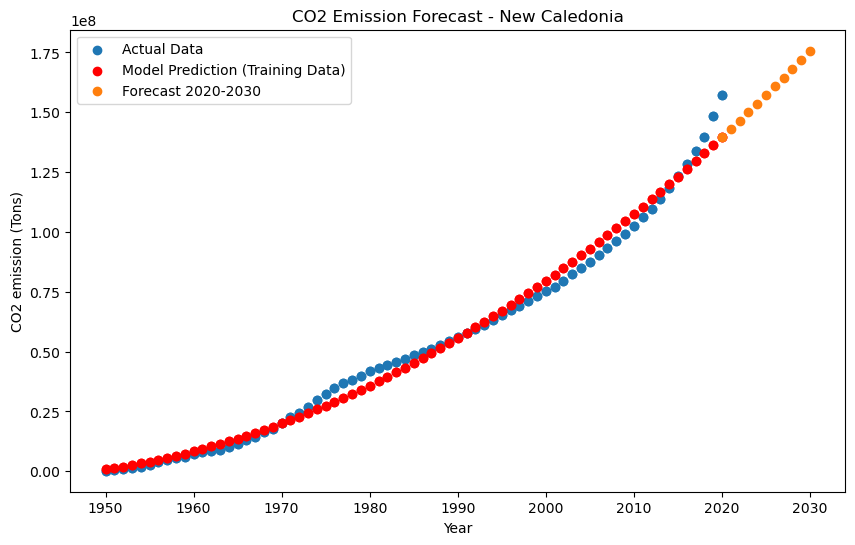

New Zealand Metrics:
New Zealand Predictions (2020-2030):
2020: 1763197119.7786865
2021: 1794469955.5444946
2022: 1826018901.182495
2023: 1857843956.6923828
2024: 1889945122.0743408
2025: 1922322397.328247
2026: 1954975782.4542236
2027: 1987905277.4520874
2028: 2021110882.3220825
2029: 2054592597.0639648
2030: 2088350421.6779785


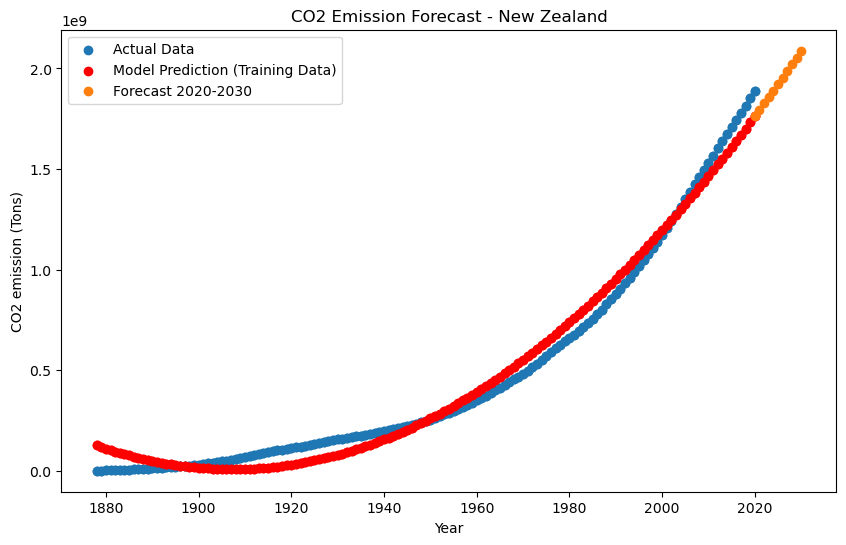

Nicaragua Metrics:
Nicaragua Predictions (2020-2030):
2020: 172991353.87295532
2021: 178036188.51470947
2022: 183153753.34906006
2023: 188344048.3760376
2024: 193607073.59561157
2025: 198942829.00784302
2026: 204351314.61270142
2027: 209832530.4102478
2028: 215386476.40039062
2029: 221013152.58312988
2030: 226712558.9584961


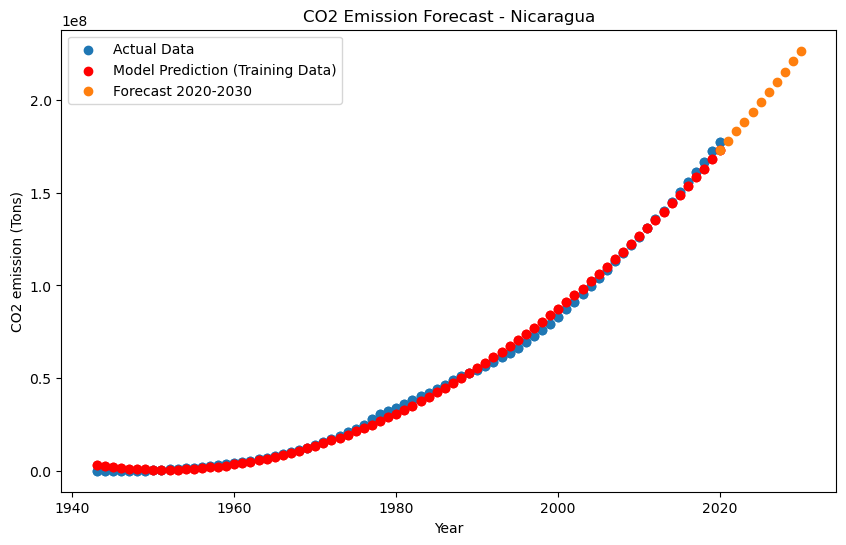

Niger Metrics:
Niger Predictions (2020-2030):
2020: 43458776.80316162
2021: 44859339.154434204
2022: 46282043.2564621
2023: 47726889.1092453
2024: 49193876.71278381
2025: 50683006.06707764
2026: 52194277.17211914
2027: 53727690.027923584
2028: 55283244.63447571
2029: 56860940.99179077
2030: 58460779.099853516


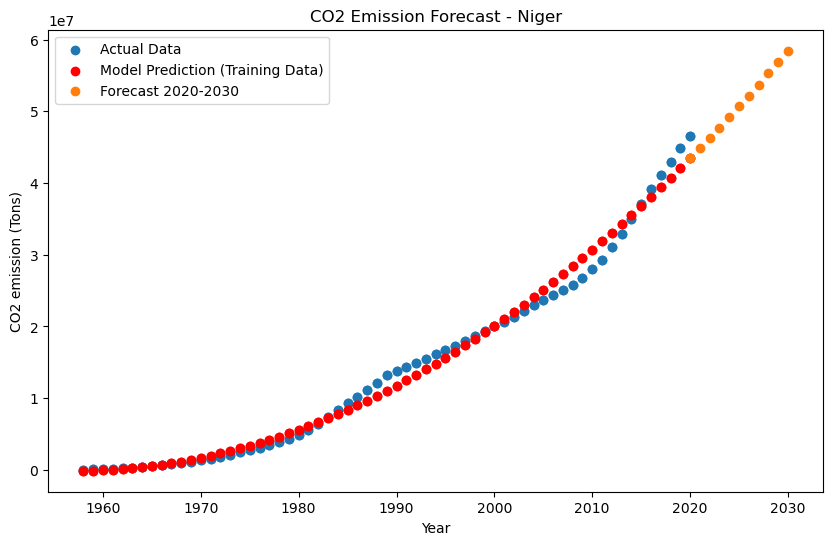

Nigeria Metrics:
Nigeria Predictions (2020-2030):
2020: 3623952550.8901367
2021: 3721718665.4091797
2022: 3820733839.9404297
2023: 3920998074.484375
2024: 4022511369.039551
2025: 4125273723.6083984
2026: 4229285138.1899414
2027: 4334545612.783691
2028: 4441055147.389648
2029: 4548813742.008301
2030: 4657821396.638672


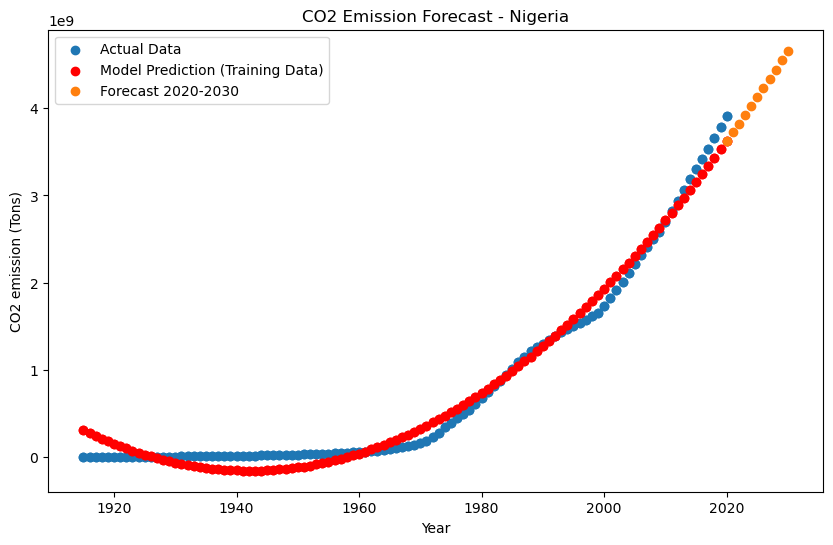

Niue Metrics:
Niue Predictions (2020-2030):
2020: 282676.3722323477
2021: 290510.76945599914
2022: 298432.0191446543
2023: 306440.12129831314
2024: 314535.07591688633
2025: 322716.88300052285
2026: 330985.5425491631
2027: 339341.0545627773
2028: 347783.4190413654
2029: 356312.635984987
2030: 364928.7053935826


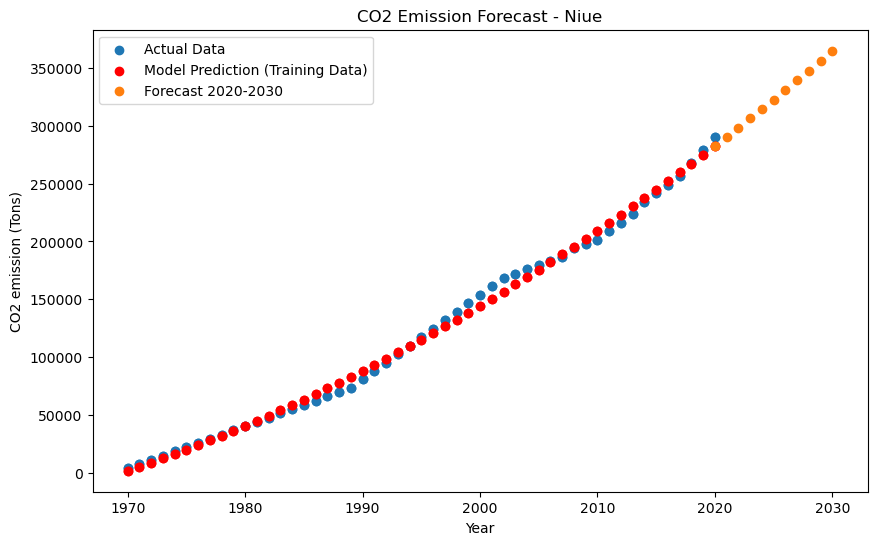

North Korea Metrics:
North Korea Predictions (2020-2030):
2020: 5971288721.526367
2021: 6103258601.377441
2022: 6236636868.113281
2023: 6371423521.735352
2024: 6507618562.241699
2025: 6645221989.633789
2026: 6784233803.910156
2027: 6924654005.072266
2028: 7066482593.119141
2029: 7209719568.05127
2030: 7354364929.868164


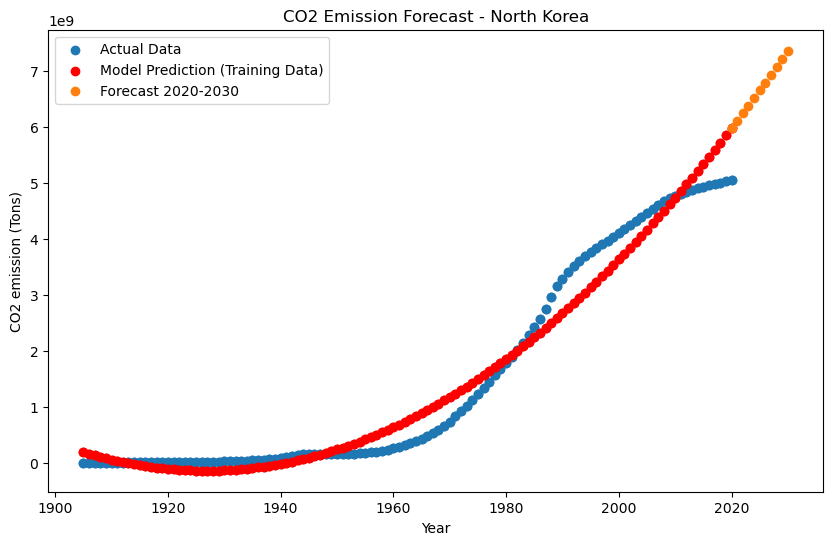

North Macedonia Metrics:
North Macedonia Predictions (2020-2030):
2020: 674964779.3792725
2021: 688859483.5396729
2022: 702890662.2440186
2023: 717058315.4923096
2024: 731362443.2846375
2025: 745803045.6209717
2026: 760380122.5011902
2027: 775093673.9254761
2028: 789943699.8937378
2029: 804930200.4059143
2030: 820053175.4621582


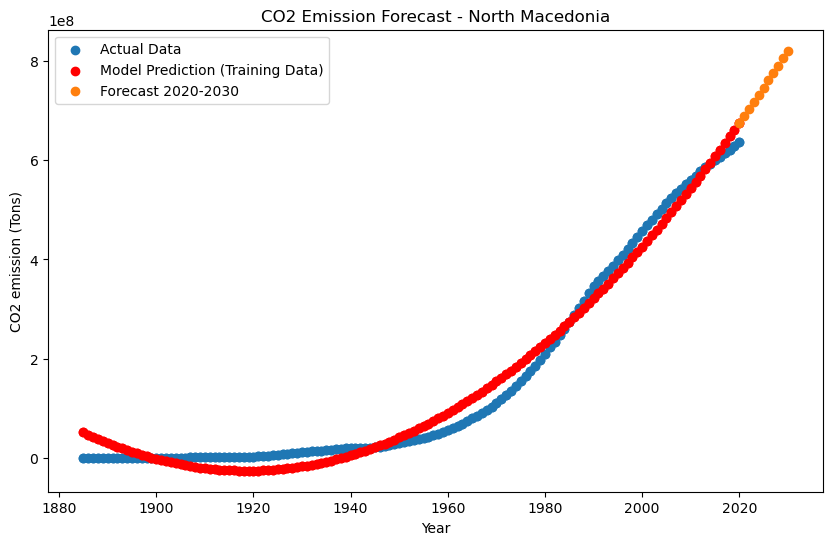

Norway Metrics:
Norway Predictions (2020-2030):
2020: 2366576244.401123
2021: 2401800350.7974243
2022: 2437274970.4746704
2023: 2473000103.4328613
2024: 2508975749.671936
2025: 2545201909.1920776
2026: 2581678581.993225
2027: 2618405768.0753174
2028: 2655383467.4383545
2029: 2692611680.0823975
2030: 2730090406.0073853


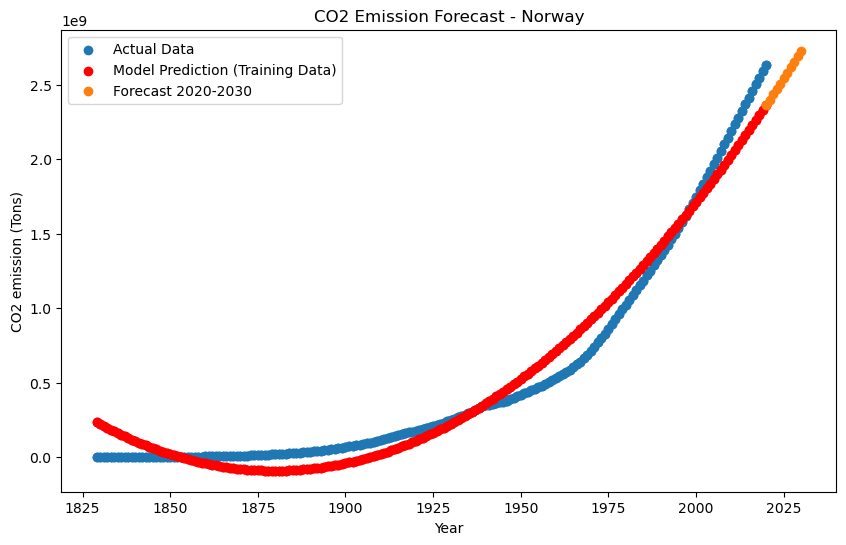

Oman Metrics:
Oman Predictions (2020-2030):
2020: 1162118155.0268555
2021: 1215506593.588379
2022: 1270087118.9106445
2023: 1325859730.9941406
2024: 1382824429.8378906
2025: 1440981215.4423828
2026: 1500330087.8081055
2027: 1560871046.9345703
2028: 1622604092.8203125
2029: 1685529225.4682617
2030: 1749646444.8769531


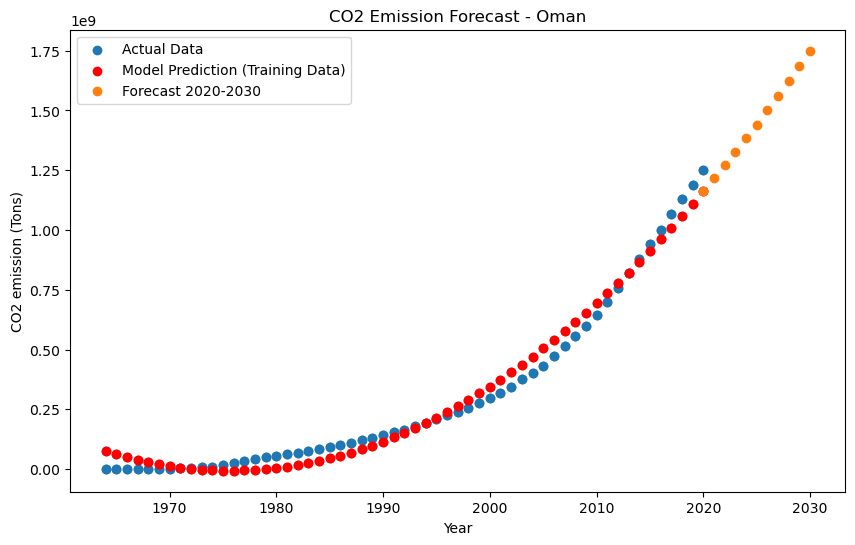

Pakistan Metrics:
Pakistan Predictions (2020-2030):
2020: 4751541914.37793
2021: 4916474233.413086
2022: 5084206480.505859
2023: 5254738655.654297
2024: 5428070758.864258
2025: 5604202790.131836
2026: 5783134749.458008
2027: 5964866636.842773
2028: 6149398452.283203
2029: 6336730195.78418
2030: 6526861867.34375


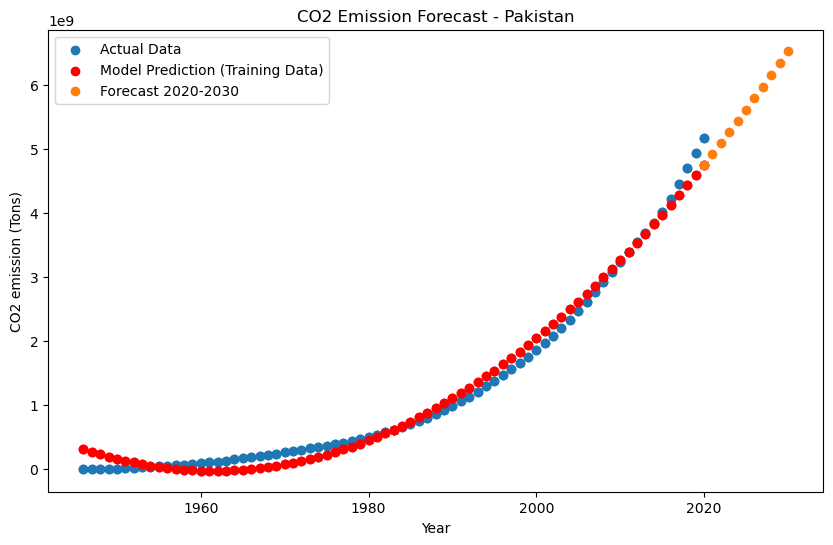

Palau Metrics:
Palau Predictions (2020-2030):
2020: 10851648.903559685
2021: 11119557.355219841
2022: 11390331.92651558
2023: 11663972.61744976
2024: 11940479.42801857
2025: 12219852.358223915
2026: 12502091.408064842
2027: 12787196.577544212
2028: 13075167.86665821
2029: 13366005.275407791
2030: 13659708.803793907


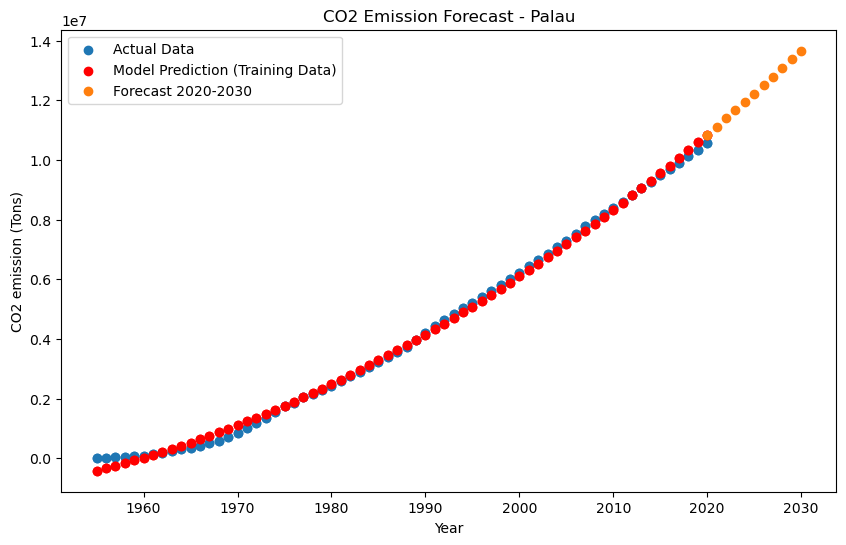

Palestine Metrics:
Palestine Predictions (2020-2030):
2020: 59673500.10592651
2021: 63007576.66116333
2022: 66430876.603637695
2023: 69943399.93338013
2024: 73545146.65039062
2025: 77236116.75473022
2026: 81016310.24630737
2027: 84885727.12515259
2028: 88844367.39126587
2029: 92892231.04470825
2030: 97029318.08538818


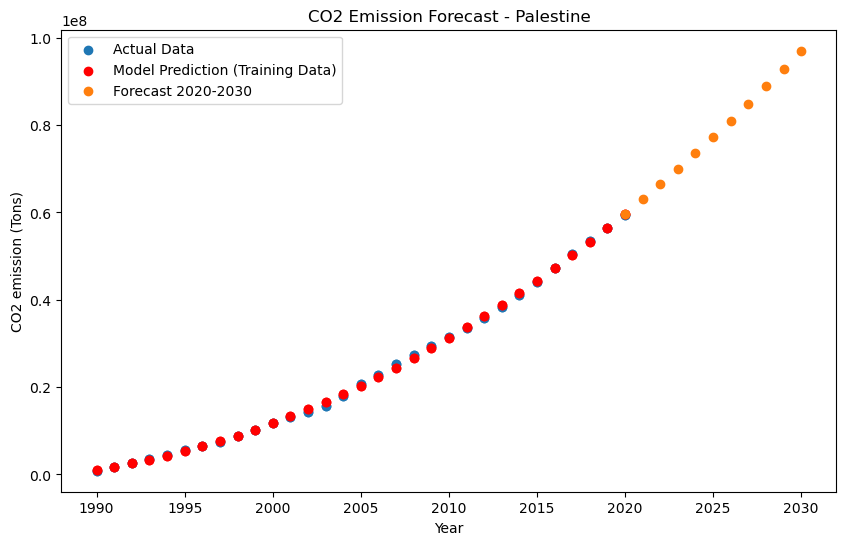

Panama Metrics:
Panama Predictions (2020-2030):
2020: 289153844.4623413
2021: 297977179.97402954
2022: 306935729.4413452
2023: 316029492.86428833
2024: 325258470.24282837
2025: 334622661.57699585
2026: 344122066.8667908
2027: 353756686.1121826
2028: 363526519.3132019
2029: 373431566.4698181
2030: 383471827.5820923


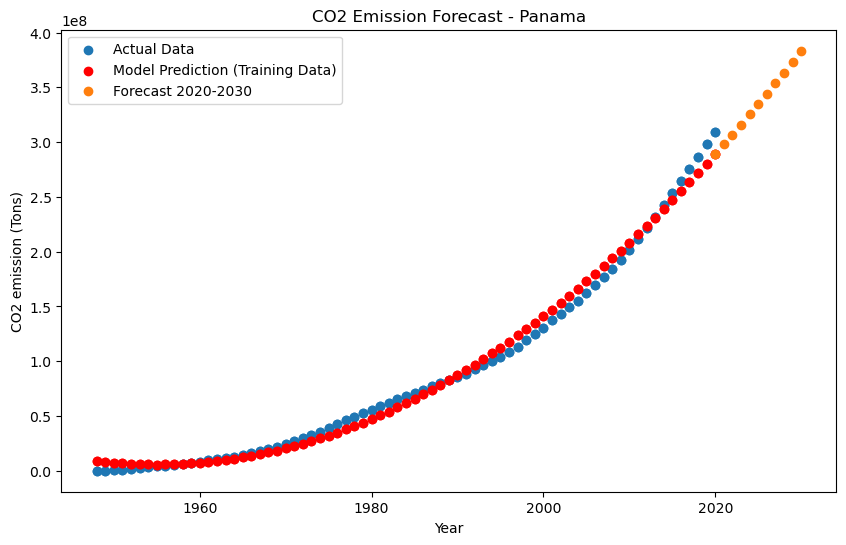

Papua New Guinea Metrics:
Papua New Guinea Predictions (2020-2030):
2020: 160441906.25924683
2021: 165891261.27264404
2022: 171431755.368042
2023: 177063388.5455017
2024: 182786160.8050232
2025: 188600072.1465149
2026: 194505122.5701294
2027: 200501312.0756836
2028: 206588640.6633606
2029: 212767108.33303833
2030: 219036715.08477783


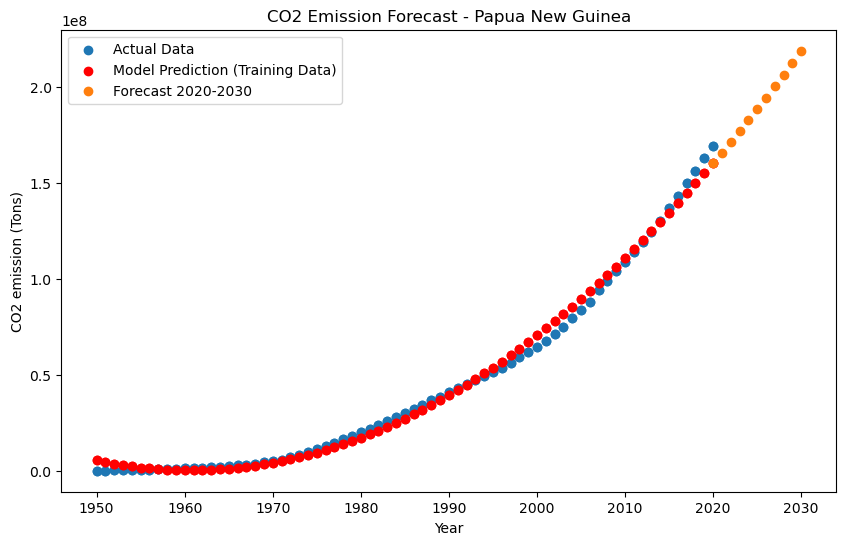

Paraguay Metrics:
Paraguay Predictions (2020-2030):
2020: 166834526.25082397
2021: 172699649.8592224
2022: 178666095.47573853
2023: 184733863.10028076
2024: 190902952.73291016
2025: 197173364.37365723
2026: 203545098.02243042
2027: 210018153.67926025
2028: 216592531.34414673
2029: 223268231.01712036
2030: 230045252.69815063


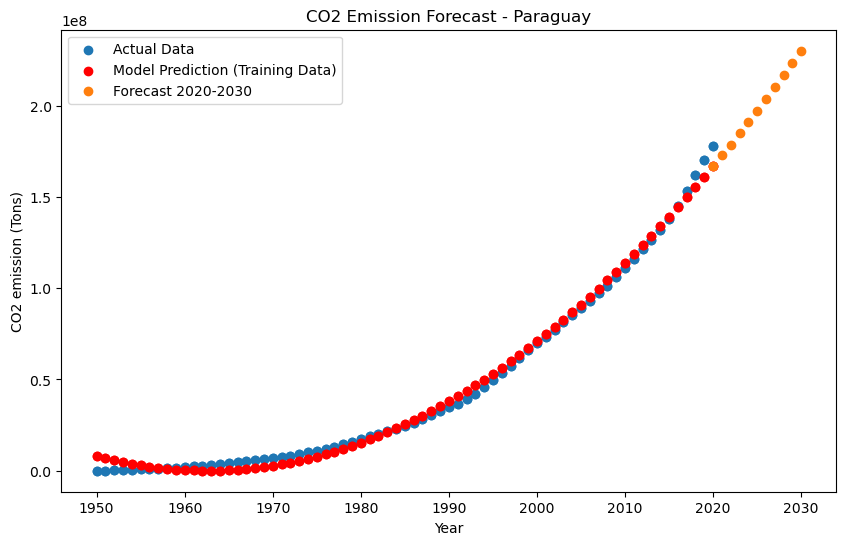

Peru Metrics:
Peru Predictions (2020-2030):
2020: 1737118295.2242432
2021: 1770914591.4854736
2022: 1805030653.045166
2023: 1839466479.9035645
2024: 1874222072.0605469
2025: 1909297429.5159912
2026: 1944692552.2703857
2027: 1980407440.3232422
2028: 2016442093.6749268
2029: 2052796512.3249512
2030: 2089470696.2739258


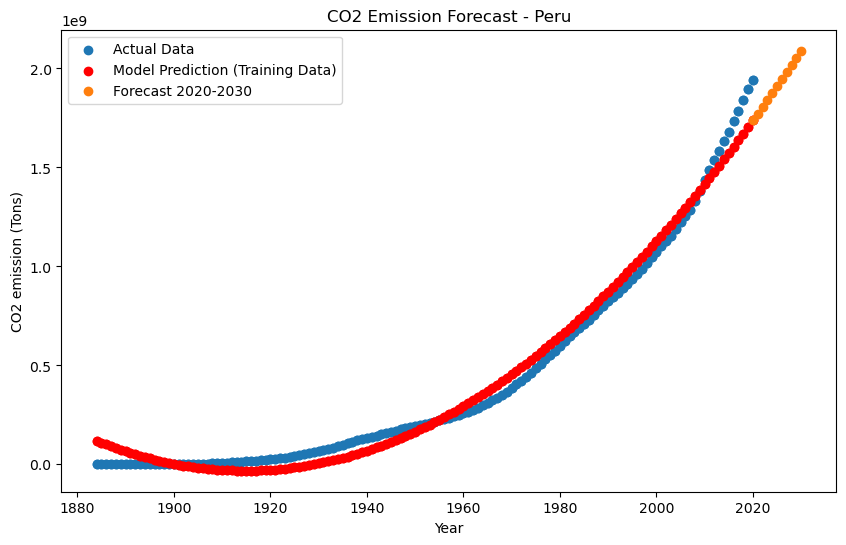

Philippines Metrics:
Philippines Predictions (2020-2030):
2020: 2941290599.386963
2021: 3018140823.305908
2022: 3095930422.5463867
2023: 3174659397.107422
2024: 3254327746.98999
2025: 3334935472.192871
2026: 3416482572.717285
2027: 3498969048.562256
2028: 3582394899.72876
2029: 3666760126.215576
2030: 3752064728.023926


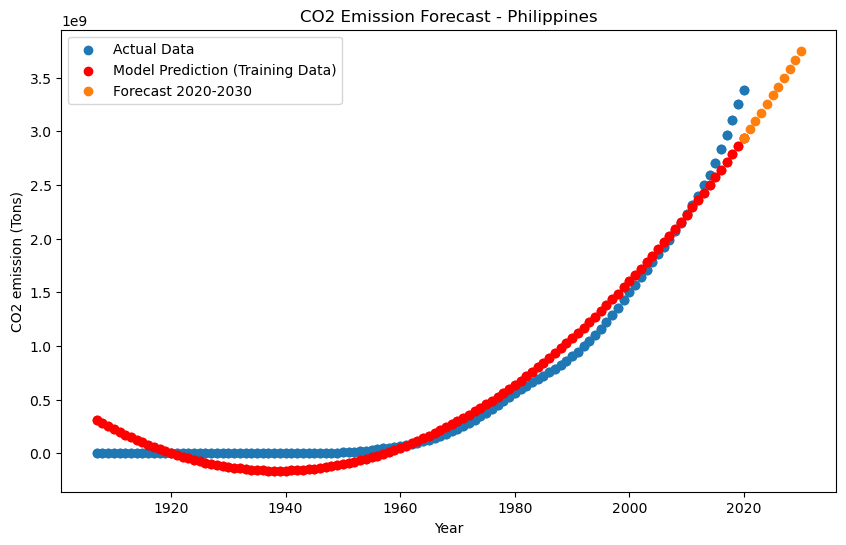

Poland Metrics:
Poland Predictions (2020-2030):
2020: 26397851928.66797
2021: 26741964391.683594
2022: 27088213114.077637
2023: 27436598095.851074
2024: 27787119337.000977
2025: 28139776837.529785
2026: 28494570597.436035
2027: 28851500616.72119
2028: 29210566895.3833
2029: 29571769433.424805
2030: 29935108230.842773


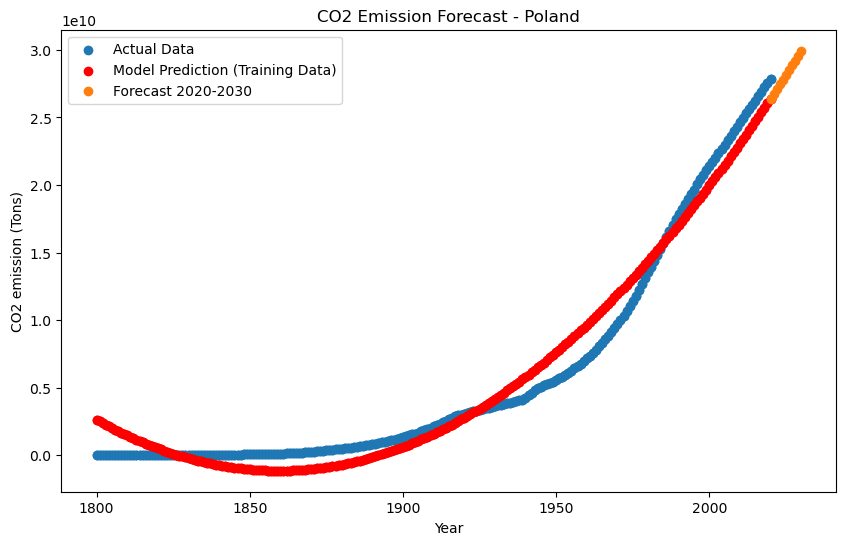

Portugal Metrics:
Portugal Predictions (2020-2030):
2020: 2331022068.816162
2021: 2376411560.2073975
2022: 2422222109.9661865
2023: 2468453718.092407
2024: 2515106384.5860596
2025: 2562180109.4471436
2026: 2609674892.6757812
2027: 2657590734.2718506
2028: 2705927634.235718
2029: 2754685592.5668945
2030: 2803864609.265503


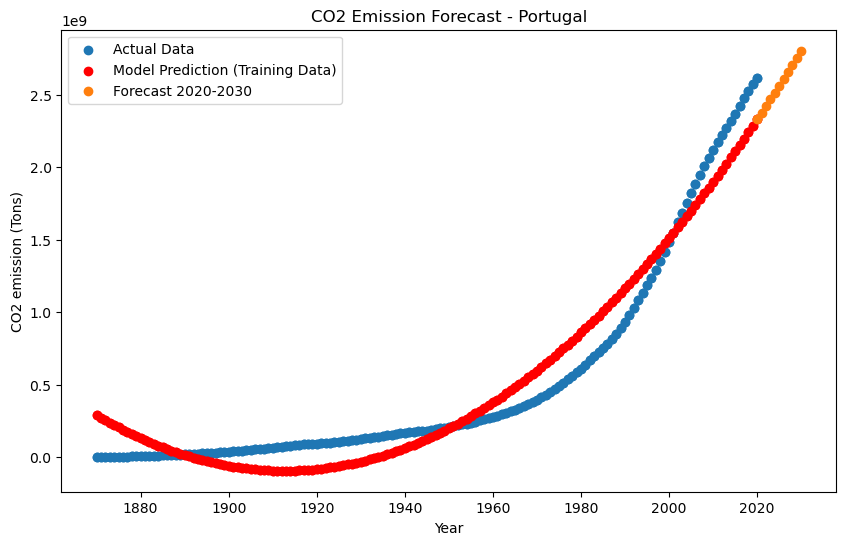

Puerto Rico Metrics:
Puerto Rico Predictions (2020-2030):
2020: 208848.0
2021: 208848.0
2022: 208848.0
2023: 208848.0
2024: 208848.0
2025: 208848.0
2026: 208848.0
2027: 208848.0
2028: 208848.0
2029: 208848.0
2030: 208848.0


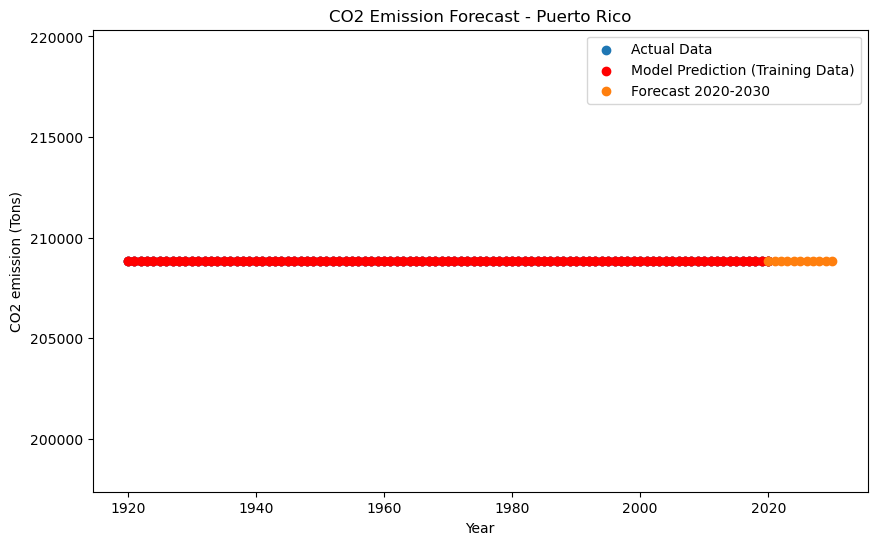

Qatar Metrics:
Qatar Predictions (2020-2030):
2020: 1842213687.465332
2021: 1912317286.9160156
2022: 1983705406.553711
2023: 2056378046.3779297
2024: 2130335206.390625
2025: 2205576886.590332
2026: 2282103086.976074
2027: 2359913807.550293
2028: 2439009048.3115234
2029: 2519388809.2592773
2030: 2601053090.3950195


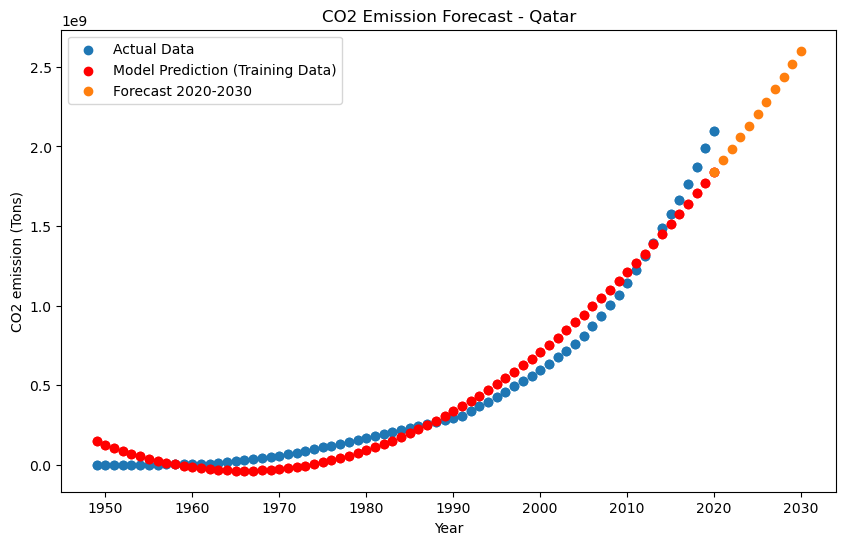

Reunion Metrics:
Reunion Predictions (2020-2030):
2020: 119818537.88052368
2021: 124401907.11386108
2022: 129069468.43612671
2023: 133821221.84729004
2024: 138657167.34747314
2025: 143577304.936615
2026: 148581634.61465454
2027: 153670156.38168335
2028: 158842870.23770142
2029: 164099776.1826477
2030: 169440874.2164917


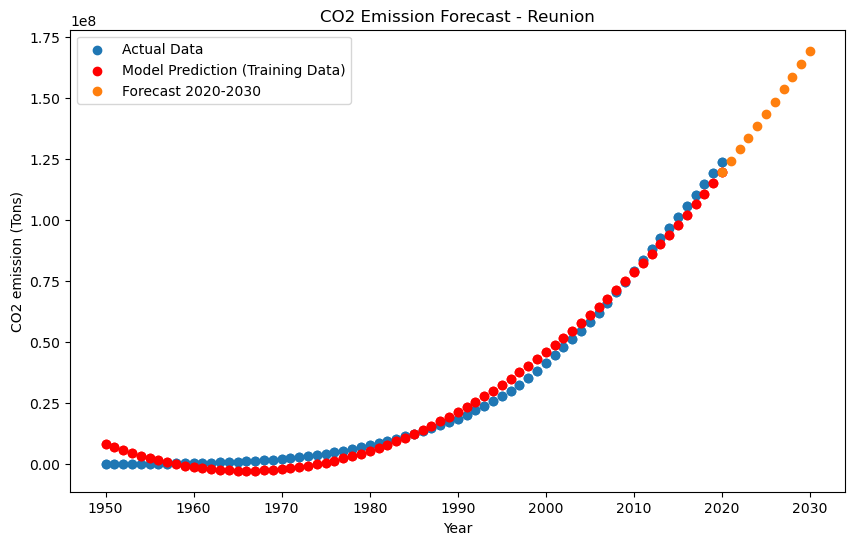

Romania Metrics:
Romania Predictions (2020-2030):
2020: 9108575452.30127
2021: 9270233738.898438
2022: 9433248665.071777
2023: 9597620230.822754
2024: 9763348436.149414
2025: 9930433281.052246
2026: 10098874765.532715
2027: 10268672889.588379
2028: 10439827653.220703
2029: 10612339056.430664
2030: 10786207099.21582


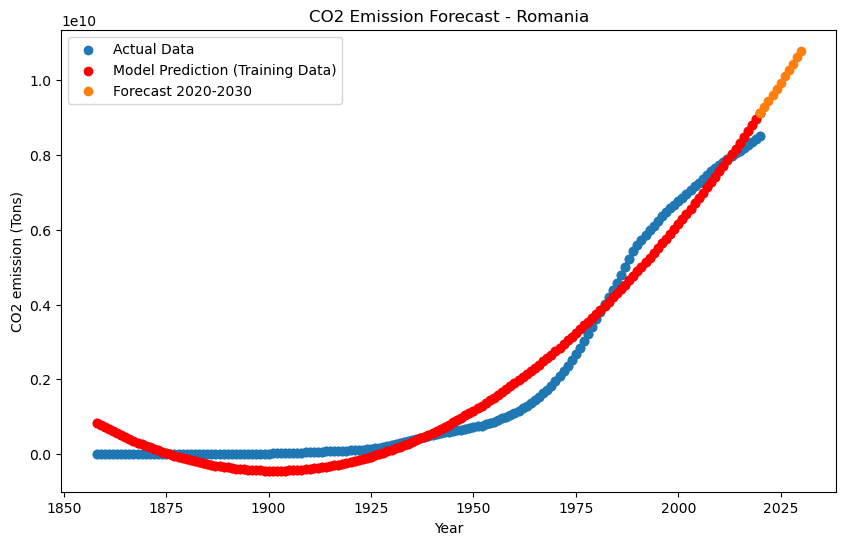

Russia Metrics:
Russia Predictions (2020-2030):
2020: 105687205400.2461
2021: 107413313848.23438
2022: 109152439023.59766
2023: 110904580926.35156
2024: 112669739556.48047
2025: 114447914913.9961
2026: 116239106998.89844
2027: 118043315811.1836
2028: 119860541350.85547
2029: 121690783617.90625
2030: 123534042612.33594


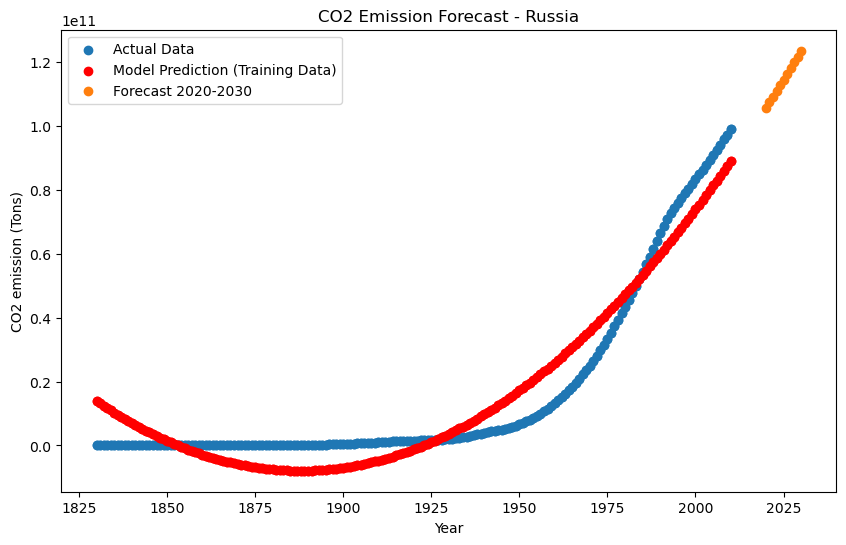

Rwanda Metrics:
Rwanda Predictions (2020-2030):
2020: 28029573.78007126
2021: 28896922.83308029
2022: 29777395.66112137
2023: 30670992.264175415
2024: 31577712.64225006
2025: 32497556.79534912
2026: 33430524.72347641
2027: 34376616.42662048
2028: 35335831.90478897
2029: 36308171.15798569
2030: 37293634.18619537


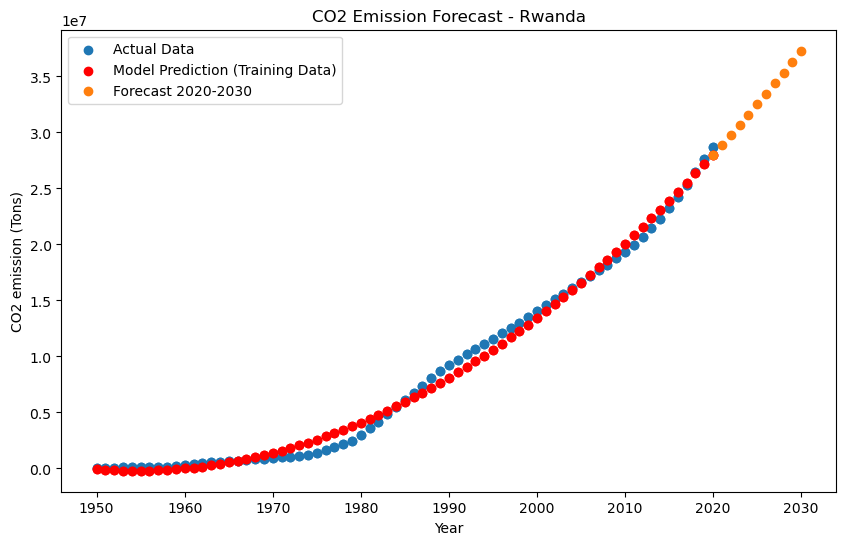

Saint Helena Metrics:
Saint Helena Predictions (2020-2030):
2020: 401508.3502972126
2021: 417433.94100773335
2022: 433664.7299696207
2023: 450200.7171831131
2024: 467041.90264844894
2025: 484188.2863651514
2026: 501639.8683334589
2027: 519396.64855337143
2028: 537458.6270252466
2029: 555825.8037483692
2030: 574498.178723216


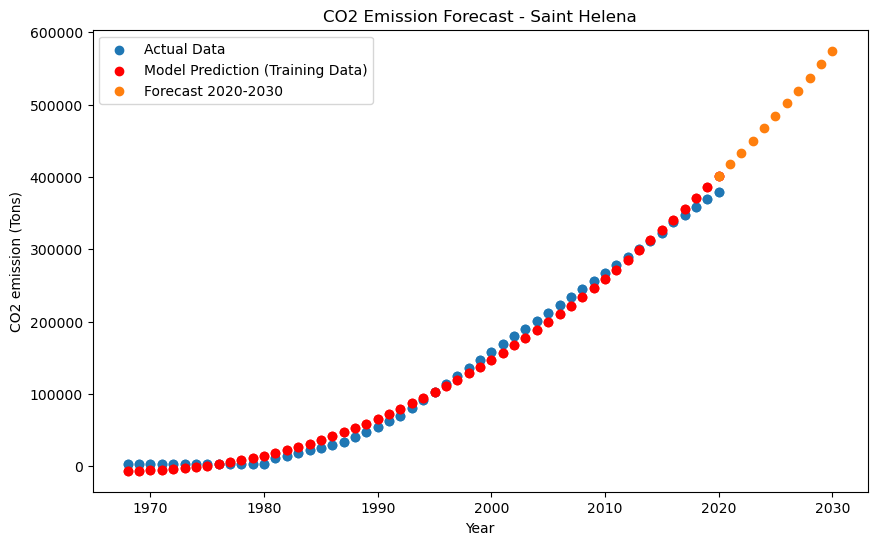

Saint Kitts and Nevis Metrics:
Saint Kitts and Nevis Predictions (2020-2030):
2020: 6496097.252620697
2021: 6785259.9396858215
2022: 7080560.386766434
2023: 7381998.593864441
2024: 7689574.5609874725
2025: 8003288.2881240845
2026: 8323139.775279999
2027: 8649129.022460938
2028: 8981256.029655457
2029: 9319520.796869278
2030: 9663923.324106216


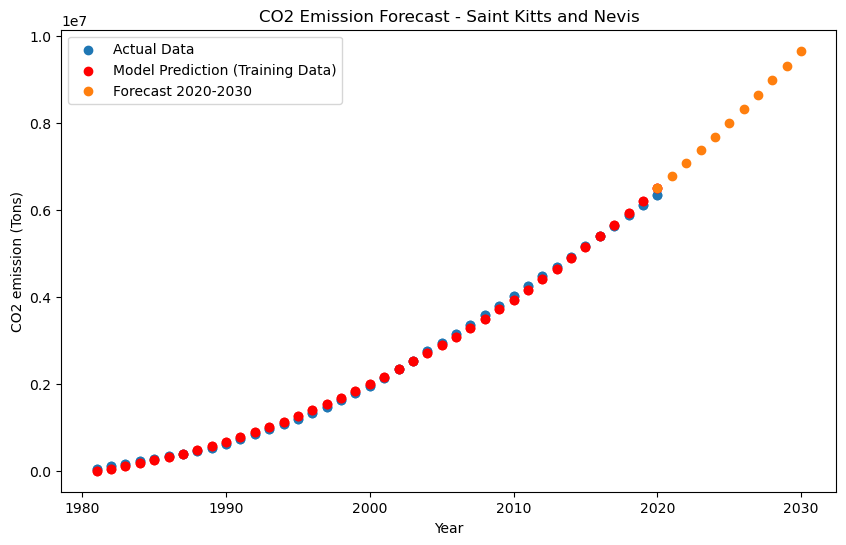

Saint Lucia Metrics:
Saint Lucia Predictions (2020-2030):
2020: 14064787.537776947
2021: 14572721.210861206
2022: 15089602.920074463
2023: 15615432.665428162
2024: 16150210.446933746
2025: 16693936.264568329
2026: 17246610.118343353
2027: 17808232.00826645
2028: 18378801.934322357
2029: 18958319.896522522
2030: 19546785.894866943


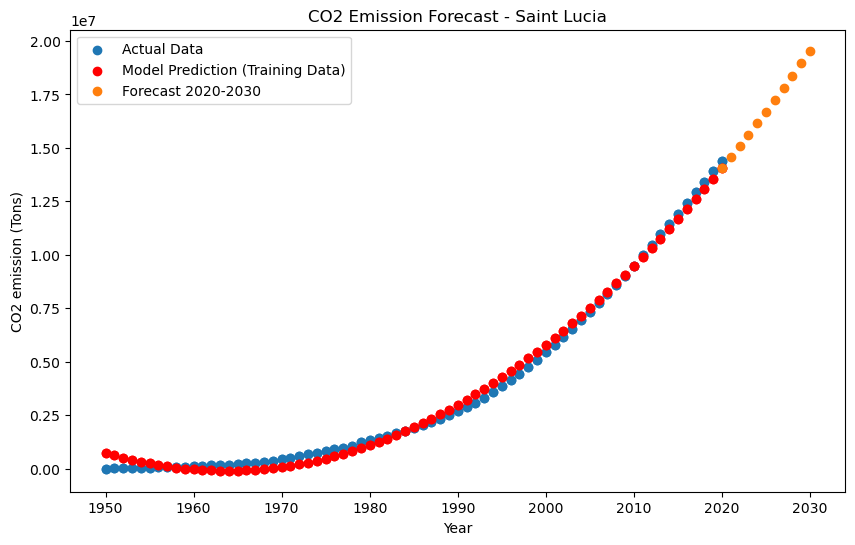

Saint Pierre and Miquelon Metrics:
Saint Pierre and Miquelon Predictions (2020-2030):
2020: 3763310.50730443
2021: 3839937.529530287
2022: 3917210.830028534
2023: 3995130.4088008404
2024: 4073696.265846014
2025: 4152908.4011638165
2026: 4232766.81475544
2027: 4313271.506620407
2028: 4394422.476758242
2029: 4476219.725168943
2030: 4558663.251853228


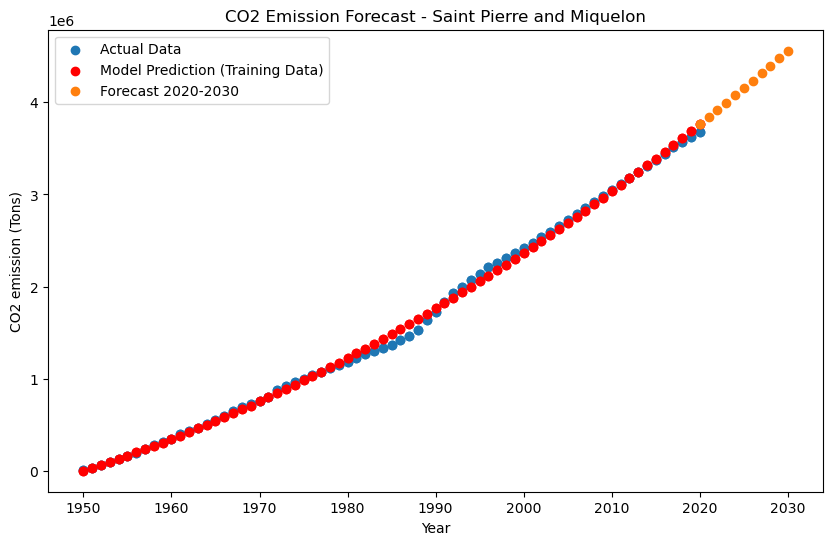

Saint Vincent and the Grenadines Metrics:
Saint Vincent and the Grenadines Predictions (2020-2030):
2020: 6827615.5729961395
2021: 7077535.544147491
2022: 7331924.625537872
2023: 7590782.817165375
2024: 7854110.119031906
2025: 8121906.531137466
2026: 8394172.053482056
2027: 8670906.686063766
2028: 8952110.428884506
2029: 9237783.281944275
2030: 9527925.245243073


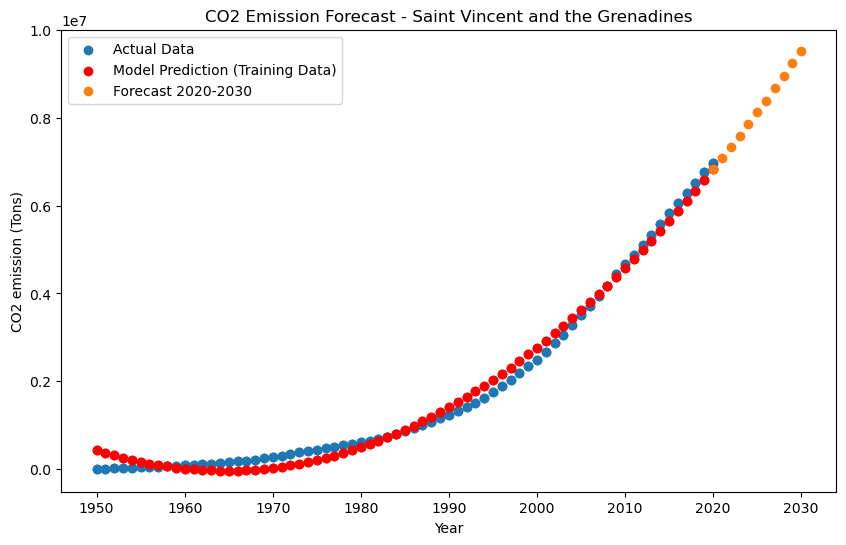

Samoa Metrics:
Samoa Predictions (2020-2030):
2020: 6555567.580712318
2021: 6768716.861670494
2022: 6985311.205605507
2023: 7205350.612518311
2024: 7428835.082406998
2025: 7655764.615271568
2026: 7886139.211114883
2027: 8119958.869935036
2028: 8357223.591732979
2029: 8597933.376506805
2030: 8842088.224258423


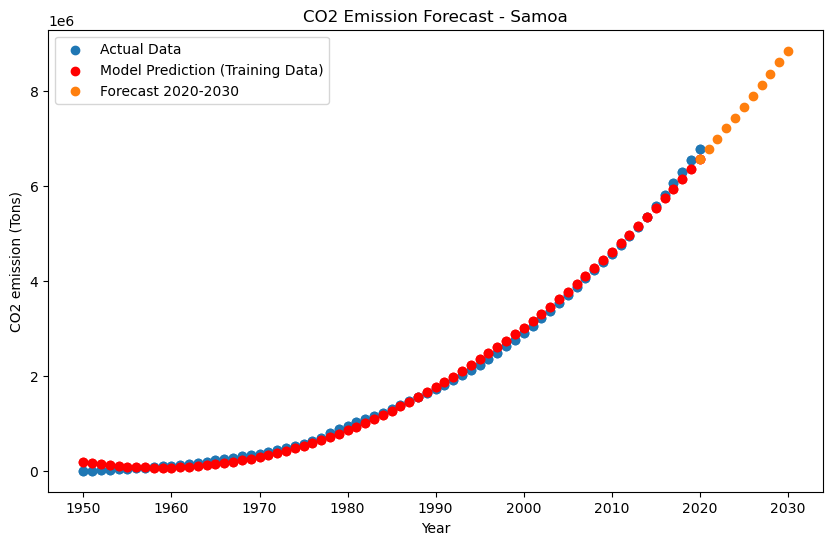

Sao Tome and Principe Metrics:
Sao Tome and Principe Predictions (2020-2030):
2020: 3191721.924888134
2021: 3295641.331902504
2022: 3401247.4024658203
2023: 3508540.1365790367
2024: 3617519.534242153
2025: 3728185.5954561234
2026: 3840538.32021904
2027: 3954577.7085323334
2028: 4070303.76039505
2029: 4187716.475807667
2030: 4306815.854771614


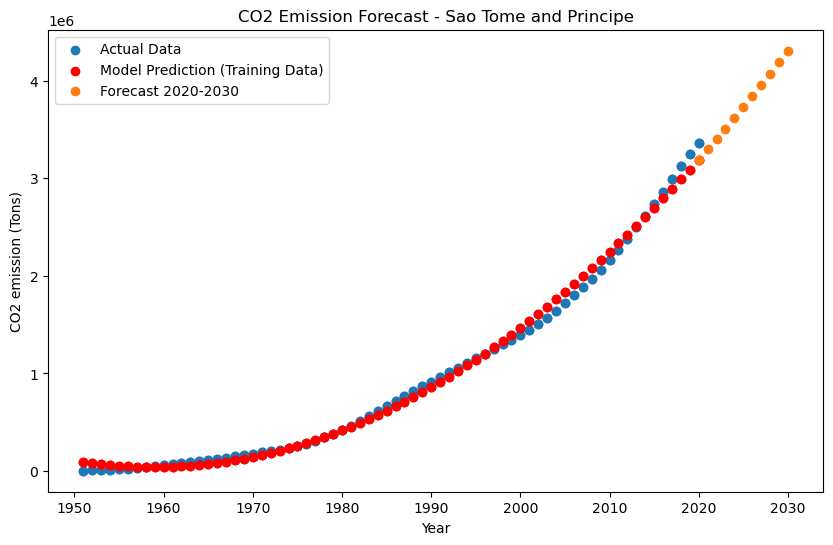

Saudi Arabia Metrics:
Saudi Arabia Predictions (2020-2030):
2020: 14597604298.94336
2021: 15082697823.457031
2022: 15575455740.083984
2023: 16075878048.822266
2024: 16583964749.673828
2025: 17099715842.636719
2026: 17623131327.71289
2027: 18154211204.90039
2028: 18692955474.20117
2029: 19239364135.615234
2030: 19793437189.140625


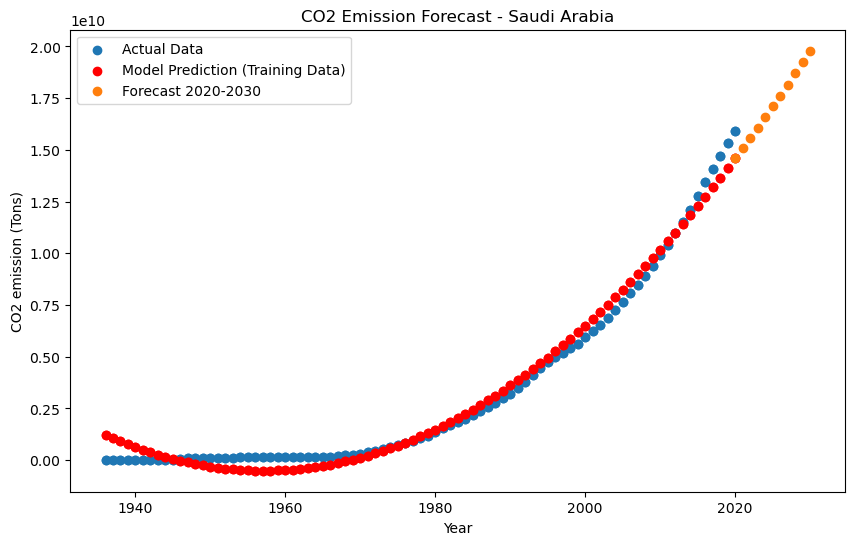

Senegal Metrics:
Senegal Predictions (2020-2030):
2020: 224873807.50299072
2021: 232339978.5451355
2022: 239931026.24874878
2023: 247646950.613739
2024: 255487751.64007568
2025: 263453429.32788086
2026: 271543983.6770325
2027: 279759414.6876526
2028: 288099722.35961914
2029: 296564906.6930237
2030: 305154967.6878662


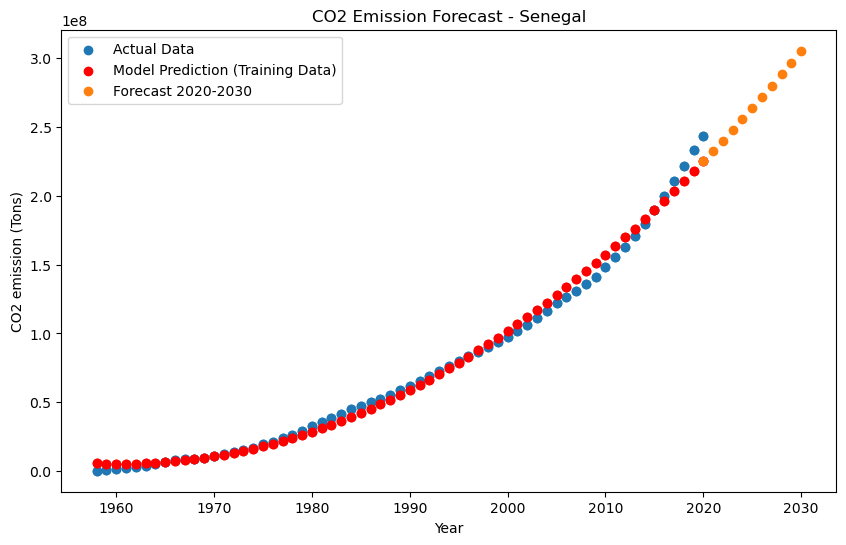

Serbia Metrics:
Serbia Predictions (2020-2030):
2020: 2750700188.246826
2021: 2808153526.8516846
2022: 2866177652.9263916
2023: 2924772566.470703
2024: 2983938267.484741
2025: 3043674755.968994
2026: 3103982031.9224854
2027: 3164860095.345703
2028: 3226308946.2386475
2029: 3288328584.6013184
2030: 3350919010.433838


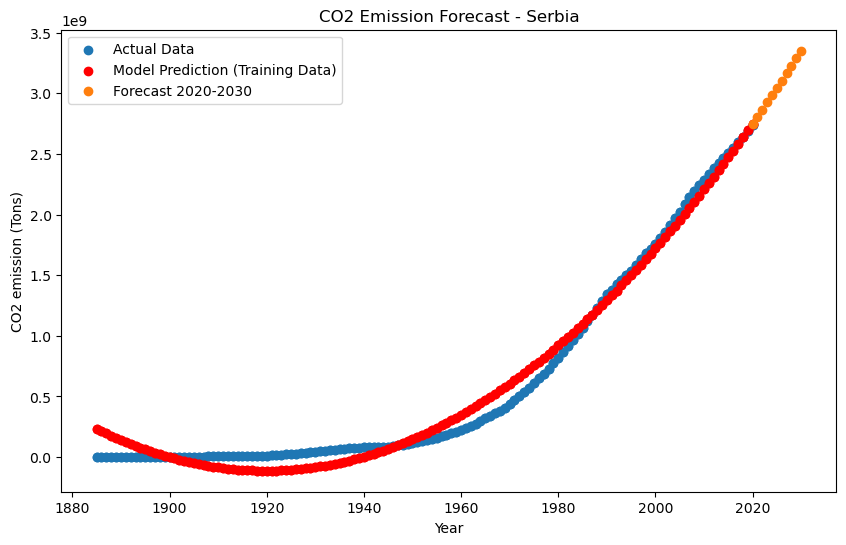

Seychelles Metrics:
Seychelles Predictions (2020-2030):
2020: 13168313.82049942
2021: 13697455.402187347
2022: 14237068.512298584
2023: 14787153.150848389
2024: 15347709.317836761
2025: 15918737.013263702
2026: 16500236.237121582
2027: 17092206.98941803
2028: 17694649.270153046
2029: 18307563.079319
2030: 18930948.416923523


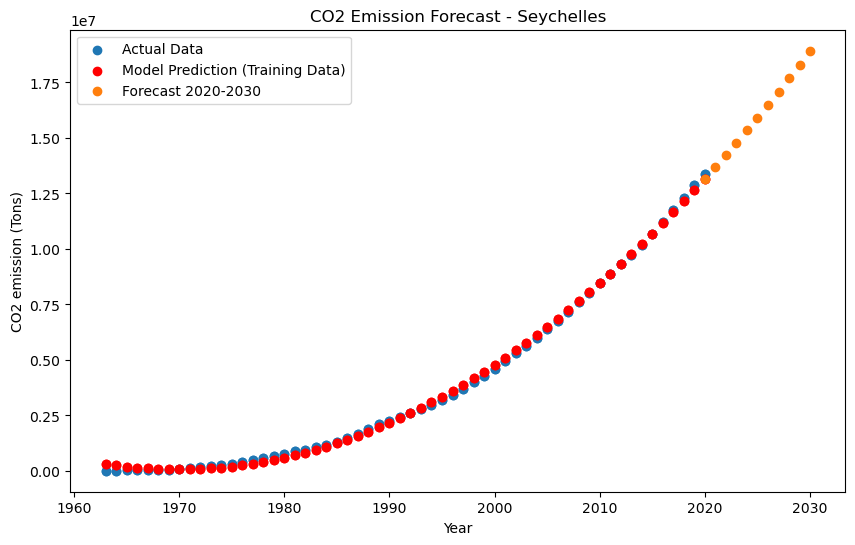

Sierra Leone Metrics:
Sierra Leone Predictions (2020-2030):
2020: 34124325.402727604
2021: 34712130.02207899
2022: 35302229.12586212
2023: 35894622.714076996
2024: 36489310.78672266
2025: 37086293.343800545
2026: 37685570.38531017
2027: 38287141.911250114
2028: 38891007.92162275
2029: 39497168.416425705
2030: 40105623.395661354


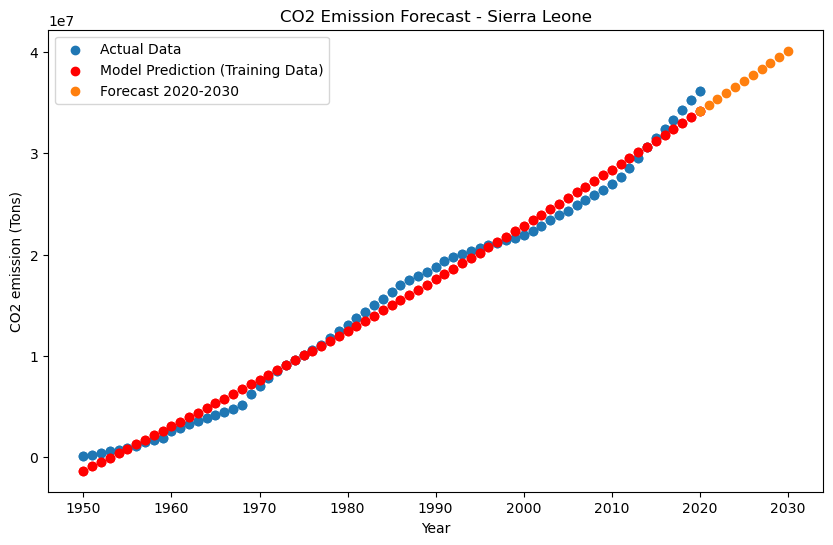

Singapore Metrics:
Singapore Predictions (2020-2030):
2020: 2272937521.218994
2021: 2341910291.451172
2022: 2411907250.952881
2023: 2482928399.7233887
2024: 2554973737.7631836
2025: 2628043265.0720215
2026: 2702136981.6503906
2027: 2777254887.4978027
2028: 2853396982.61499
2029: 2930563267.0009766
2030: 3008753740.65625


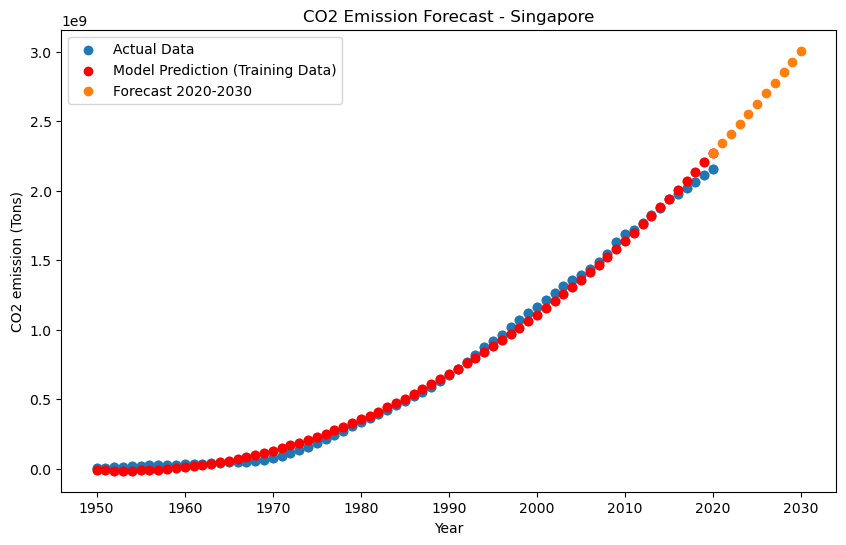

Sint Maarten (Dutch part) Metrics:
Sint Maarten (Dutch part) Predictions (2020-2030):
2020: 70322623.24503326
2021: 71096888.70827389
2022: 71869992.56810713
2023: 72641934.82453203
2024: 73412715.47754955
2025: 74182334.52715921
2026: 74950791.97336102
2027: 75718087.816154
2028: 76484222.05554008
2029: 77249194.6915183
2030: 78013005.72408867


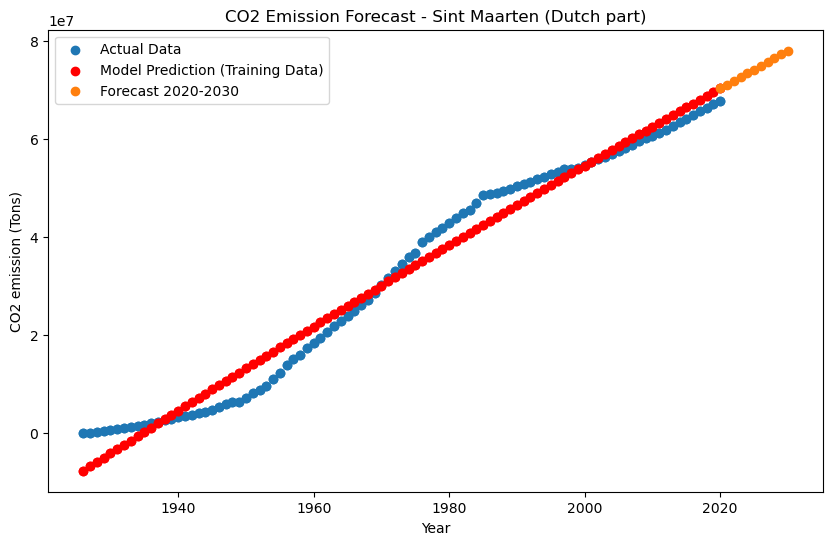

Slovakia Metrics:
Slovakia Predictions (2020-2030):
2020: 4048812388.815796
2021: 4106857985.3997803
2022: 4165321109.2197266
2023: 4224201760.275635
2024: 4283499938.567627
2025: 4343215644.095703
2026: 4403348876.859863
2027: 4463899636.859985
2028: 4524867924.096191
2029: 4586253738.568359
2030: 4648057080.276733


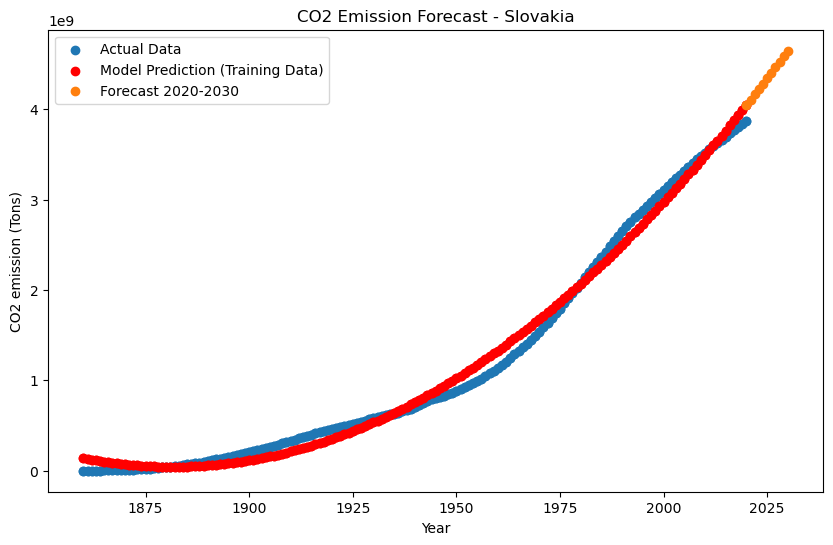

Slovenia Metrics:
Slovenia Predictions (2020-2030):
2020: 845928210.9837036
2021: 863880468.1916504
2022: 882013161.7203369
2023: 900326291.5695801
2024: 918819857.7393188
2025: 937493860.2297974
2026: 956348299.0408936
2027: 975383174.1725464
2028: 994598485.6247559
2029: 1013994233.397583
2030: 1033570417.4910889


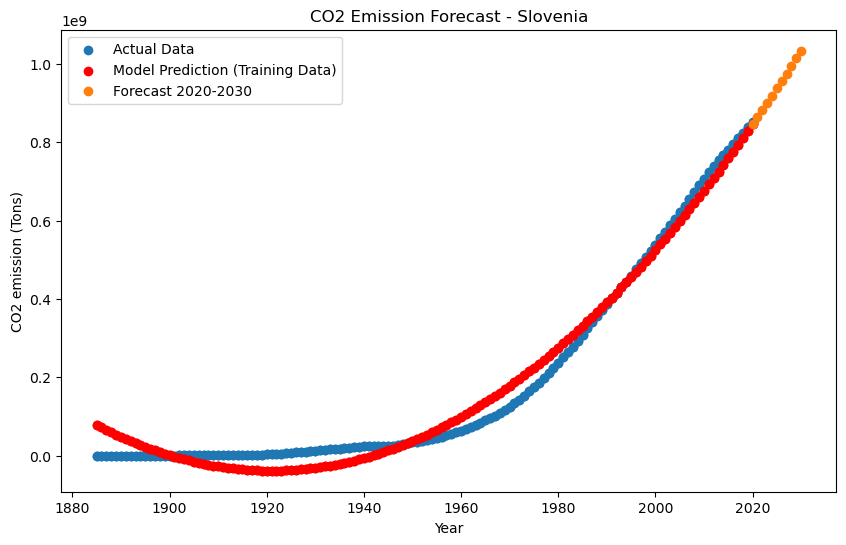

Solomon Islands Metrics:
Solomon Islands Predictions (2020-2030):
2020: 10522250.354143143
2021: 10883538.1963768
2022: 11250930.035215378
2023: 11624425.870664597
2024: 12004025.70272255
2025: 12389729.531393051
2026: 12781537.356674194
2027: 13179449.178564072
2028: 13583464.997062683
2029: 13993584.812171936
2030: 14409808.62389183


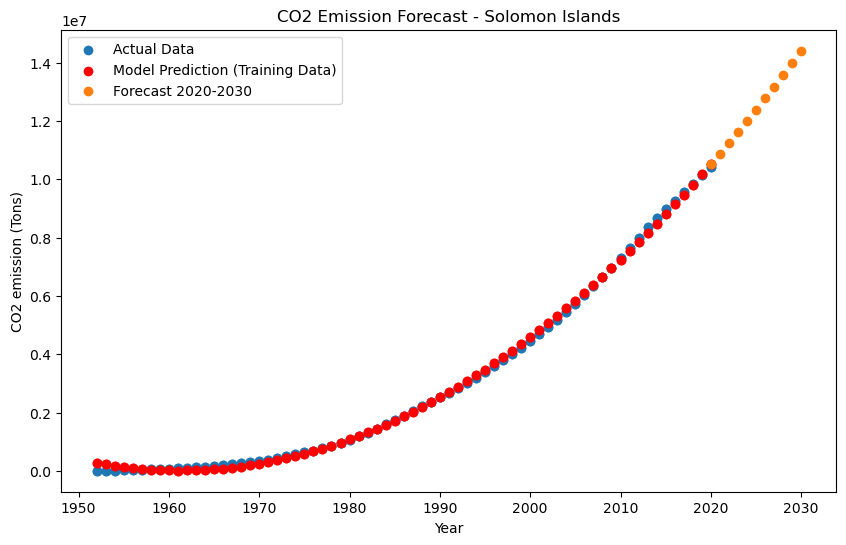

Somalia Metrics:
Somalia Predictions (2020-2030):
2020: 34862913.18173599
2021: 35739909.29539108
2022: 36626911.35474396
2023: 37523919.35979843
2024: 38430933.31054306
2025: 39347953.20699692
2026: 40274979.04914856
2027: 41212010.8370018
2028: 42159048.570552826
2029: 43116092.24980545
2030: 44083141.87474823


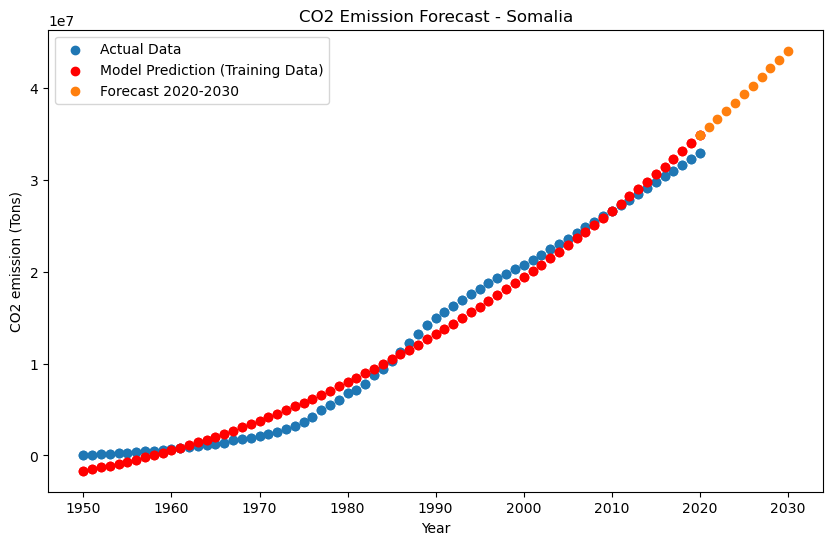

South Africa Metrics:
South Africa Predictions (2020-2030):
2020: 19583703988.220703
2021: 19985466017.44336
2022: 20391182333.539062
2023: 20800852936.50879
2024: 21214477826.353516
2025: 21632057003.072266
2026: 22053590466.66797
2027: 22479078217.135742
2028: 22908520254.478516
2029: 23341916578.69629
2030: 23779267189.78711


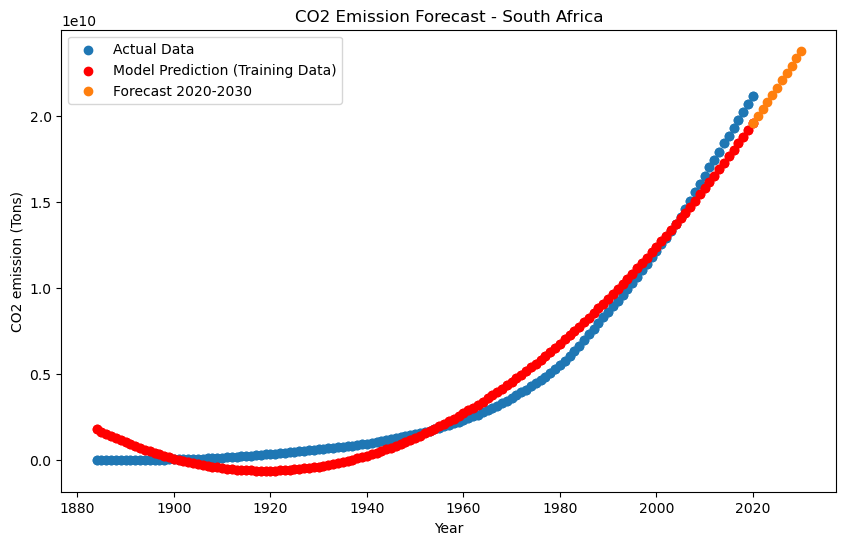

South Korea Metrics:
South Korea Predictions (2020-2030):
2020: 15390919707.863281
2021: 15822615551.455078
2022: 16259800311.310547
2023: 16702473987.427734
2024: 17150636579.8125
2025: 17604288088.46289
2026: 18063428513.371094
2027: 18528057854.55078
2028: 18998176111.992188
2029: 19473783285.69922
2030: 19954879375.666016


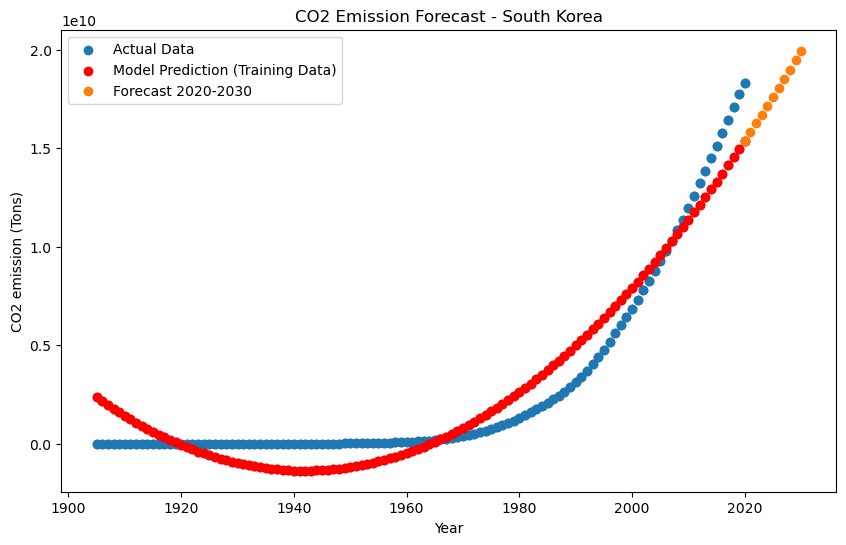

South Sudan Metrics:
South Sudan Predictions (2020-2030):
2020: 34957245.44390488
2021: 36068667.49947357
2022: 37198000.06233215
2023: 38345243.132507324
2024: 39510396.70998764
2025: 40693460.7947731
2026: 41894435.38685608
2027: 43113320.48624802
2028: 44350116.092926025
2029: 45604822.206920624
2030: 46877438.82822037


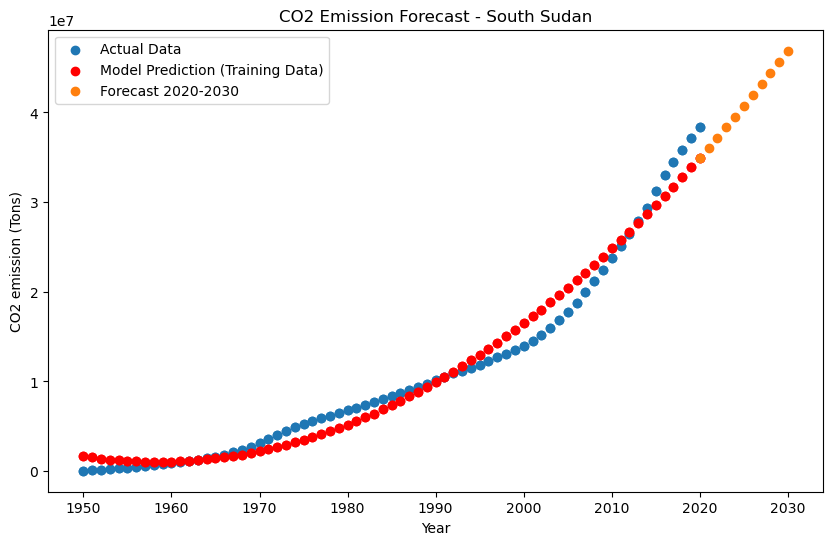

Spain Metrics:
Spain Predictions (2020-2030):
2020: 12541865262.53711
2021: 12747992483.535156
2022: 12955687875.2417
2023: 13164951437.658203
2024: 13375783170.783691
2025: 13588183074.61914
2026: 13802151149.163574
2027: 14017687394.417969
2028: 14234791810.381836
2029: 14453464397.0542
2030: 14673705154.437012


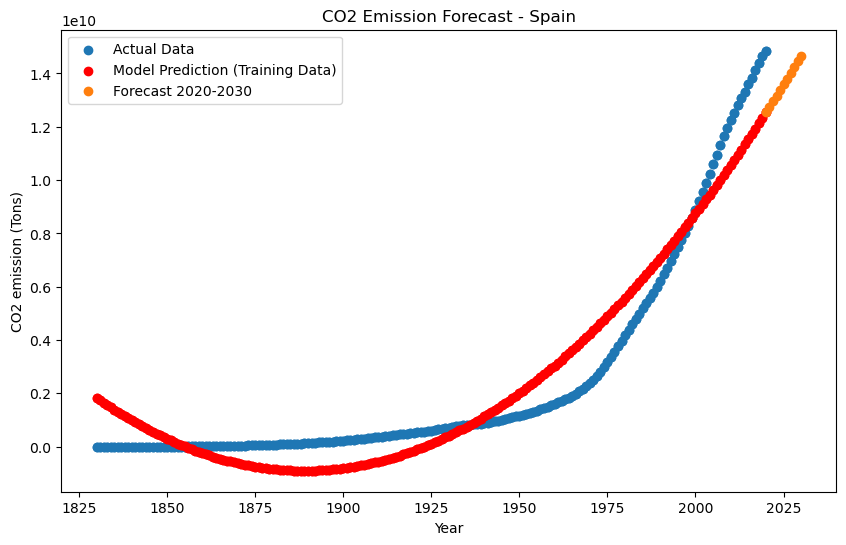

Sri Lanka Metrics:
Sri Lanka Predictions (2020-2030):
2020: 450597275.69555664
2021: 465021450.29504395
2022: 479682738.89398193
2023: 494581141.49212646
2024: 509716658.0897217
2025: 525089288.6867676
2026: 540699033.28302
2027: 556545891.8787842
2028: 572629864.4737549
2029: 588950951.0682373
2030: 605509151.6621094


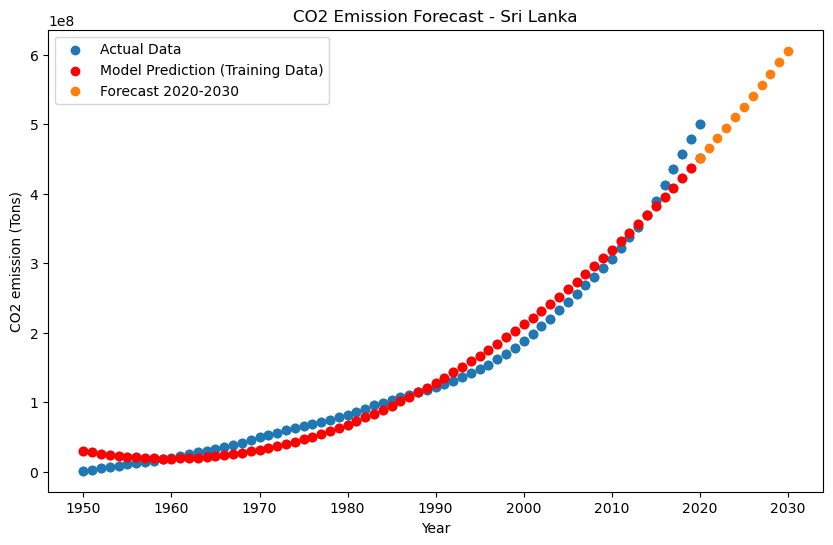

Sudan Metrics:
Sudan Predictions (2020-2030):
2020: 391040363.9800415
2021: 403636545.97094727
2022: 416438366.85821533
2023: 429445826.64160156
2024: 442658925.32141113
2025: 456077662.897583
2026: 469702039.3699951
2027: 483532054.73864746
2028: 497567709.0036621
2029: 511809002.16503906
2030: 526255934.2225952


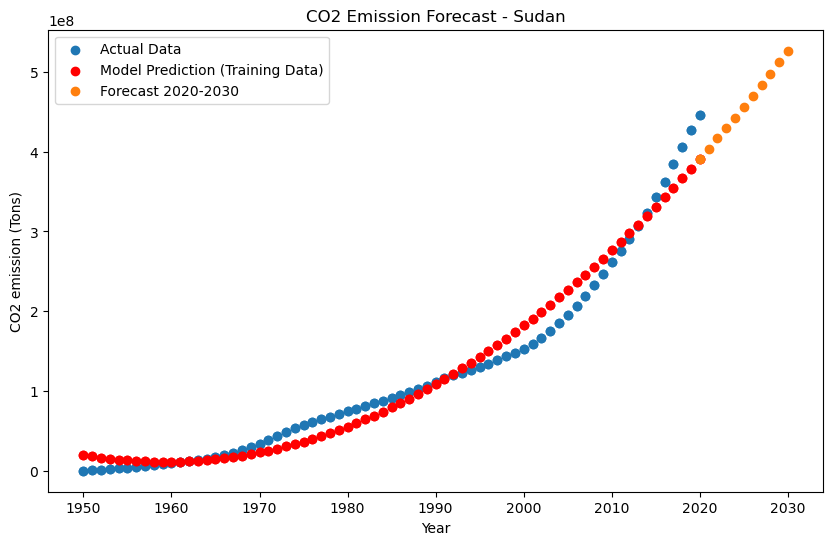

Suriname Metrics:
Suriname Predictions (2020-2030):
2020: 116626337.22184753
2021: 119257616.20857239
2022: 121914064.52074432
2023: 124595682.15834808
2024: 127302469.12138367
2025: 130034425.40986633
2026: 132791551.02379608
2027: 135573845.96316528
2028: 138381310.22795868
2029: 141213943.8182068
2030: 144071746.73389435


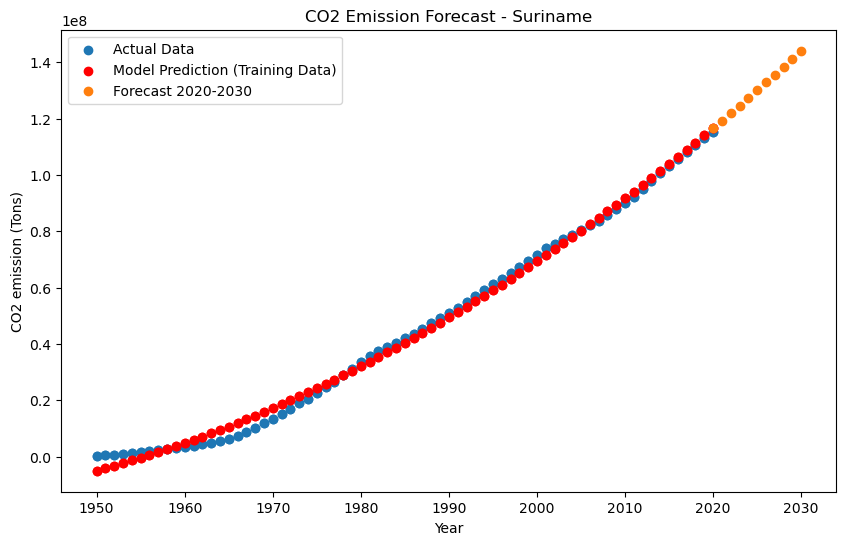

Sweden Metrics:
Sweden Predictions (2020-2030):
2020: 5230638194.809204
2021: 5306095566.245728
2022: 5382079281.308716
2023: 5458589339.998535
2024: 5535625742.314819
2025: 5613188488.25769
2026: 5691277577.827515
2027: 5769893011.023682
2028: 5849034787.846802
2029: 5928702908.296387
2030: 6008897372.372803


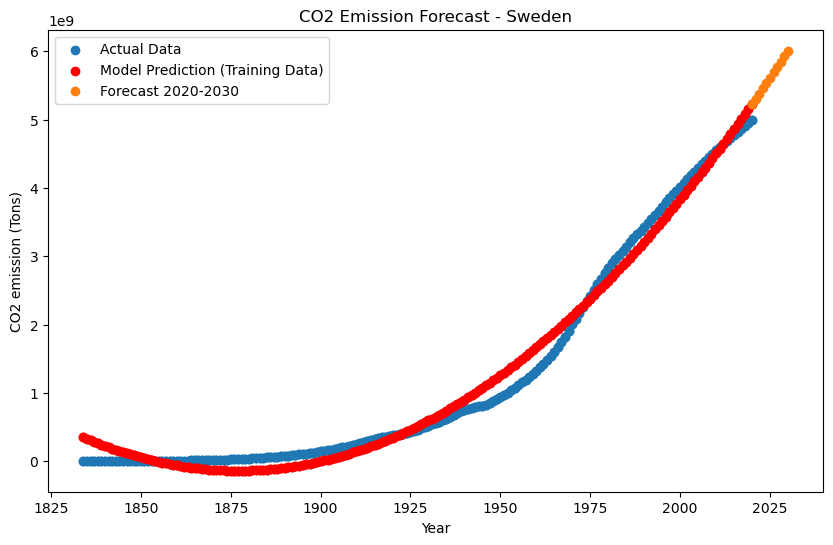

Switzerland Metrics:
Switzerland Predictions (2020-2030):
2020: 3001781735.8060303
2021: 3049637507.2147217
2022: 3097868321.9069824
2023: 3146474179.8826904
2024: 3195455081.14209
2025: 3244811025.6851807
2026: 3294542013.511841
2027: 3344648044.6221924
2028: 3395129119.015991
2029: 3445985236.6934814
2030: 3497216397.654297


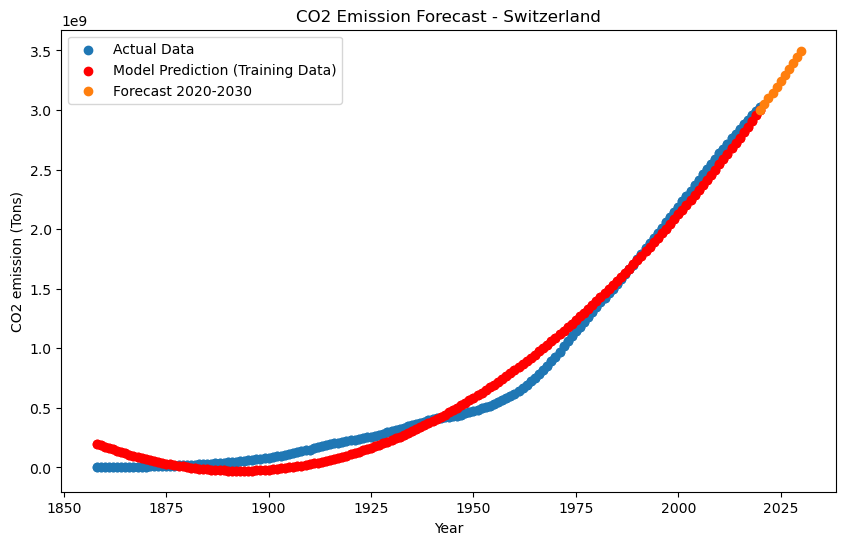

Syria Metrics:
Syria Predictions (2020-2030):
2020: 1981569918.3327637
2021: 2042541014.7861328
2022: 2104404855.5703125
2023: 2167161440.6848145
2024: 2230810770.130127
2025: 2295352843.906006
2026: 2360787662.012451
2027: 2427115224.4501953
2028: 2494335531.2180176
2029: 2562448582.3166504
2030: 2631454377.7458496


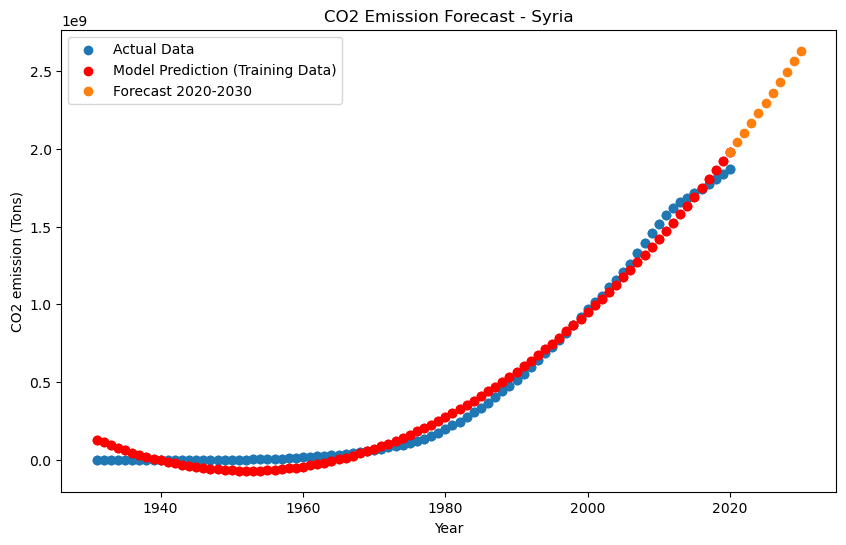

Taiwan Metrics:
Taiwan Predictions (2020-2030):
2020: 7611572874.277832
2021: 7805433967.585449
2022: 8001560084.092773
2023: 8199951223.802734
2024: 8400607386.714844
2025: 8603528572.828613
2026: 8808714782.146973
2027: 9016166014.665527
2028: 9225882270.38623
2029: 9437863549.308594
2030: 9652109851.433594


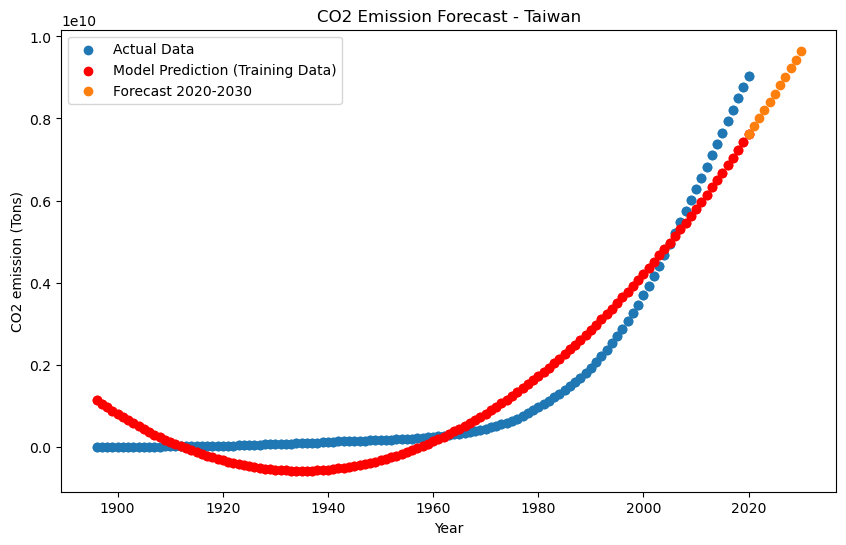

Tajikistan Metrics:
Tajikistan Predictions (2020-2030):
2020: 510490568.20414734
2021: 518609141.43963623
2022: 526787834.7855072
2023: 535026648.2418213
2024: 543325581.8085175
2025: 551684635.485672
2026: 560103809.2732239
2027: 568583103.1711731
2028: 577122517.1795654
2029: 585722051.2983398
2030: 594381705.5275574


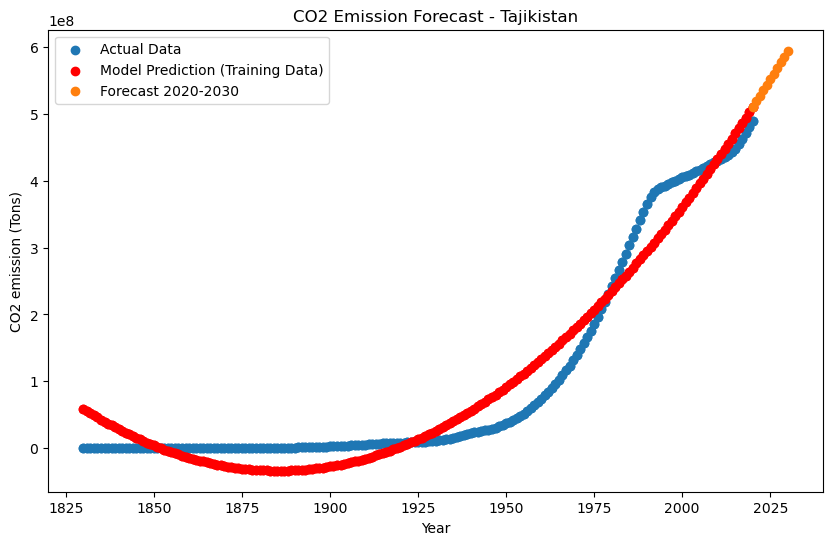

Tanzania Metrics:
Tanzania Predictions (2020-2030):
2020: 212377402.20010376
2021: 218982011.18045044
2022: 225691199.33926392
2023: 232504966.67660522
2024: 239423313.1925354
2025: 246446238.88693237
2026: 253573743.75994873
2027: 260805827.81143188
2028: 268142491.04144287
2029: 275583733.4500427
2030: 283129555.0371399


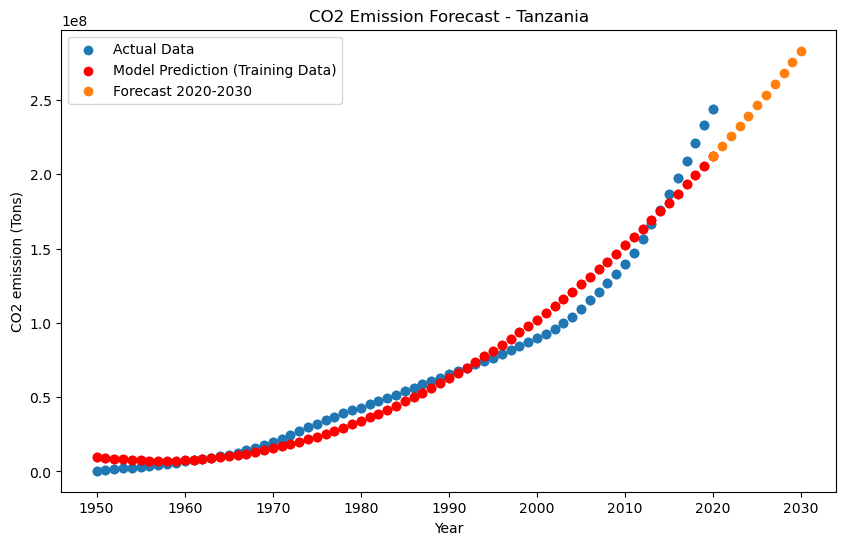

Thailand Metrics:
Thailand Predictions (2020-2030):
2020: 6621234888.541992
2021: 6847463024.5546875
2022: 7077263726.6015625
2023: 7310636994.6796875
2024: 7547582828.7890625
2025: 7788101228.931641
2026: 8032192195.107422
2027: 8279855727.314453
2028: 8531091825.551758
2029: 8785900489.824219
2030: 9044281720.12793


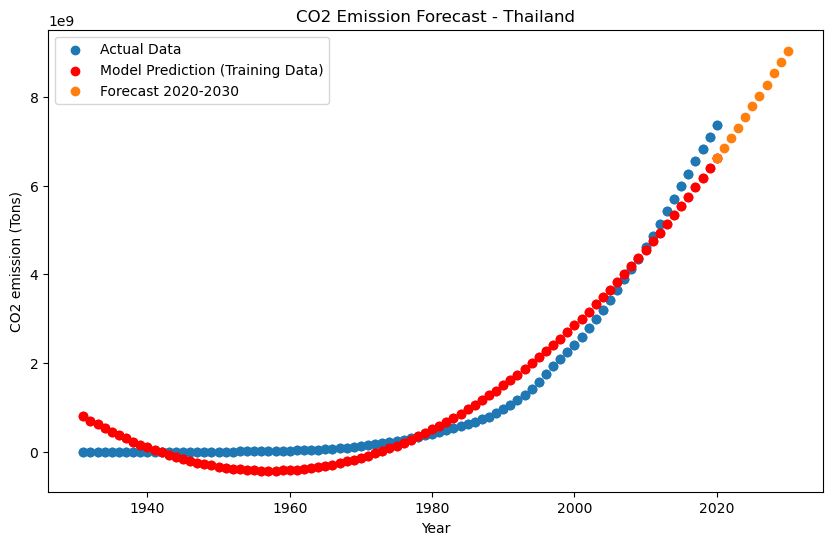

Timor Metrics:
Timor Predictions (2020-2030):
2020: 6690462.460166931
2021: 7366593.9401474
2022: 8076335.560775757
2023: 8819687.322036743
2024: 9596649.223945618
2025: 10407221.266494751
2026: 11251403.449699402
2027: 12129195.773529053
2028: 13040598.238006592
2029: 13985610.843147278
2030: 14964233.588912964


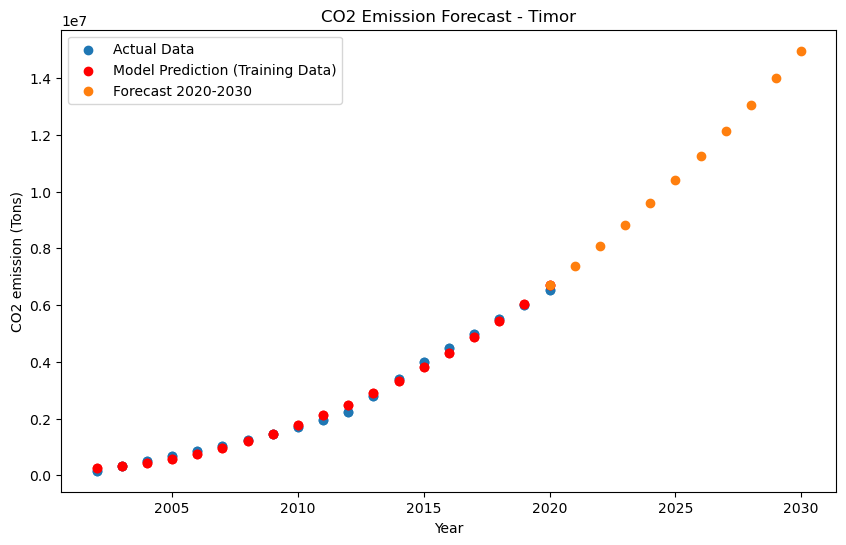

Togo Metrics:
Togo Predictions (2020-2030):
2020: 64990850.85797119
2021: 67216924.88458252
2022: 69480414.4564209
2023: 71781319.57337952
2024: 74119640.23553467
2025: 76495376.44285583
2026: 78908528.19537354
2027: 81359095.49305725
2028: 83847078.33590698
2029: 86372476.72392273
2030: 88935290.65715027


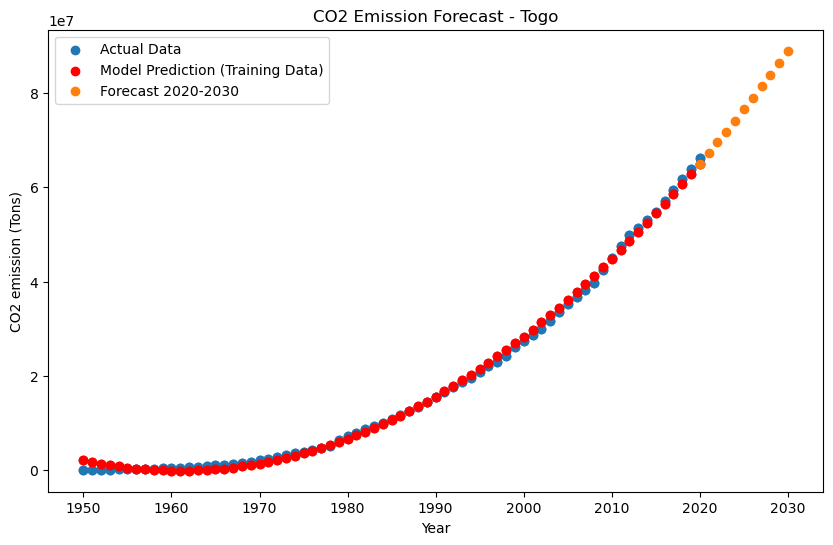

Tonga Metrics:
Tonga Predictions (2020-2030):
2020: 4378012.916275024
2021: 4523261.6401433945
2022: 4670899.107668877
2023: 4820925.318853378
2024: 4973340.273695946
2025: 5128143.972194672
2026: 5285336.414353371
2027: 5444917.600169182
2028: 5606887.529641151
2029: 5771246.202773094
2030: 5937993.619561195


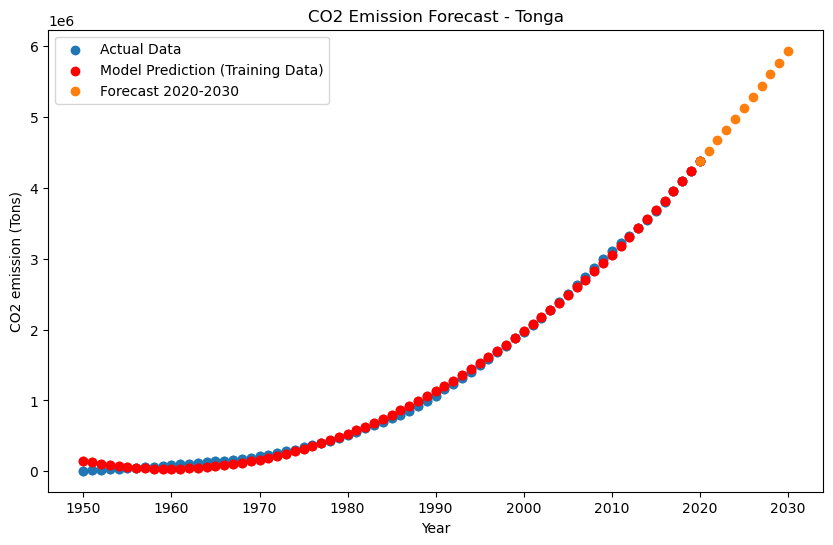

Trinidad and Tobago Metrics:
Trinidad and Tobago Predictions (2020-2030):
2020: 1406955681.9517822
2021: 1437839370.3303223
2022: 1469062053.8153076
2023: 1500623732.4069824
2024: 1532524406.1049805
2025: 1564764074.909668
2026: 1597342738.8205566
2027: 1630260397.8382568
2028: 1663517051.9621582
2029: 1697112701.192749
2030: 1731047345.529541


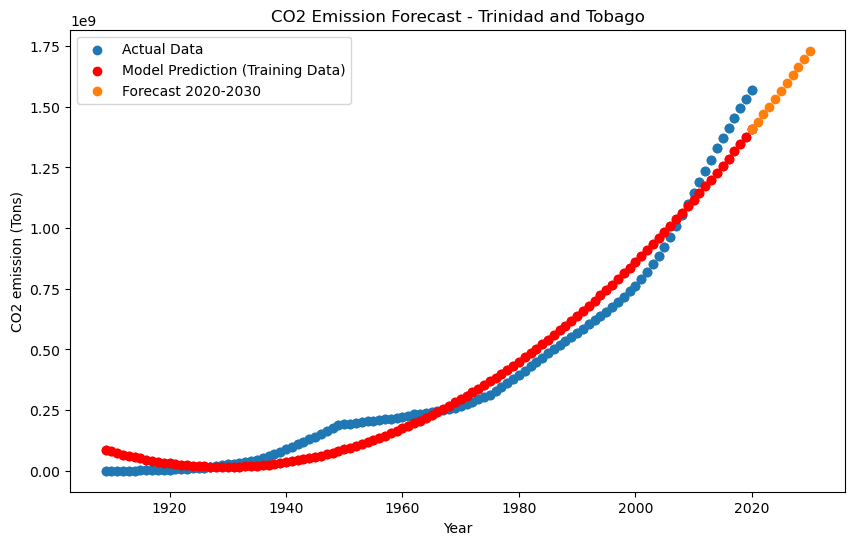

Tunisia Metrics:
Tunisia Predictions (2020-2030):
2020: 822866533.5170898
2021: 846094632.9699707
2022: 869629950.1069336
2023: 893472484.9282227
2024: 917622237.4334717
2025: 942079207.6226807
2026: 966843395.4960938
2027: 991914801.053833
2028: 1017293424.2954102
2029: 1042979265.2210693
2030: 1068972323.8308105


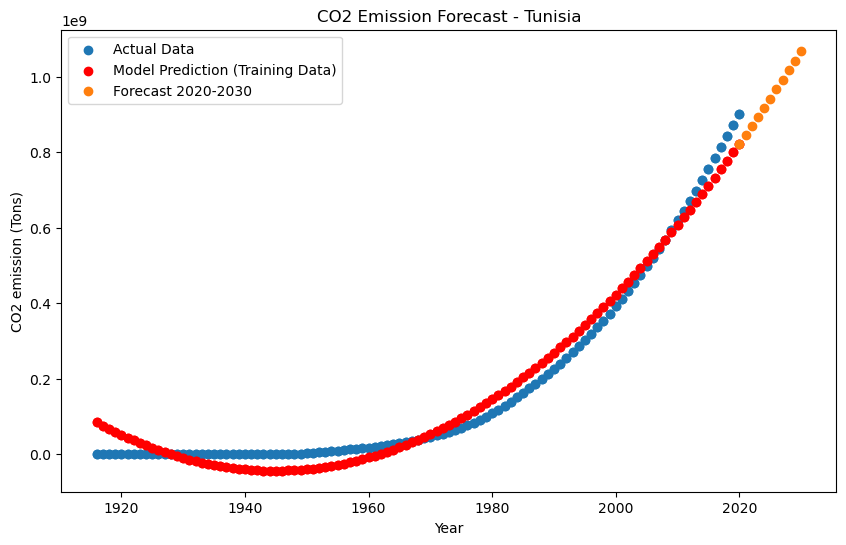

Turkey Metrics:
Turkey Predictions (2020-2030):
2020: 7908389363.321777
2021: 8077491982.836914
2022: 8248223859.069824
2023: 8420584992.019043
2024: 8594575381.686035
2025: 8770195028.069824
2026: 8947443931.169922
2027: 9126322090.987793
2028: 9306829507.521973
2029: 9488966180.773926
2030: 9672732110.7417


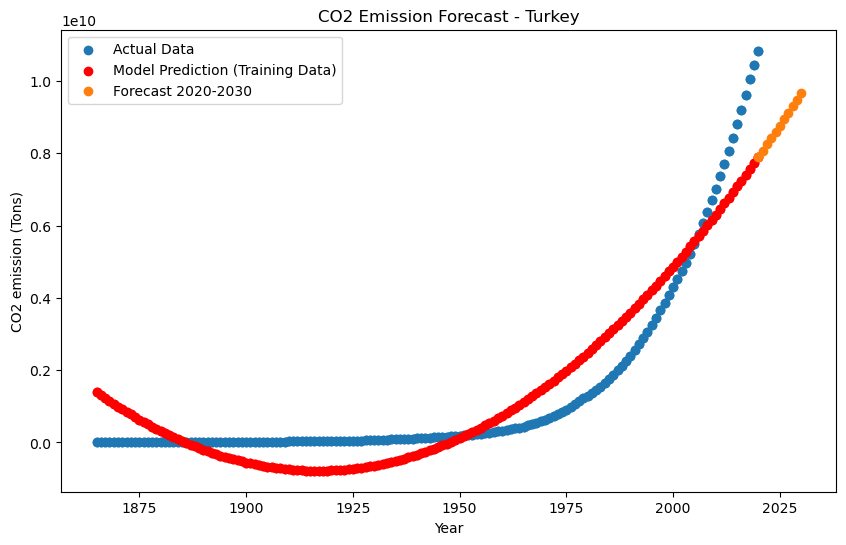

Turkmenistan Metrics:
Turkmenistan Predictions (2020-2030):
2020: 1873089374.286316
2021: 1905187939.6116333
2022: 1937536263.3909912
2023: 1970134345.6245117
2024: 2002982186.3120728
2025: 2036079785.4537354
2026: 2069427143.0494995
2027: 2103024259.0993042
2028: 2136871133.6032104
2029: 2170967766.5612793
2030: 2205314157.9733276


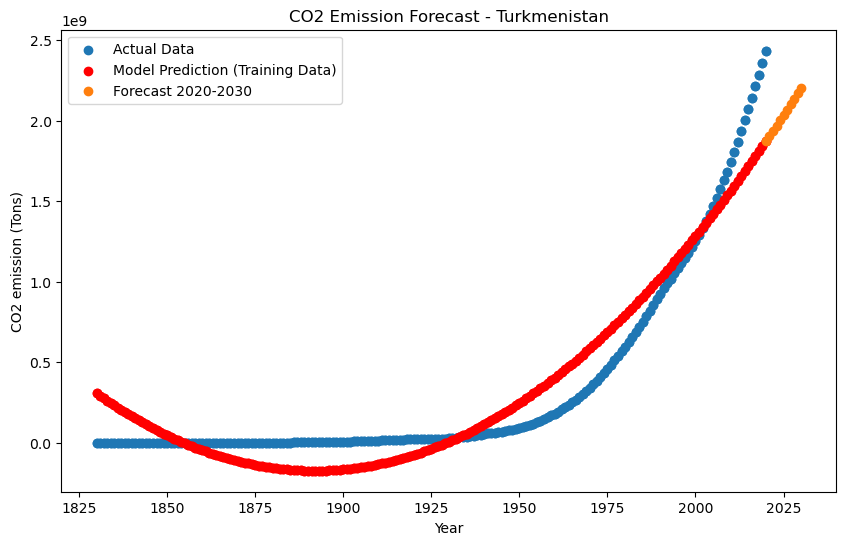

Turks and Caicos Islands Metrics:
Turks and Caicos Islands Predictions (2020-2030):
2020: 3989852.2343883514
2021: 4252573.15032959
2022: 4523810.144226074
2023: 4803563.216070175
2024: 5091832.365869522
2025: 5388617.593626022
2026: 5693918.899330139
2027: 6007736.282987595
2028: 6330069.744602203
2029: 6660919.284164429
2030: 7000284.901679993


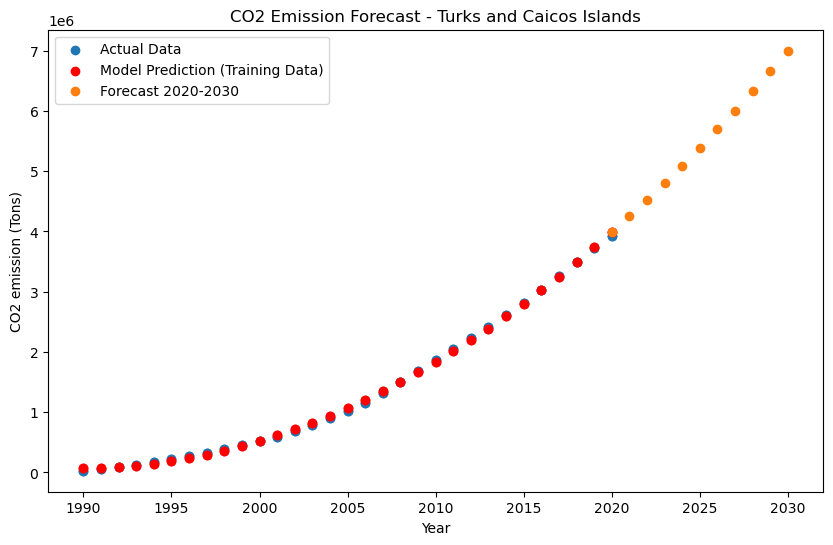

Tuvalu Metrics:
Tuvalu Predictions (2020-2030):
2020: 287484.6110710278
2021: 297488.79733105004
2022: 307532.50650794804
2023: 317615.7386017218
2024: 327738.49361237884
2025: 337900.7715399042
2026: 348102.57238431275
2027: 358343.8961455971
2028: 368624.74282375723
2029: 378945.11241879314
2030: 389305.00493070483


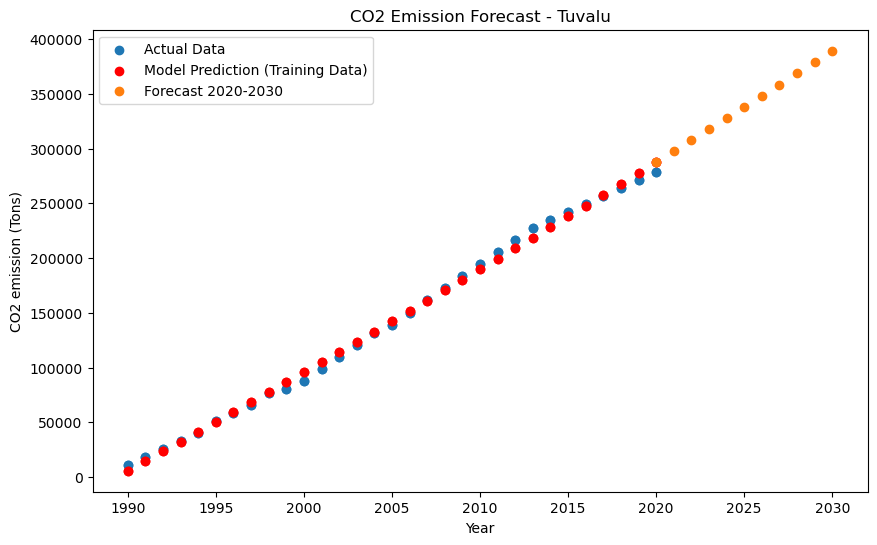

Uganda Metrics:
Uganda Predictions (2020-2030):
2020: 89779299.00772095
2021: 92549614.10089111
2022: 95363708.52557373
2023: 98221582.28175354
2024: 101123235.36947632
2025: 104068667.78868103
2026: 107057879.53938293
2027: 110090870.62159729
2028: 113167641.03535461
2029: 116288190.78056335
2030: 119452519.8572998


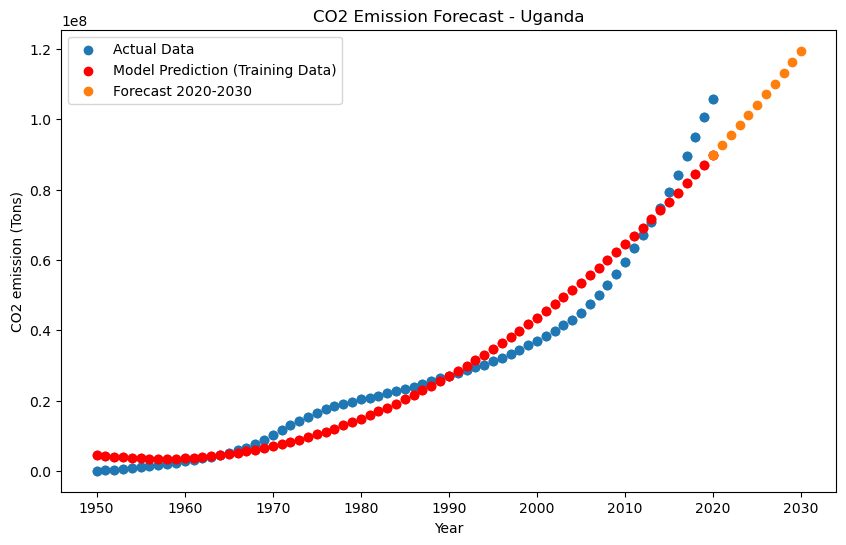

Ukraine Metrics:
Ukraine Predictions (2020-2030):
2020: 31769697503.66504
2021: 32283981706.152344
2022: 32802121145.989258
2023: 33324115823.17578
2024: 33849965737.708984
2025: 34379670889.59375
2026: 34913231278.828125
2027: 35450646905.41016
2028: 35991917769.34277
2029: 36537043870.625
2030: 37086025209.25488


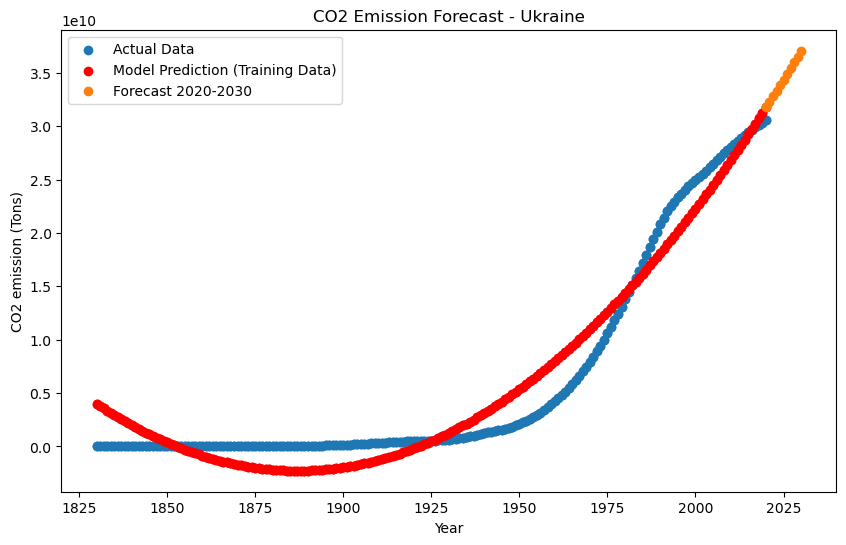

United Arab Emirates Metrics:
United Arab Emirates Predictions (2020-2030):
2020: 4549700743.692383
2021: 4728742762.388672
2022: 4911248626.577148
2023: 5097218336.254883
2024: 5286651891.426758
2025: 5479549292.089844
2026: 5675910538.244141
2027: 5875735629.890625
2028: 6079024567.029297
2029: 6285777349.65918
2030: 6495993977.77832


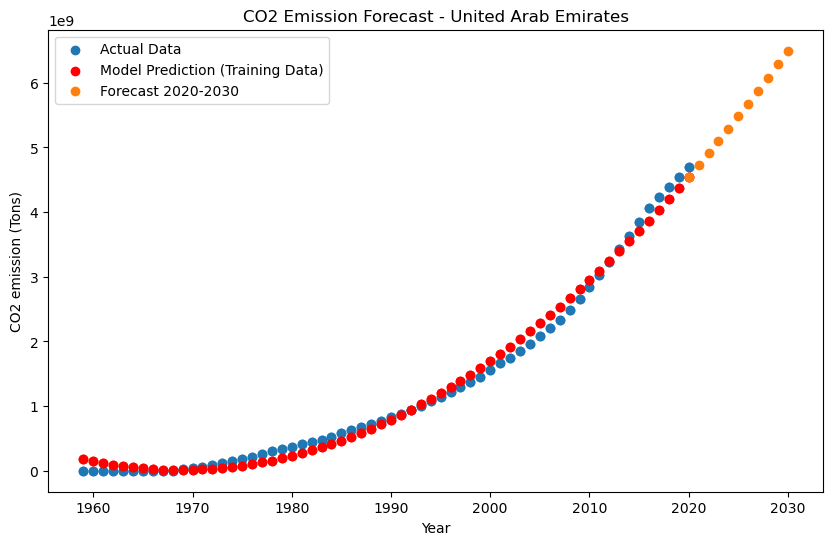

United Kingdom Metrics:
United Kingdom Predictions (2020-2030):
2020: 82194031527.125
2021: 82927013357.26074
2022: 83663222052.19043
2023: 84402657611.90723
2024: 85145320036.41797
2025: 85891209325.7168
2026: 86640325479.8086
2027: 87392668498.68848
2028: 88148238382.35938
2029: 88907035130.82324
2030: 89669058744.0752


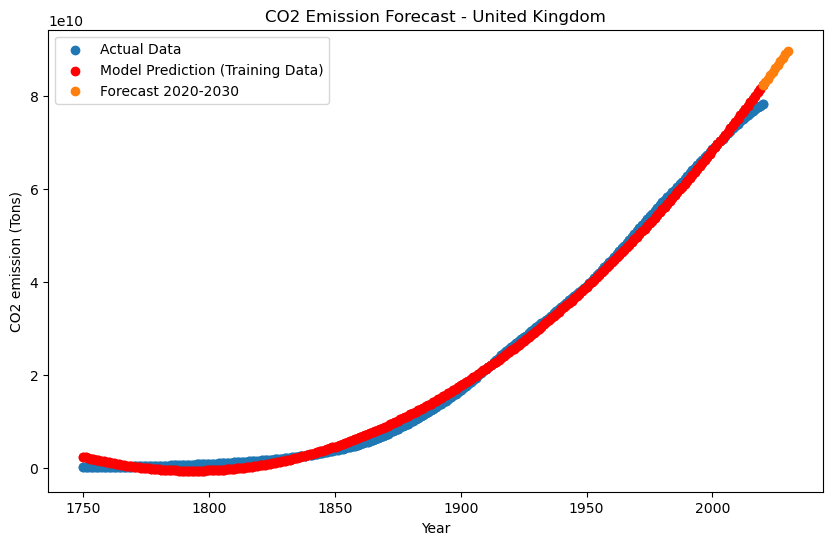

United States Metrics:
United States Predictions (2020-2030):
2020: 244353982148.19922
2021: 247238792402.84375
2022: 250140118142.1875
2023: 253057959366.22266
2024: 255992316074.96484
2025: 258943188268.39844
2026: 261910575946.53906
2027: 264894479109.3789
2028: 267894897756.91406
2029: 270911831889.15234
2030: 273945281506.08594


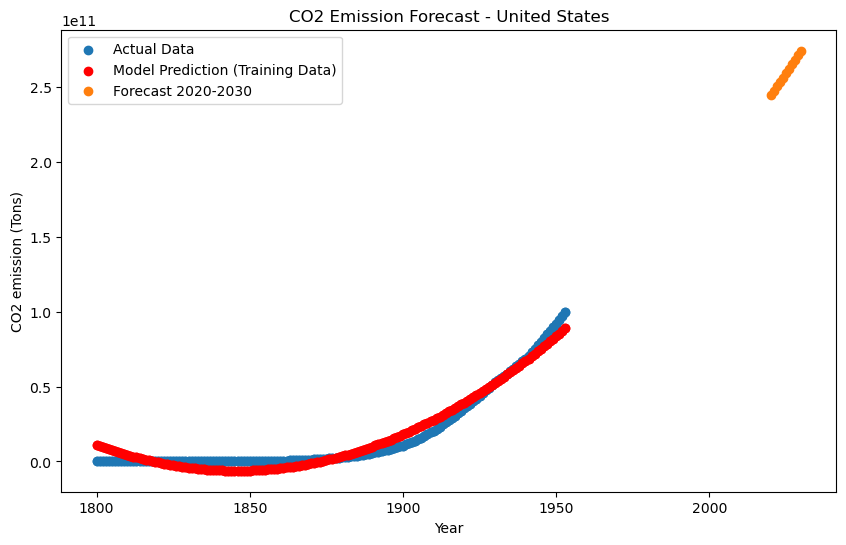

Uruguay Metrics:
Uruguay Predictions (2020-2030):
2020: 376240493.610199
2021: 383605156.6240692
2022: 391034210.83654785
2023: 398527656.2476196
2024: 406085492.857254
2025: 413707720.6654968
2026: 421394339.67233276
2027: 429145349.8777313
2028: 436960751.2817383
2029: 444840543.8843384
2030: 452784727.68548584


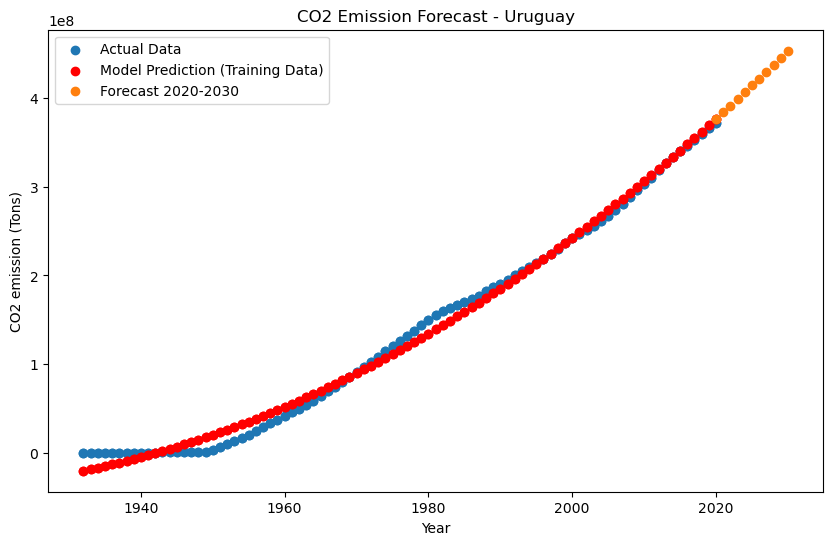

Uzbekistan Metrics:
Uzbekistan Predictions (2020-2030):
2020: 5534768358.225342
2021: 5628233605.718262
2022: 5722419327.904785
2023: 5817325524.784424
2024: 5912952196.357178
2025: 6009299342.622314
2026: 6106366963.581299
2027: 6204155059.233154
2028: 6302663629.578125
2029: 6401892674.615723
2030: 6501842194.346924


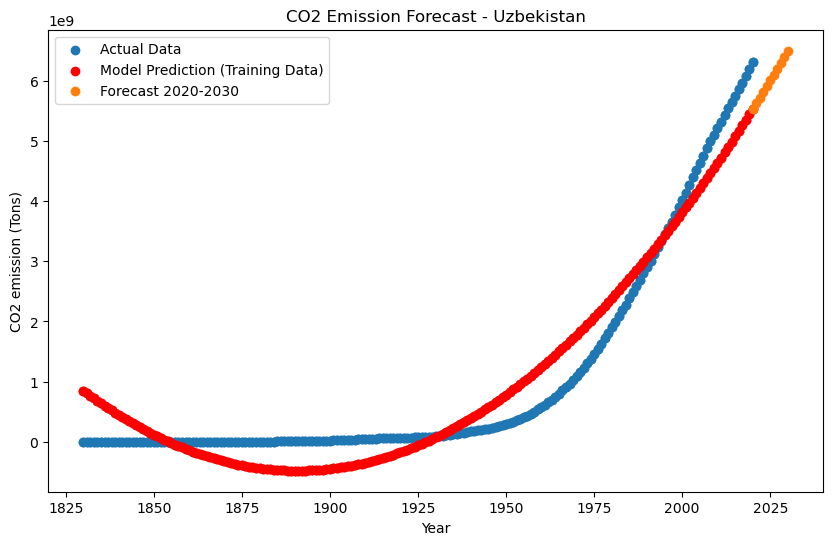

Vanuatu Metrics:
Vanuatu Predictions (2020-2030):
2020: 4482948.9713253975
2021: 4598826.624500275
2022: 4716107.1718091965
2023: 4834790.613251209
2024: 4954876.948828697
2025: 5076366.17854023
2026: 5199258.30238533
2027: 5323553.320364952
2028: 5449251.232478619
2029: 5576352.038726807
2030: 5704855.739109516


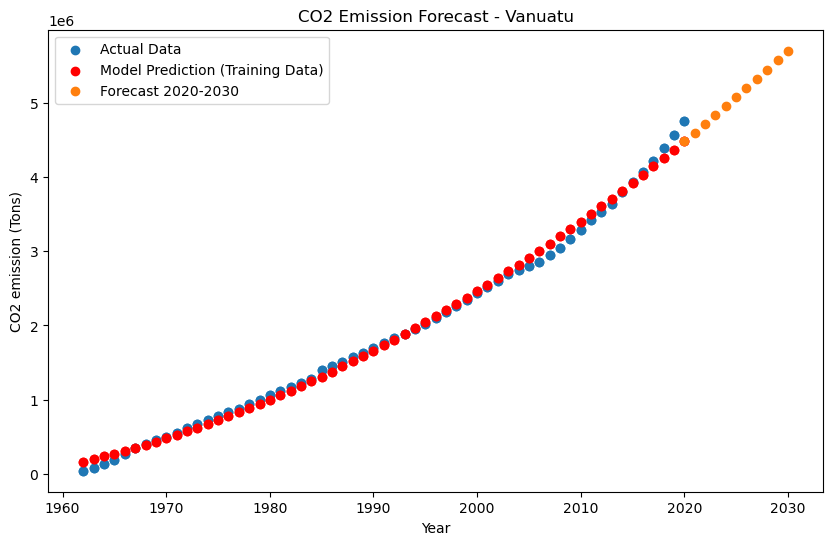

Venezuela Metrics:
Venezuela Predictions (2020-2030):
2020: 7798770833.704102
2021: 7973155994.937012
2022: 8149431118.052734
2023: 8327596203.050293
2024: 8507651249.930664
2025: 8689596258.692383
2026: 8873431229.336914
2027: 9059156161.864258
2028: 9246771056.273926
2029: 9436275912.56543
2030: 9627670730.73877


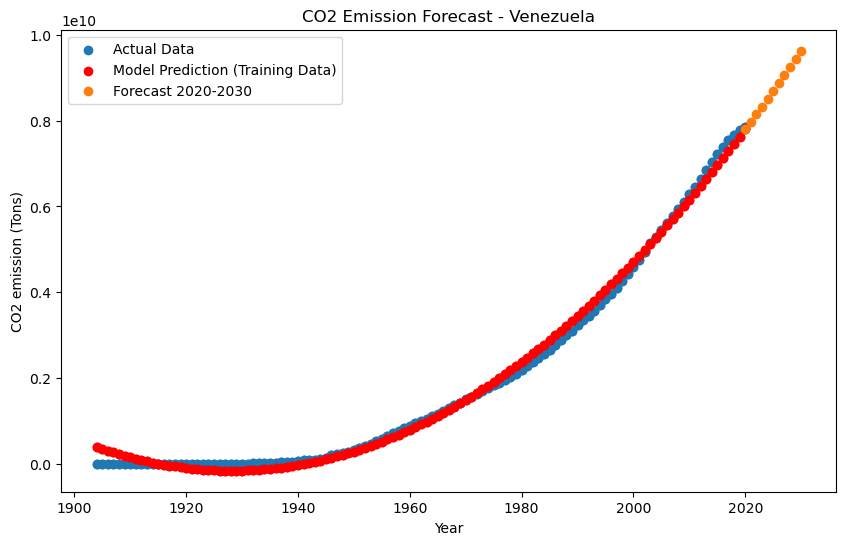

Vietnam Metrics:
Vietnam Predictions (2020-2030):
2020: 2660313612.3032227
2021: 2723766955.394043
2022: 2787928358.010498
2023: 2852797820.1533203
2024: 2918375341.821533
2025: 2984660923.0163574
2026: 3051654563.736328
2027: 3119356263.98291
2028: 3187766023.755127
2029: 3256883843.053467
2030: 3326709721.8774414


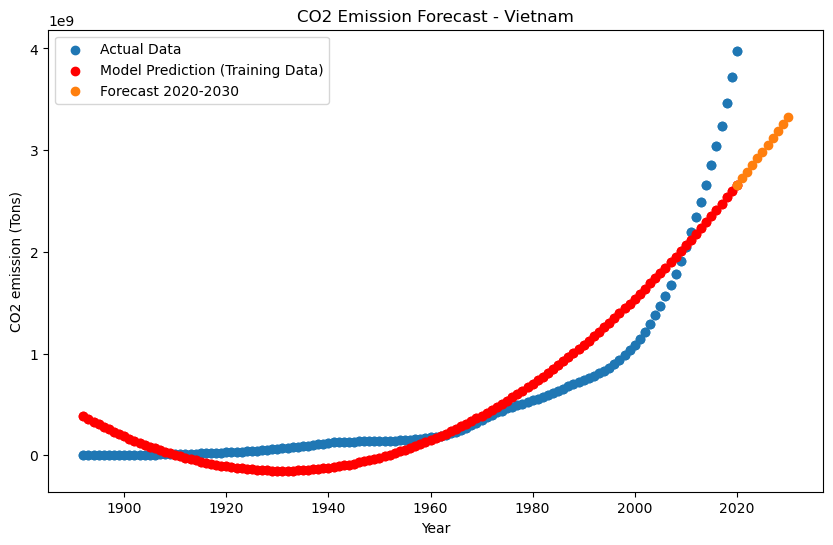

Wallis and Futuna Metrics:
Wallis and Futuna Predictions (2020-2030):
2020: 502906.65714383125
2021: 526218.954387188
2022: 549278.9383473396
2023: 572086.6090244055
2024: 594641.9664182663
2025: 616945.0105289221
2026: 638995.7413563728
2027: 660794.1589006186
2028: 682340.2631616592
2029: 703634.0541396141
2030: 724675.5318343639


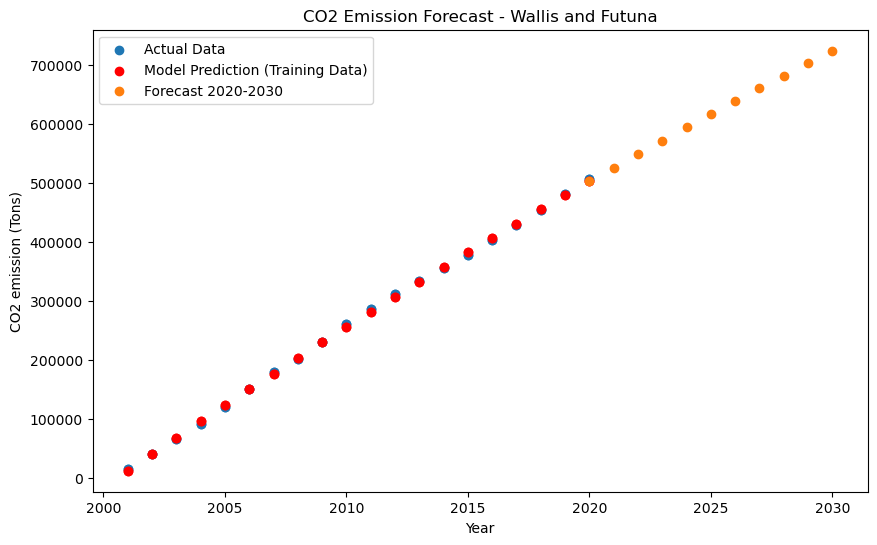

Yemen Metrics:
Yemen Predictions (2020-2030):
2020: 646080401.9658203
2021: 667027403.2784424
2022: 688316438.6119385
2023: 709947507.9658203
2024: 731920611.3404541
2025: 754235748.7355957
2026: 776892920.151123
2027: 799892125.5875244
2028: 823233365.0441895
2029: 846916638.5216064
2030: 870941946.0196533


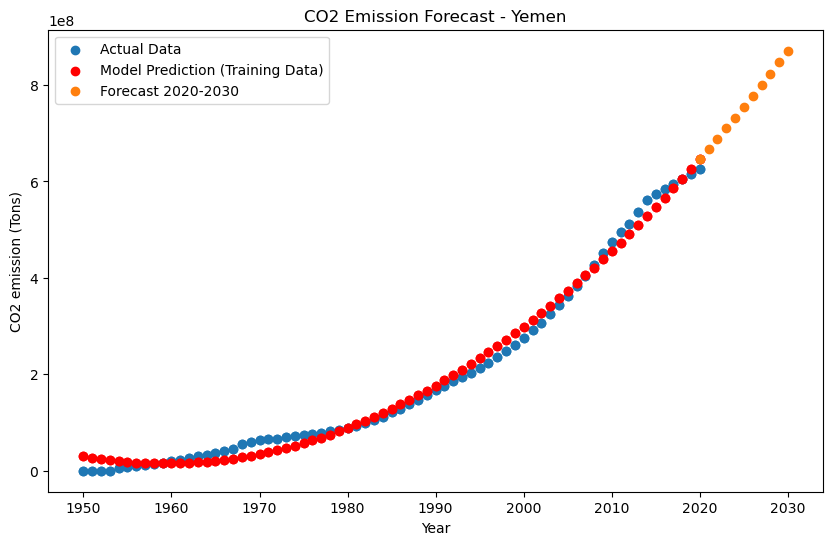

Zambia Metrics:
Zambia Predictions (2020-2030):
2020: 226302928.71437073
2021: 228612898.48122406
2022: 230897449.4932785
2023: 233156581.7504959
2024: 235390295.2529297
2025: 237598590.0005417
2026: 239781465.99332428
2027: 241938923.23130798
2028: 244070961.71448517
2029: 246177581.44282532
2030: 248258782.4163742


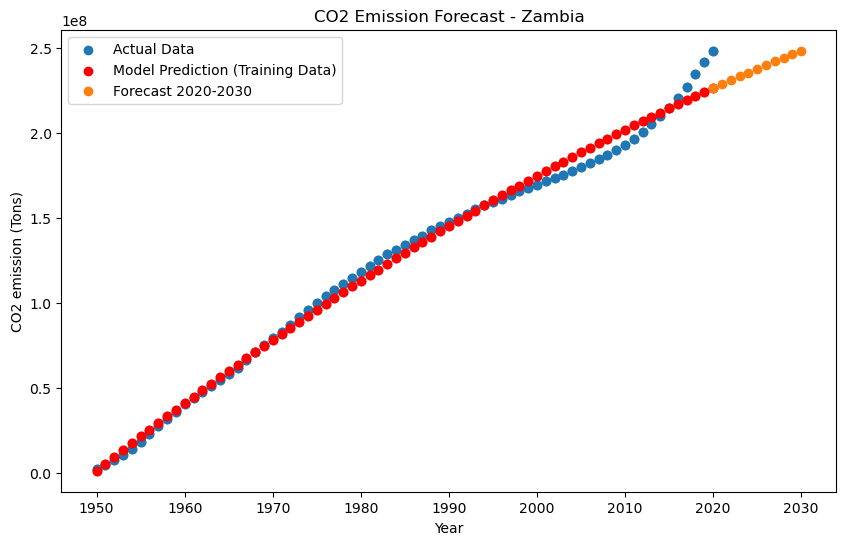

Zimbabwe Metrics:
Zimbabwe Predictions (2020-2030):
2020: 818836244.4234314
2021: 834490033.6065979
2022: 850292826.7817688
2023: 866244623.9490662
2024: 882345425.1085205
2025: 898595230.2600708
2026: 914994039.4037781
2027: 931541852.5396118
2028: 948238669.667572
2029: 965084490.7876892
2030: 982079315.8999023


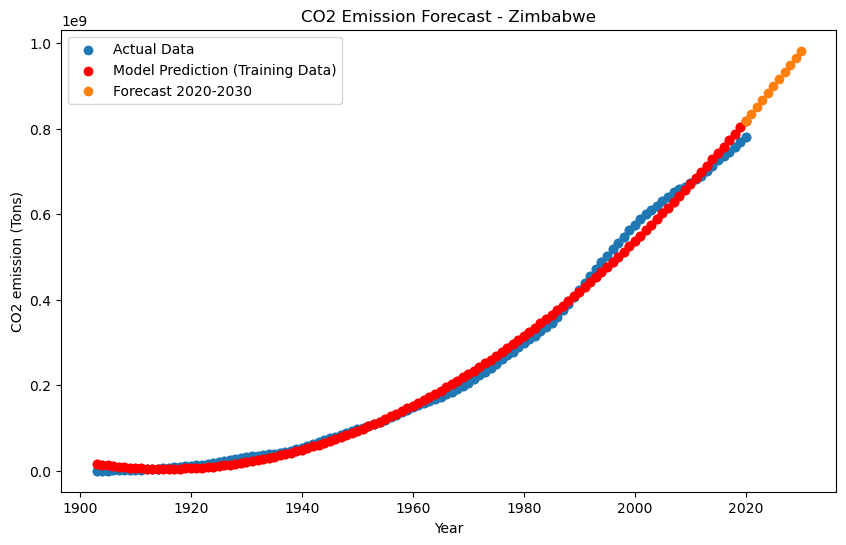

Overall Metrics:
Mean Absolute Error (MAE): 227573865.12490547
Mean Squared Error (MSE): 8.293770103563145e+17
Mean R-squared (R²) Score: 0.9778352952320032
Mean Root Mean Squared Error (RMSE): 265662022.29831323


In [177]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn import metrics
import matplotlib.pyplot as plt
import numpy as np

# Create empty dictionaries to store metrics for each country
mae_dict = {}
mse_dict = {}
r2_dict = {}
rmse_dict = {}

# Assuming you have a dictionary of DataFrames named country_dfs
for c_name, c_df in country_dfs.items():
    # Convert 'CO2 emission (Tons)' column to numeric
    c_df['CO2 emission (Tons)'] = pd.to_numeric(c_df['CO2 emission (Tons)'], errors='coerce')

    # Drop rows with missing values
    c_df_before_dropna = c_df.copy()  # Make a copy for debugging
    c_df = c_df.dropna()

    # Check if the DataFrame is empty after dropping missing values
    if c_df.empty:
        print(f"Warning: {c_name}'s DataFrame is empty after dropping missing values.")
        continue  # Skip to the next country

    # Prepare the data
    X = c_df[['Year']]
    y = c_df['CO2 emission (Tons)']

    # Choose the model - Linear Regression
    # model = LinearRegression()

    # Choose the model - Polynomial Regression (degree=2 for example, you can adjust)
    degree = 2
    model = make_pipeline(PolynomialFeatures(degree), LinearRegression())

    # Train the model
    model.fit(X, y)

    # Generate forecast for the years 2020-2030
    forecast_years = np.arange(2020, 2031).reshape(-1, 1)
    forecast_predictions = model.predict(forecast_years)

    # Print metrics for each country
    print(f'{c_name} Metrics:')
    
    # Since there's no test set, calculate metrics on the training data
    y_train_pred = model.predict(X)
    
    mae = metrics.mean_absolute_error(y, y_train_pred)
    mse = metrics.mean_squared_error(y, y_train_pred)
    r2 = metrics.r2_score(y, y_train_pred)
    rmse = np.sqrt(mse)

    # Store metrics in dictionaries
    mae_dict[c_name] = mae
    mse_dict[c_name] = mse
    r2_dict[c_name] = r2
    rmse_dict[c_name] = rmse

    # Print predictions for the years 2020-2030
    print(f'{c_name} Predictions (2020-2030):')
    for year, prediction in zip(range(2020, 2031), forecast_predictions):
        print(f'{year}: {prediction}')

    # Visualize historical data, model predictions, and forecasts on a single plot
    plt.figure(figsize=(10, 6))
    plt.scatter(X['Year'], y, label='Actual Data')
    plt.scatter(X['Year'], y_train_pred, color='red', label='Model Prediction (Training Data)')
    plt.scatter(forecast_years, forecast_predictions, label='Forecast 2020-2030')
    plt.xlabel('Year')
    plt.ylabel('CO2 emission (Tons)')
    plt.title(f'CO2 Emission Forecast - {c_name}')
    plt.legend()
    plt.show()

# Print overall metrics for all countries
print('Overall Metrics:')
print(f'Mean Absolute Error (MAE): {np.mean(list(mae_dict.values()))}')
print(f'Mean Squared Error (MSE): {np.mean(list(mse_dict.values()))}')
print(f'Mean R-squared (R²) Score: {np.mean(list(r2_dict.values()))}')
print(f'Mean Root Mean Squared Error (RMSE): {np.mean(list(rmse_dict.values()))}')